In [1]:
!pip install botorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 738.3/738.3 kB 19.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 277.7/277.7 kB 31.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.3/176.3 kB 21.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 55.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 124.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 97.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 56.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 43.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

Creating UTS/YS model predictions

In [73]:
import pandas as pd
import os

def create_uts_ys_ratio_prediction(split, directory="."):
    # File paths
    file_uts = os.path.join(directory, f"model_predictionsUTS_{split}.xlsx")
    file_ys = os.path.join(directory, f"model_predictionsYS_{split}.xlsx")
    file_out = os.path.join(directory, f"model_predictionsUTS_YS_{split}.xlsx")

    # Load Excel files
    xl_uts = pd.read_excel(file_uts, sheet_name=None)
    xl_ys = pd.read_excel(file_ys, sheet_name=None)

    output_dict = {}

    for sheet in ["Train Results", "Test Results"]:
        if sheet in xl_uts and sheet in xl_ys:
            df_uts = xl_uts[sheet]
            df_ys = xl_ys[sheet]

            # Ensure both have the same number of rows
            assert len(df_uts) == len(df_ys), f"Mismatch in {sheet} rows"

            df_combined = df_uts[input_vars].copy()

            # Compute ratios safely
            df_combined["Actual_UTS/YS"] = df_uts.filter(like="Actual").values.ravel() / df_ys.filter(like="Actual").values.ravel()
            df_combined["Predicted_UTS/YS"] = df_uts.filter(like="Predicted").values.ravel() / df_ys.filter(like="Predicted").values.ravel()

            # Drop old UTS/YS columns if present (just in case)
            df_combined = df_combined.drop(columns=[col for col in df_combined.columns if "UTS/YS" in col and col not in ["Actual_UTS/YS", "Predicted_UTS/YS"]], errors='ignore')

            output_dict[sheet] = df_combined

    # Save to new Excel file
    with pd.ExcelWriter(file_out, engine='openpyxl') as writer:
        for sheet_name, df in output_dict.items():
            df.to_excel(writer, sheet_name=sheet_name, index=False)

    print(f"✅ Created: {file_out}")


for split in range(5):
    create_uts_ys_ratio_prediction(split, directory=".")



✅ Created: ./model_predictionsUTS_YS_0.xlsx
✅ Created: ./model_predictionsUTS_YS_1.xlsx
✅ Created: ./model_predictionsUTS_YS_2.xlsx
✅ Created: ./model_predictionsUTS_YS_3.xlsx
✅ Created: ./model_predictionsUTS_YS_4.xlsx


Reduction=5 All task Main Prior


=== Split 0 ===
✓ Prior predictions loaded successfully
11 ___________________________
11 ___________________________
11 ___________________________
11 ___________________________
train_fullx_scaled: (1044, 9)
train_fully: (1044, 1)
train_fully_scaled: (1044, 1)
train_fullprior: (1044,)
test_fullx_scaled: (265, 9)
test_fully: (265, 1)
test_fully_scaled: (265, 1)
test_fullprior: (265,)
output_scaler: 11
10 __________________________final i_______________________________--
Epoch 1/3000 - Train Loss: 6.152 - Val Loss: 7.104
Epoch 51/3000 - Train Loss: 1.440 - Val Loss: 2.497
Epoch 101/3000 - Train Loss: 1.041 - Val Loss: 2.178
Epoch 151/3000 - Train Loss: 0.941 - Val Loss: 2.170
Early stopping at epoch 164


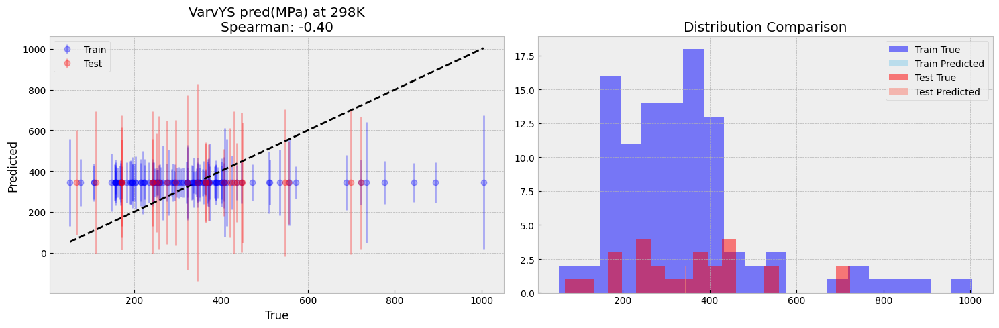

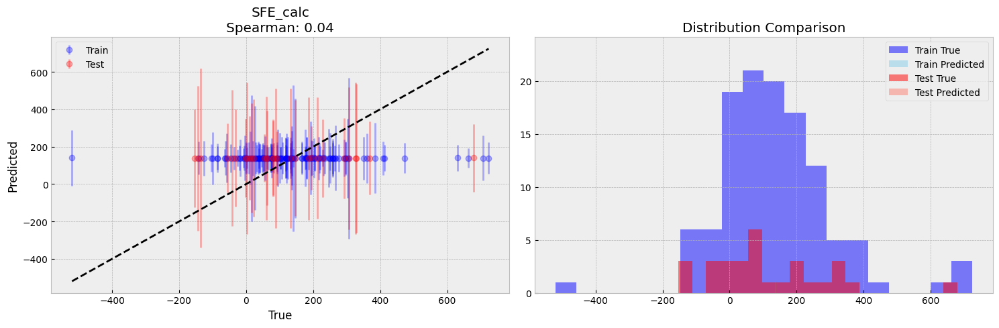

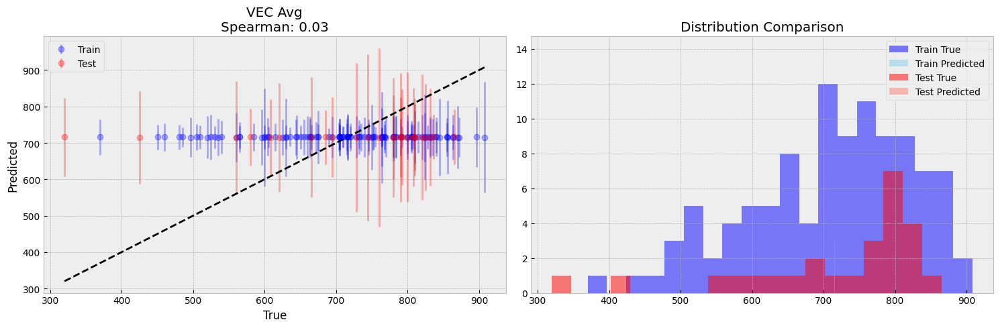

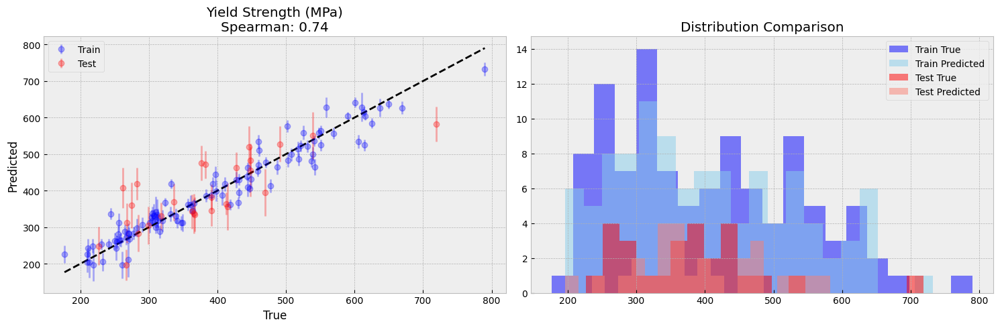

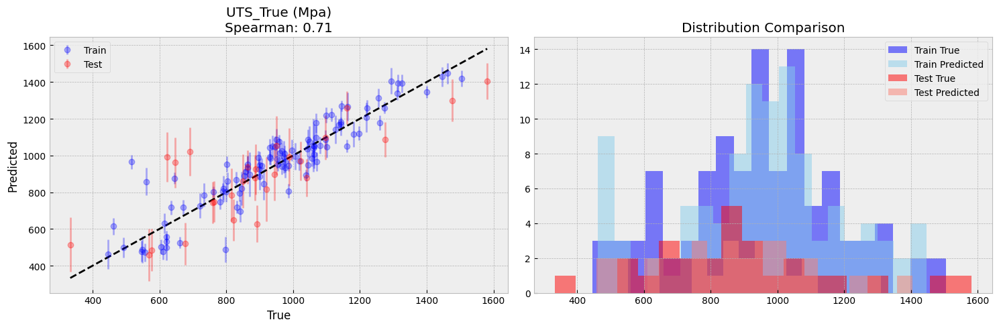

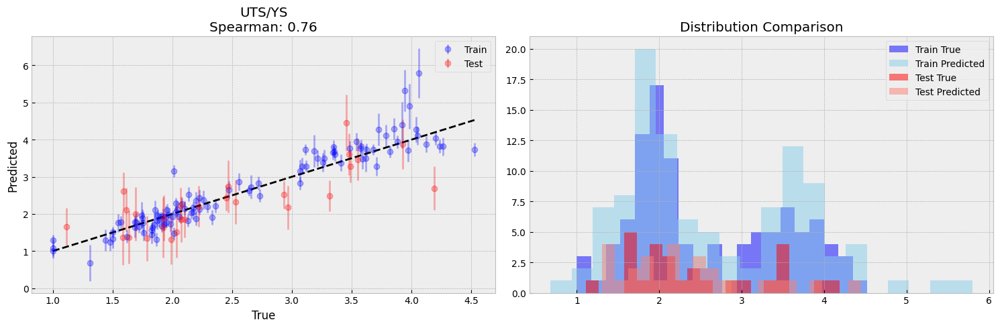

<ipython-input-74-fb09ce7f132e>:2150: RuntimeWarning: divide by zero encountered in divide
  train_rmspe = np.sqrt(np.mean(np.square((train_true_task - train_preds) / train_true_task)))
<ipython-input-74-fb09ce7f132e>:2181: RuntimeWarning: divide by zero encountered in divide
  test_rmspe = np.sqrt(np.mean(np.square((test_true_task - test_preds) / test_true_task)))


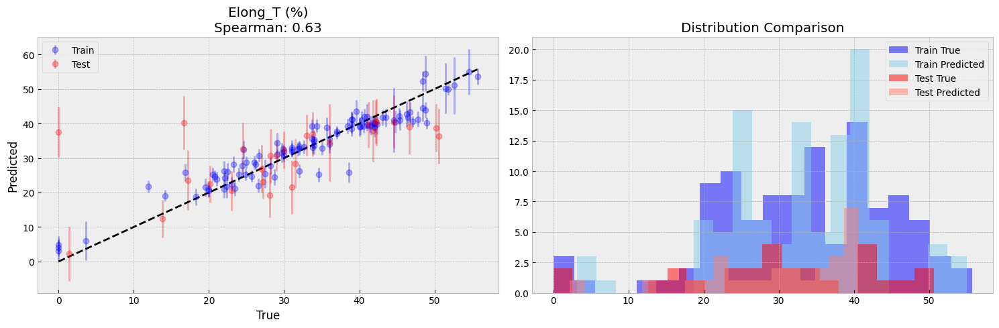

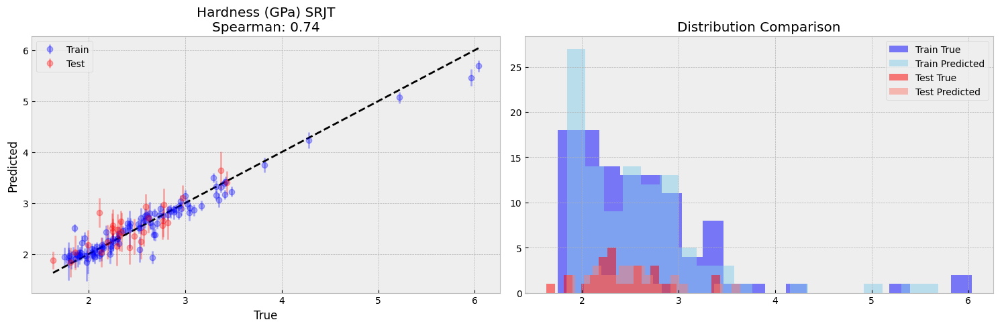

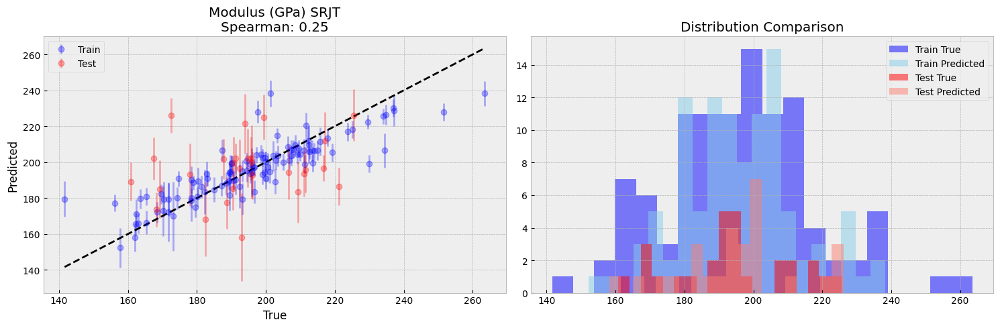

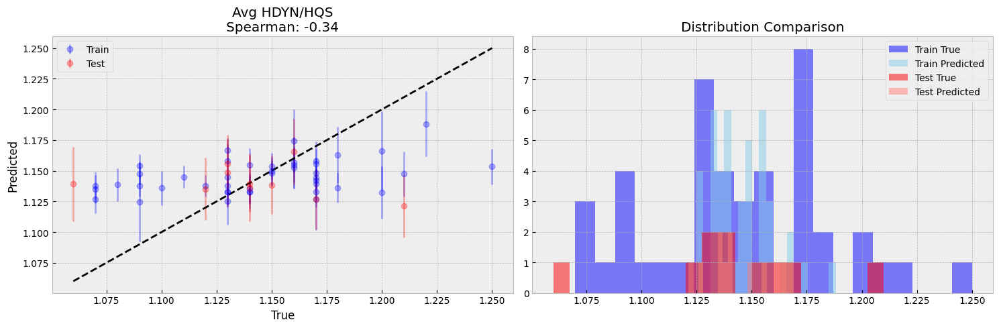

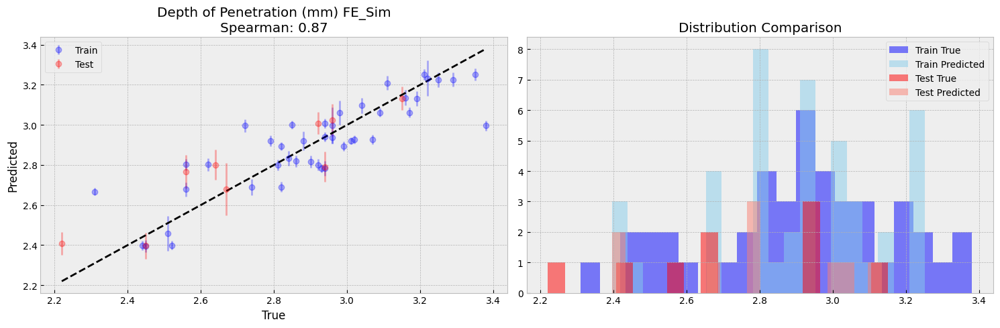


=== Split 1 ===
✓ Prior predictions loaded successfully
11 ___________________________
11 ___________________________
11 ___________________________
11 ___________________________
train_fullx_scaled: (1042, 9)
train_fully: (1042, 1)
train_fully_scaled: (1042, 1)
train_fullprior: (1042,)
test_fullx_scaled: (257, 9)
test_fully: (257, 1)
test_fully_scaled: (257, 1)
test_fullprior: (257,)
output_scaler: 11
10 __________________________final i_______________________________--
Epoch 1/3000 - Train Loss: 5.820 - Val Loss: 5.583
Epoch 51/3000 - Train Loss: 1.386 - Val Loss: 1.586
Epoch 101/3000 - Train Loss: 1.026 - Val Loss: 1.256
Epoch 151/3000 - Train Loss: 0.919 - Val Loss: 1.161
Epoch 201/3000 - Train Loss: 0.822 - Val Loss: 1.053
Epoch 251/3000 - Train Loss: 0.719 - Val Loss: 0.955
Epoch 301/3000 - Train Loss: 0.601 - Val Loss: 0.860
Epoch 351/3000 - Train Loss: 0.465 - Val Loss: 0.722
Epoch 401/3000 - Train Loss: 0.313 - Val Loss: 0.613
Epoch 451/3000 - Train Loss: 0.139 - Val Loss: 0.

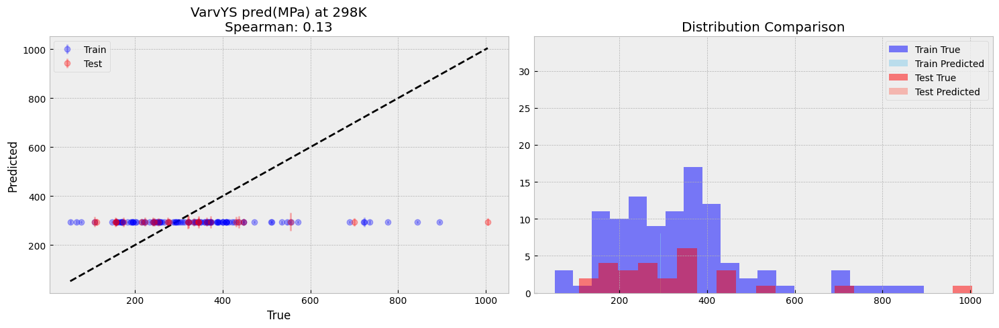

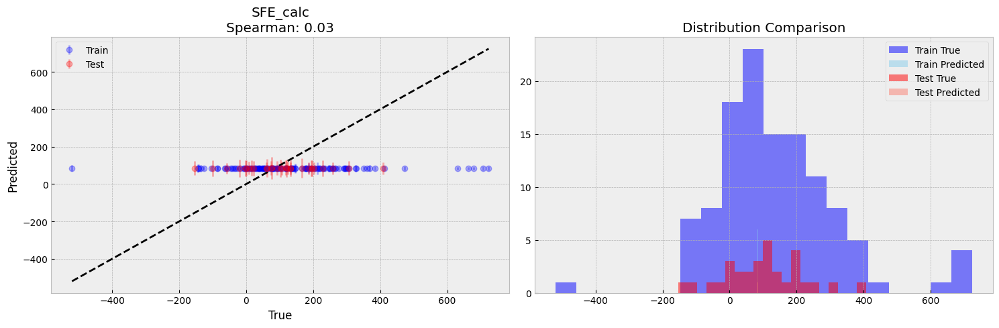

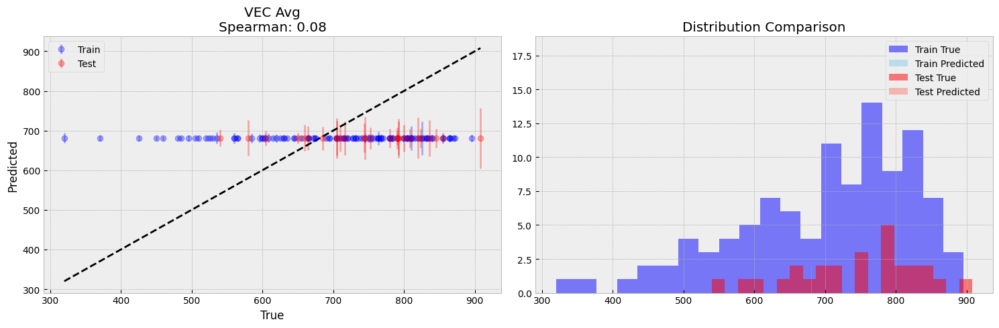

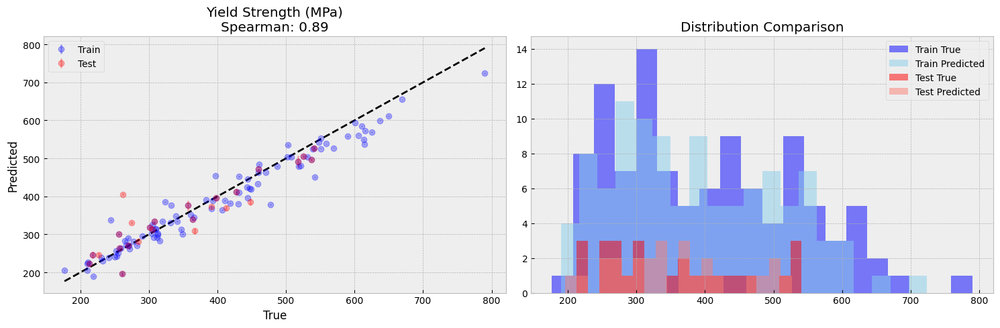

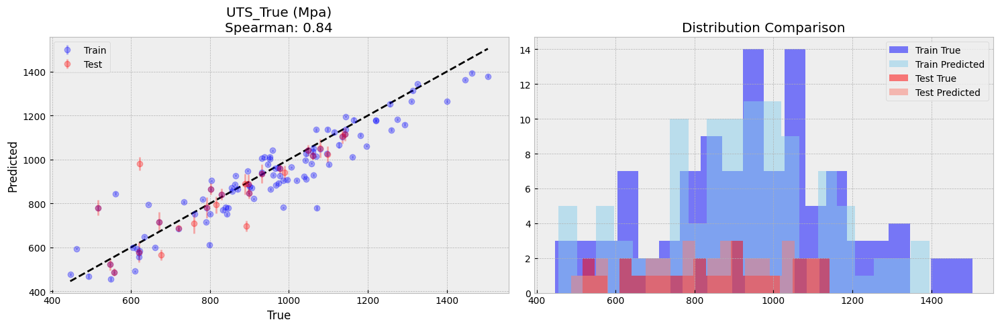

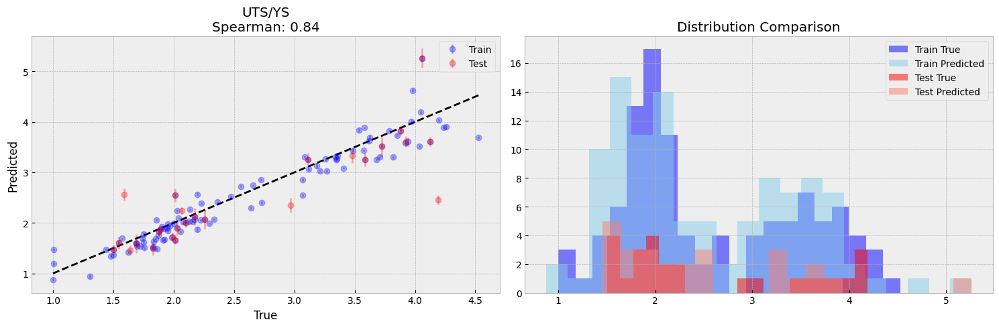

<ipython-input-74-fb09ce7f132e>:2150: RuntimeWarning: divide by zero encountered in divide
  train_rmspe = np.sqrt(np.mean(np.square((train_true_task - train_preds) / train_true_task)))
<ipython-input-74-fb09ce7f132e>:2181: RuntimeWarning: divide by zero encountered in divide
  test_rmspe = np.sqrt(np.mean(np.square((test_true_task - test_preds) / test_true_task)))


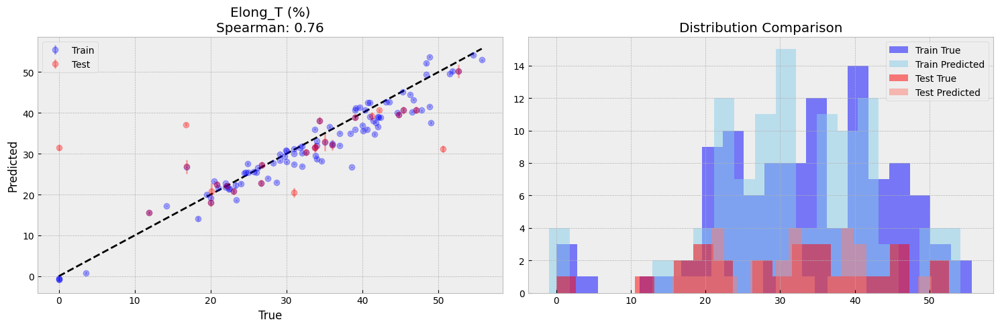

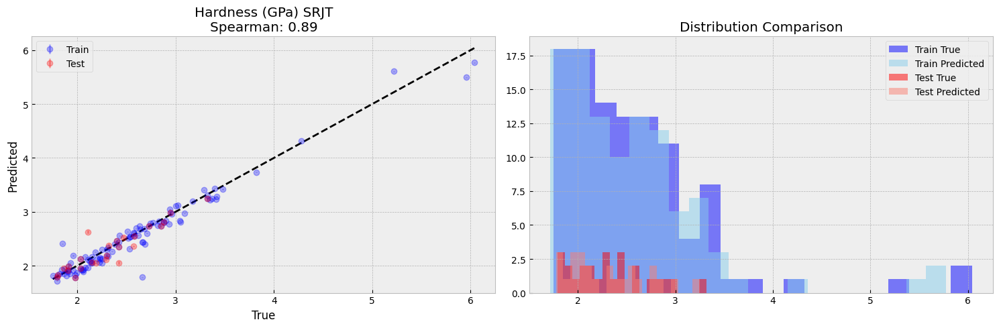

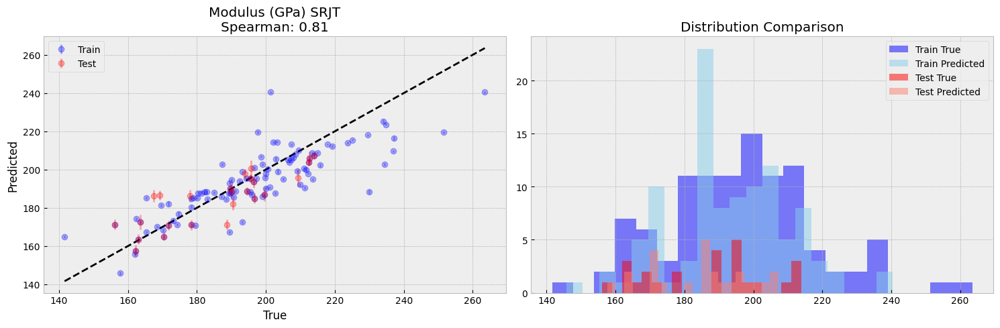

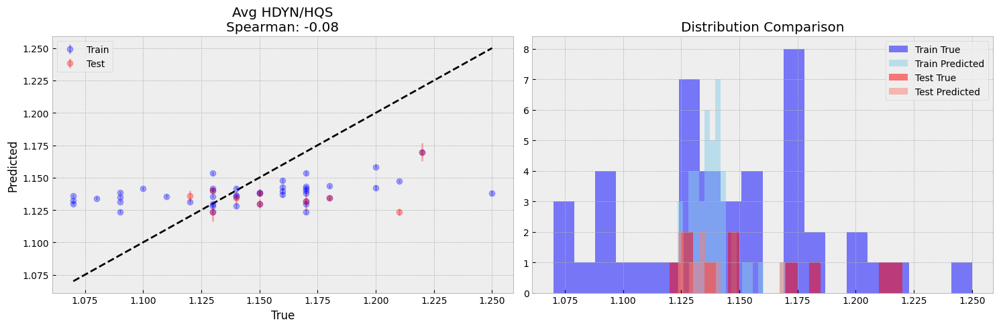

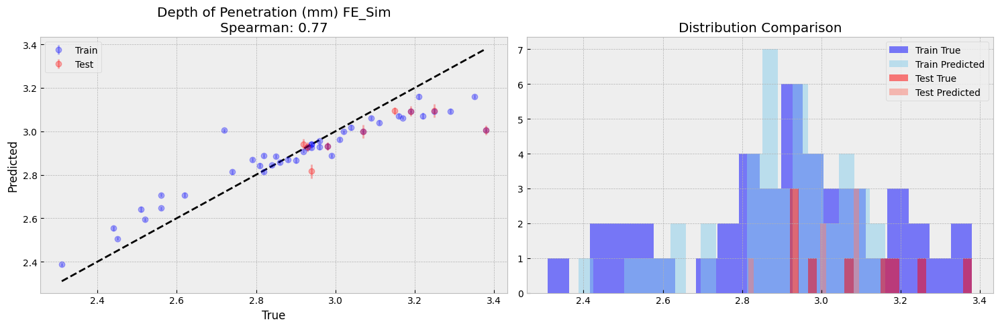


=== Split 2 ===
✓ Prior predictions loaded successfully
11 ___________________________
11 ___________________________
11 ___________________________
11 ___________________________
train_fullx_scaled: (1042, 9)
train_fully: (1042, 1)
train_fully_scaled: (1042, 1)
train_fullprior: (1042,)
test_fullx_scaled: (266, 9)
test_fully: (266, 1)
test_fully_scaled: (266, 1)
test_fullprior: (266,)
output_scaler: 11
10 __________________________final i_______________________________--
Epoch 1/3000 - Train Loss: 6.312 - Val Loss: 10.143
Epoch 51/3000 - Train Loss: 1.469 - Val Loss: 4.852
Epoch 101/3000 - Train Loss: 1.053 - Val Loss: 4.594
Early stopping at epoch 141


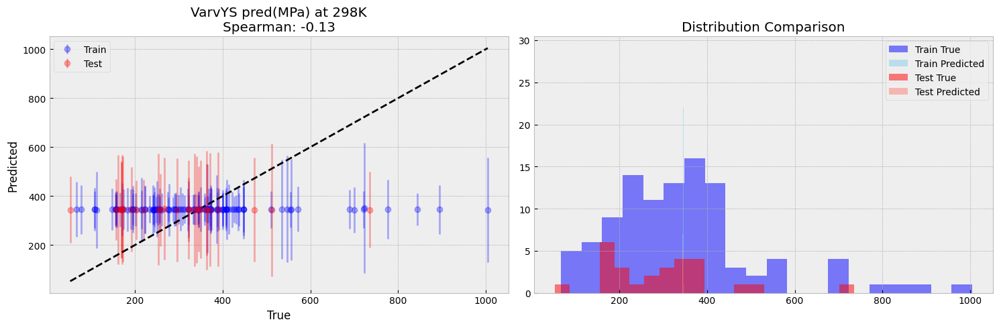

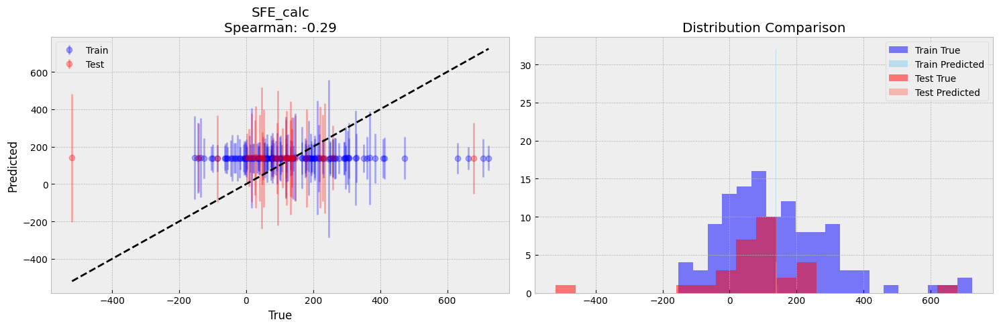

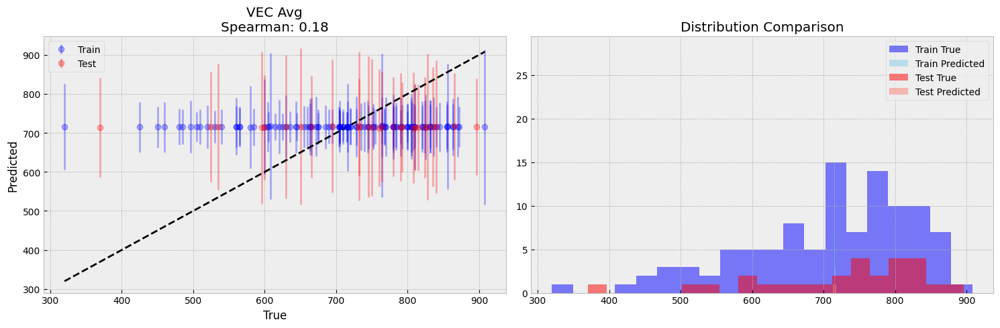

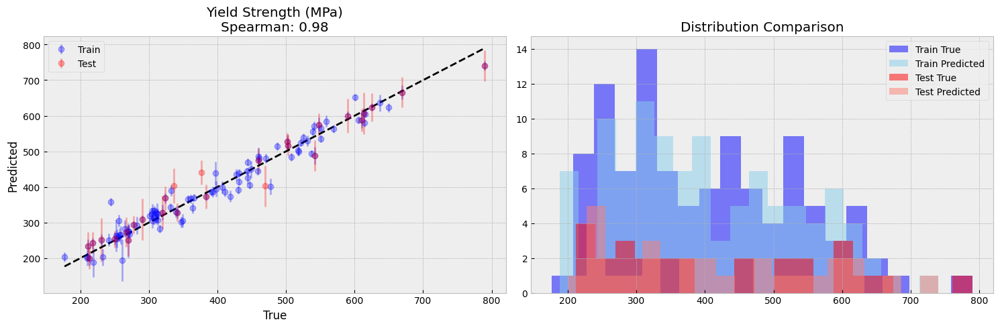

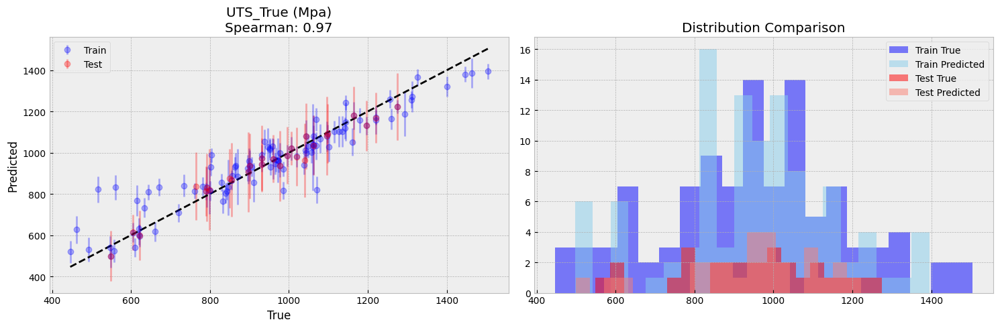

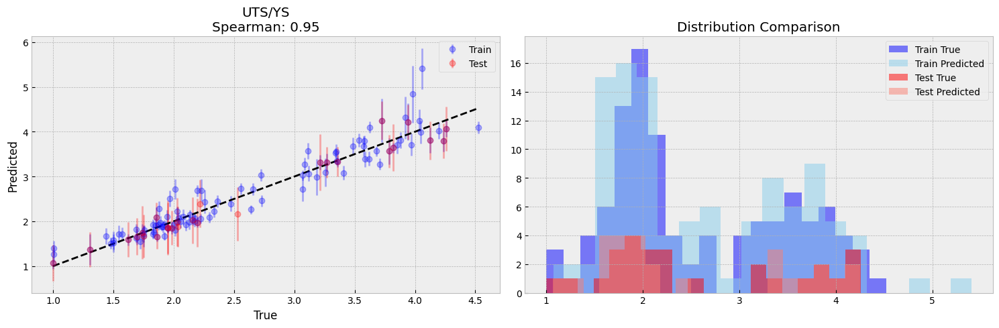

<ipython-input-74-fb09ce7f132e>:2150: RuntimeWarning: divide by zero encountered in divide
  train_rmspe = np.sqrt(np.mean(np.square((train_true_task - train_preds) / train_true_task)))
<ipython-input-74-fb09ce7f132e>:2181: RuntimeWarning: divide by zero encountered in divide
  test_rmspe = np.sqrt(np.mean(np.square((test_true_task - test_preds) / test_true_task)))


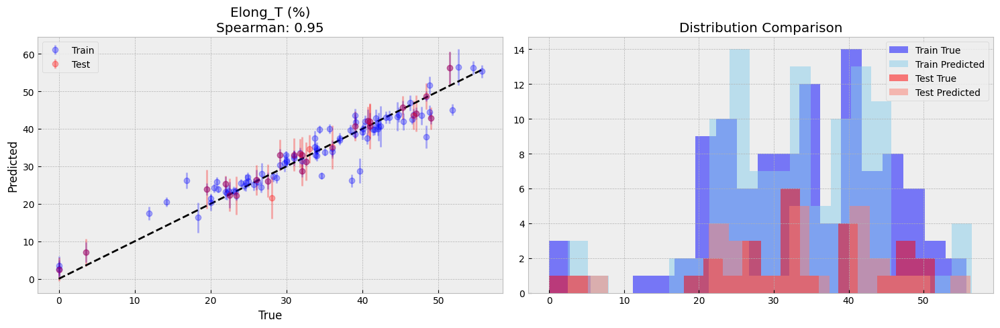

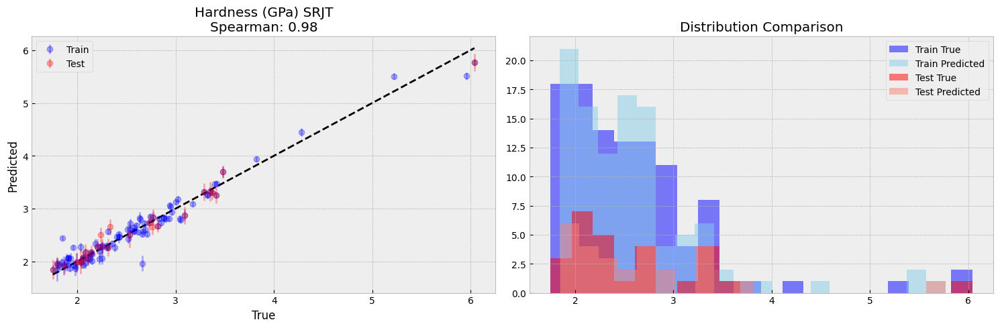

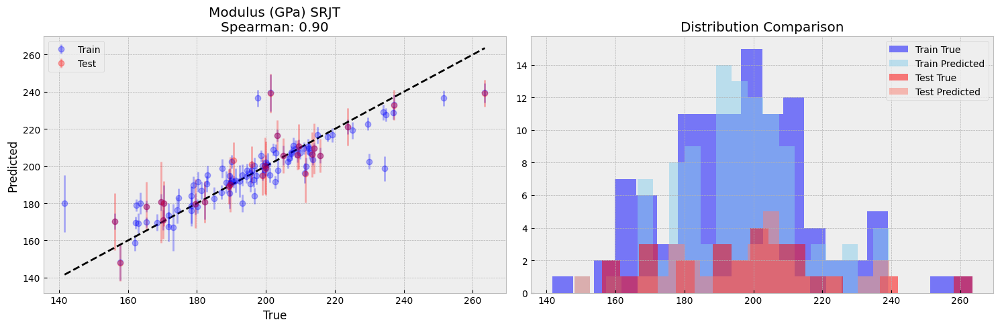

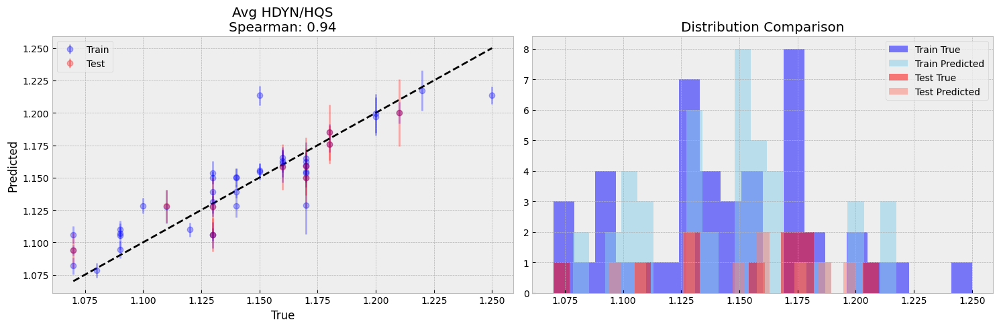

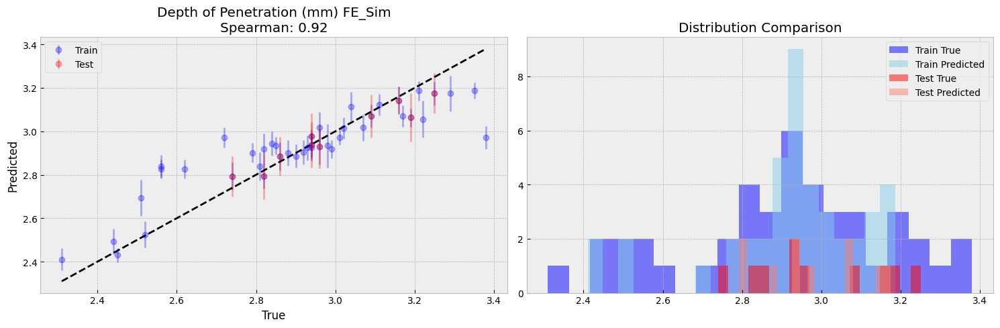


=== Split 3 ===
✓ Prior predictions loaded successfully
11 ___________________________
11 ___________________________
11 ___________________________
11 ___________________________
train_fullx_scaled: (1044, 9)
train_fully: (1044, 1)
train_fully_scaled: (1044, 1)
train_fullprior: (1044,)
test_fullx_scaled: (262, 9)
test_fully: (262, 1)
test_fully_scaled: (262, 1)
test_fullprior: (262,)
output_scaler: 11
10 __________________________final i_______________________________--
Epoch 1/3000 - Train Loss: 5.825 - Val Loss: 5.432
Epoch 51/3000 - Train Loss: 1.423 - Val Loss: 1.914
Epoch 101/3000 - Train Loss: 1.022 - Val Loss: 1.610
Epoch 151/3000 - Train Loss: 0.918 - Val Loss: 1.558
Epoch 201/3000 - Train Loss: 0.822 - Val Loss: 1.517
Epoch 251/3000 - Train Loss: 0.718 - Val Loss: 1.543
Early stopping at epoch 267


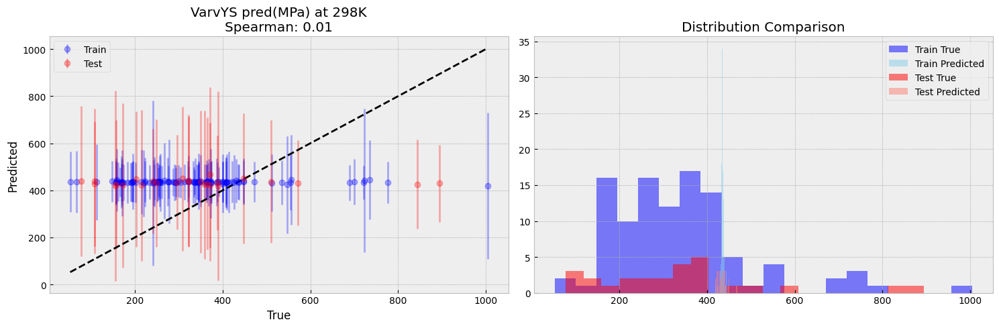

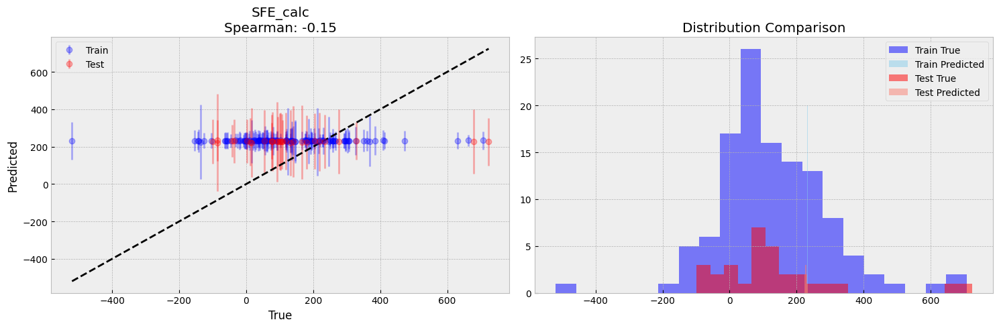

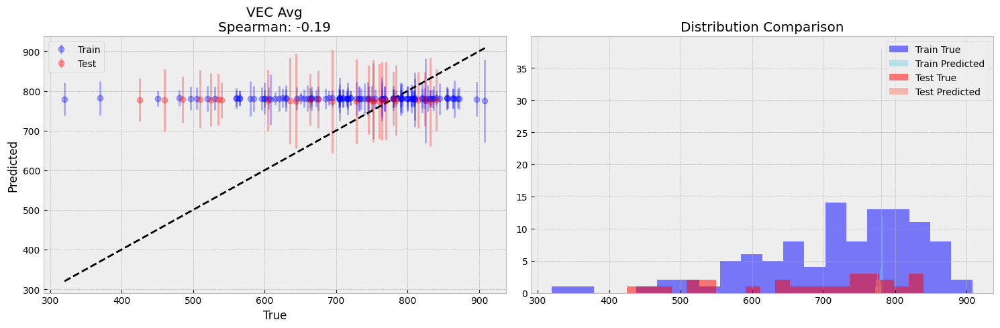

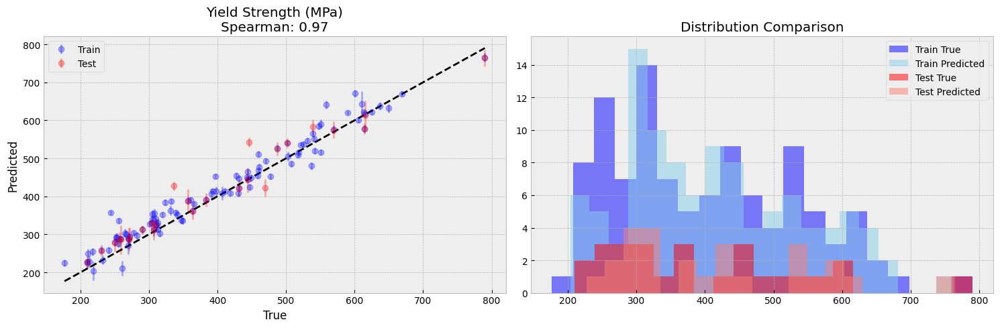

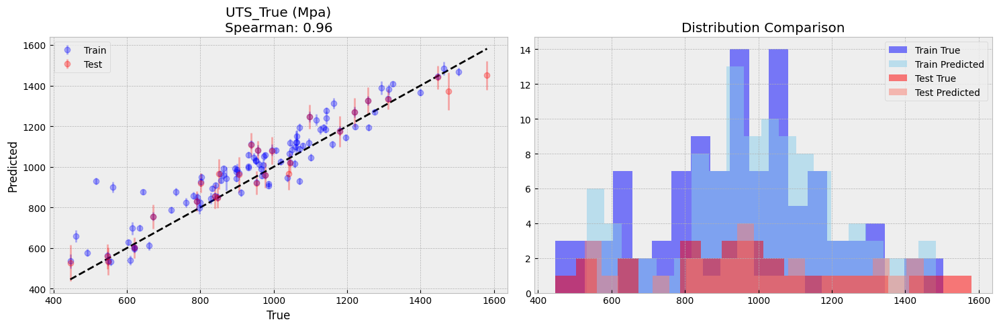

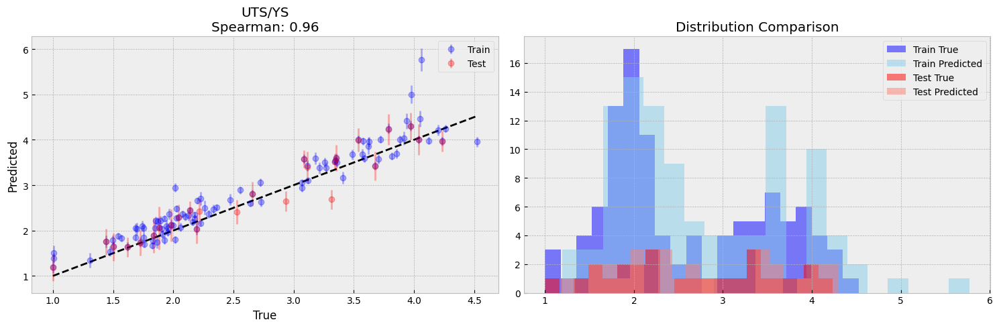

<ipython-input-74-fb09ce7f132e>:2150: RuntimeWarning: divide by zero encountered in divide
  train_rmspe = np.sqrt(np.mean(np.square((train_true_task - train_preds) / train_true_task)))
<ipython-input-74-fb09ce7f132e>:2181: RuntimeWarning: divide by zero encountered in divide
  test_rmspe = np.sqrt(np.mean(np.square((test_true_task - test_preds) / test_true_task)))


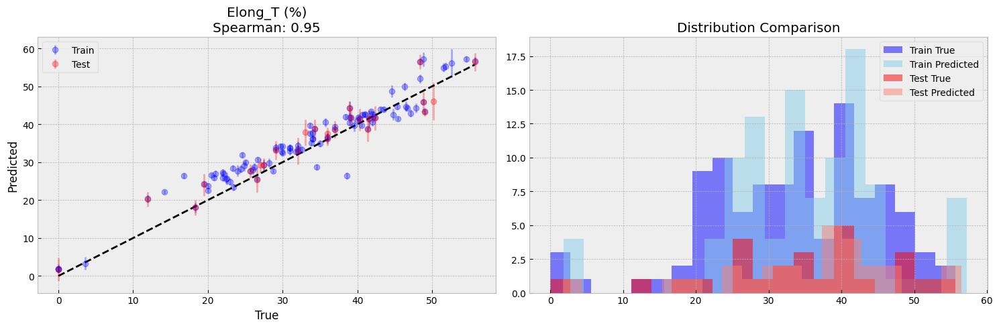

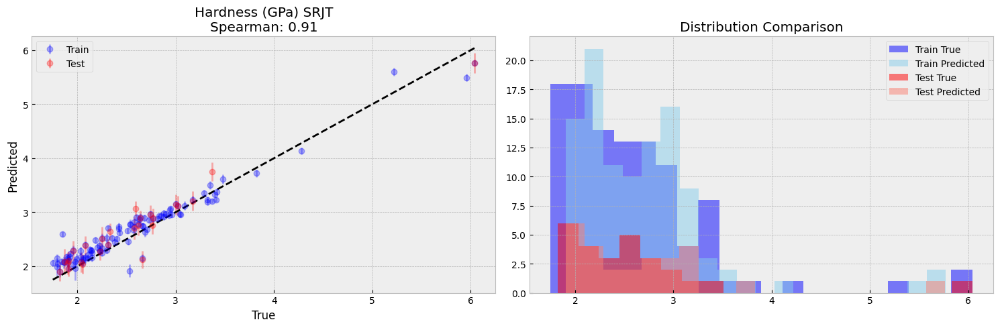

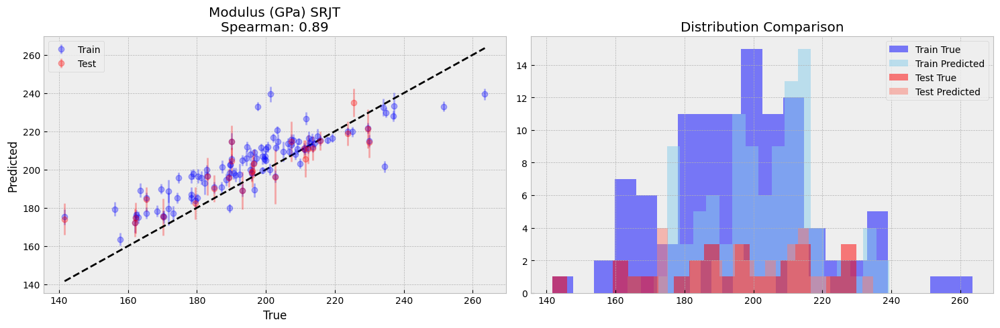

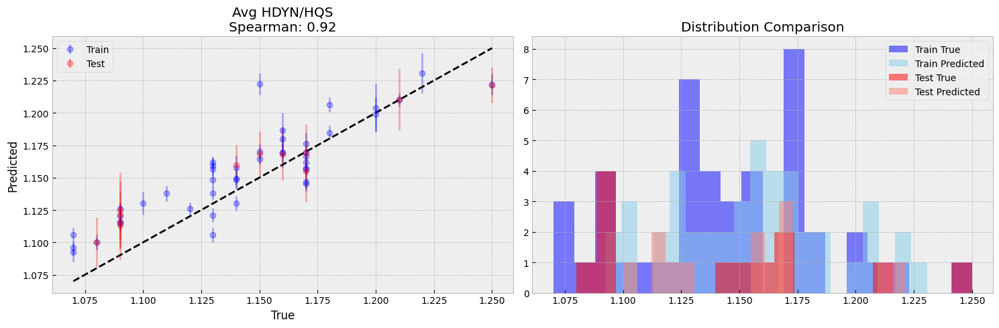

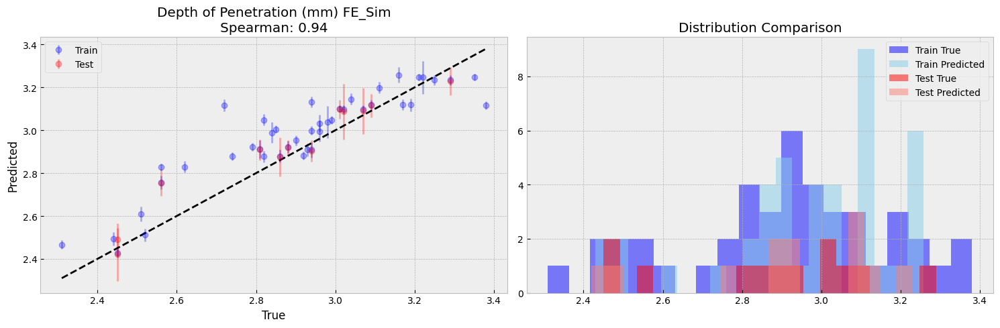


=== Split 4 ===
✓ Prior predictions loaded successfully
11 ___________________________
11 ___________________________
11 ___________________________
11 ___________________________
train_fullx_scaled: (1042, 9)
train_fully: (1042, 1)
train_fully_scaled: (1042, 1)
train_fullprior: (1042,)
test_fullx_scaled: (275, 9)
test_fully: (275, 1)
test_fully_scaled: (275, 1)
test_fullprior: (275,)
output_scaler: 11
10 __________________________final i_______________________________--
Epoch 1/3000 - Train Loss: 6.925 - Val Loss: 5.561
Epoch 51/3000 - Train Loss: 1.455 - Val Loss: 1.841
Epoch 101/3000 - Train Loss: 1.038 - Val Loss: 1.479
Epoch 151/3000 - Train Loss: 0.941 - Val Loss: 1.421
Epoch 201/3000 - Train Loss: 0.853 - Val Loss: 1.367
Epoch 251/3000 - Train Loss: 0.762 - Val Loss: 1.293
Epoch 301/3000 - Train Loss: 0.665 - Val Loss: 1.268
Epoch 351/3000 - Train Loss: 0.551 - Val Loss: 1.253
Epoch 401/3000 - Train Loss: 0.423 - Val Loss: 1.270
Early stopping at epoch 405


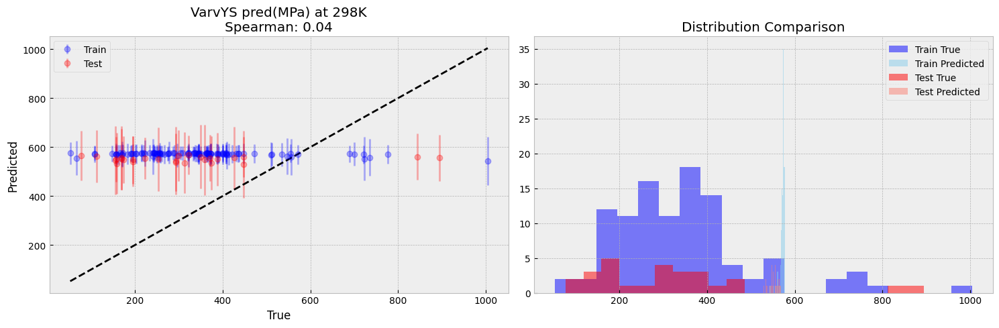

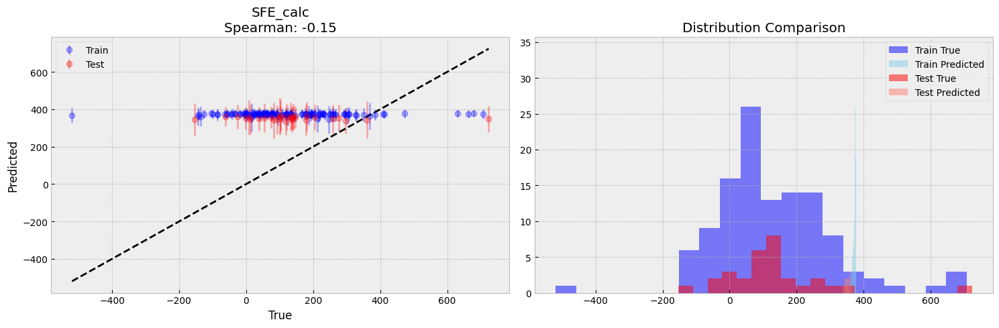

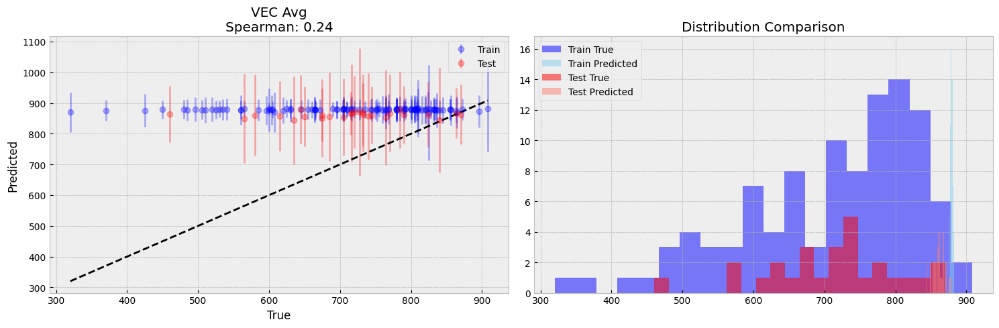

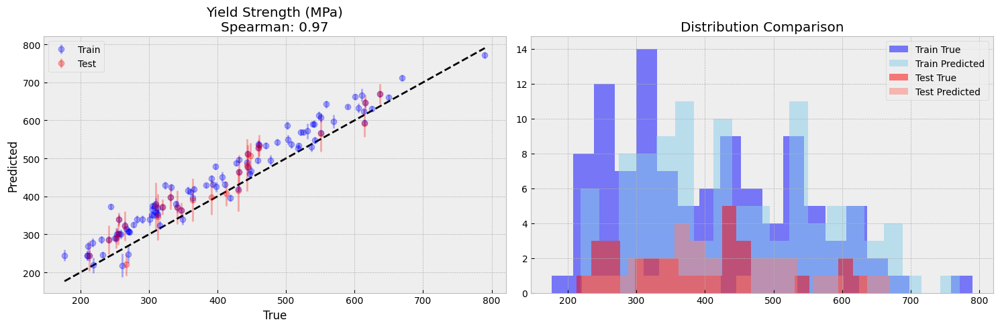

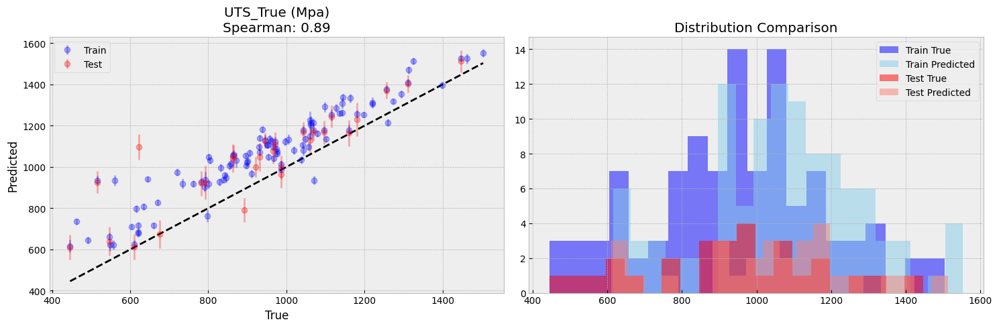

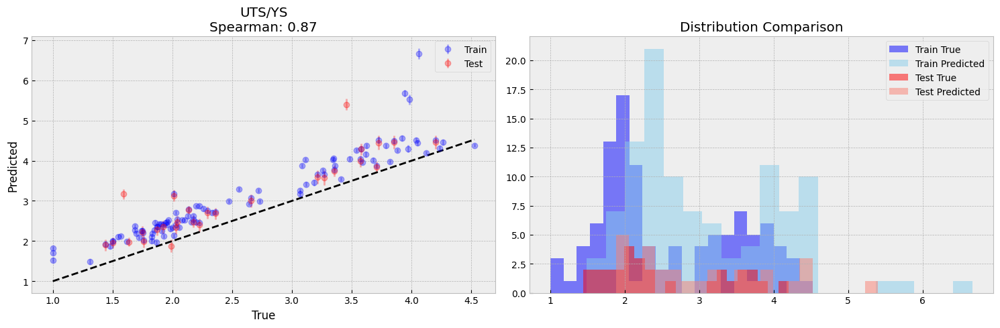

<ipython-input-74-fb09ce7f132e>:2150: RuntimeWarning: divide by zero encountered in divide
  train_rmspe = np.sqrt(np.mean(np.square((train_true_task - train_preds) / train_true_task)))


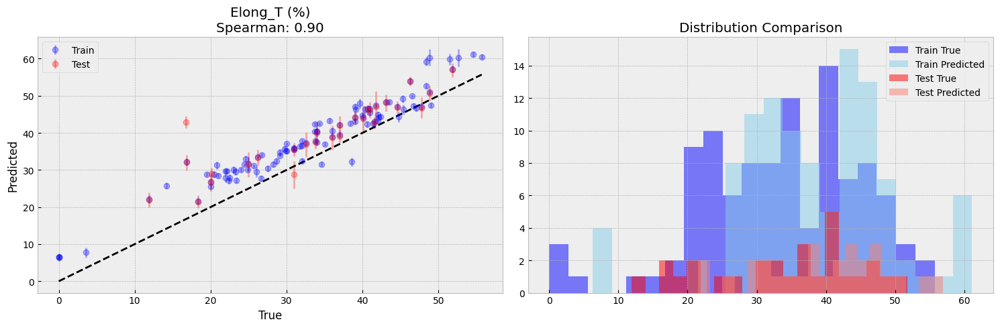

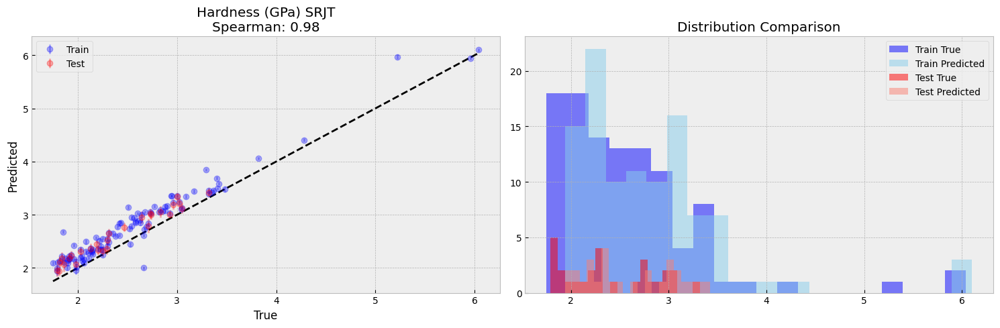

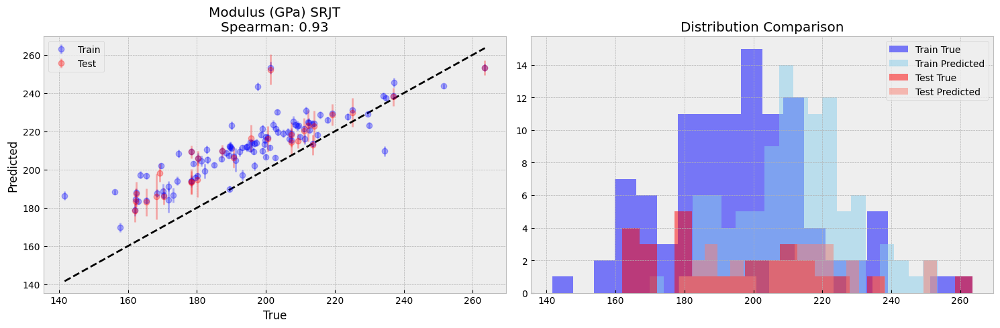

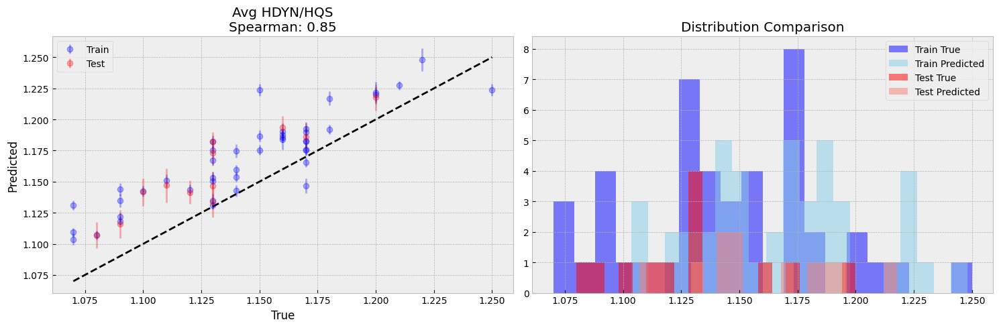

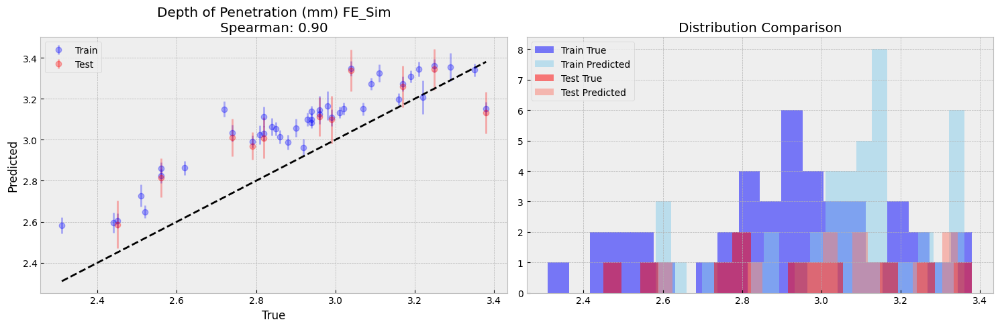

/usr/local/lib/python3.11/dist-packages/numpy/_core/_methods.py:185: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


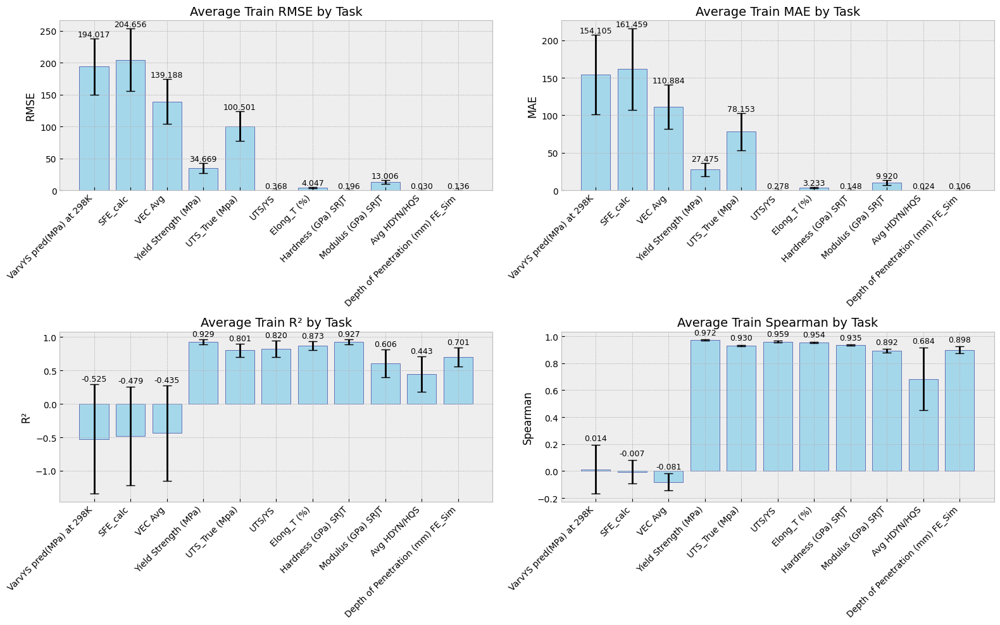

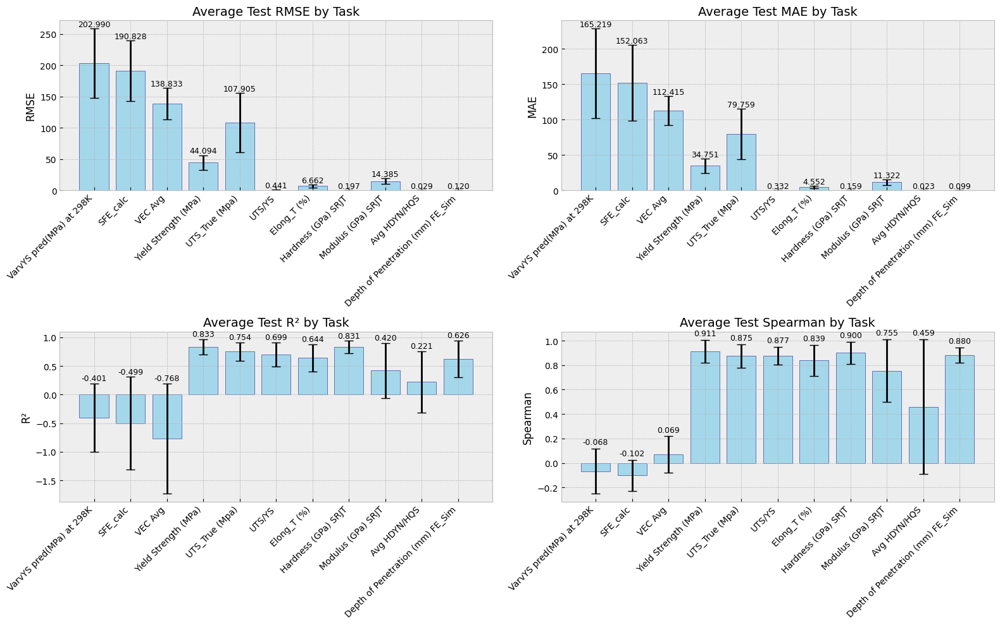


Average Train Metrics Across All Splits:

Task: VarvYS pred(MPa) at 298K (averaged over 5 splits)
----------------------------------------
Train RMSE: 194.0166 ± 43.9828
Train MAE: 154.1048 ± 53.3041
Train R²: -0.5247 ± 0.8195
Train Spearman: 0.0136 ± 0.1817
Train Kendall: 0.0092 ± 0.1284
GMAE: 0.4496 ± 0.1109
SMAPE: 42.40% ± 9.80%
MASE: 0.8952 ± 0.3246
RMSPE: 1.0811 ± 0.3803
Avg. Train Samples: 104.4

Task: SFE_calc (averaged over 5 splits)
----------------------------------------
Train RMSE: 204.6557 ± 49.1256
Train MAE: 161.4587 ± 54.2345
Train R²: -0.4793 ± 0.7400
Train Spearman: -0.0067 ± 0.0865
Train Kendall: -0.0033 ± 0.0580
GMAE: 6.0191 ± 0.4534
SMAPE: 97.32% ± 9.07%
MASE: 0.8816 ± 0.2885
RMSPE: 67.3656 ± 35.8334
Avg. Train Samples: 117.0

Task: VEC Avg (averaged over 5 splits)
----------------------------------------
Train RMSE: 139.1881 ± 35.1868
Train MAE: 110.8841 ± 29.4937
Train R²: -0.4350 ± 0.7123
Train Spearman: -0.0807 ± 0.0643
Train Kendall: -0.0504 ± 0.0478
GMAE: 0.

In [74]:
import pandas as pd
import numpy as np
import torch
import gpytorch
from gpytorch.means import ConstantMean, LinearMean
from gpytorch.kernels import MaternKernel, ScaleKernel
from gpytorch.variational import VariationalStrategy, CholeskyVariationalDistribution
from gpytorch.distributions import MultivariateNormal
from gpytorch.models.deep_gps import DeepGPLayer, DeepGP
from gpytorch.mlls import DeepApproximateMLL, VariationalELBO
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from scipy.stats import kendalltau, spearmanr
from sklearn.metrics import mean_absolute_error, mean_squared_error

class DGPLastLayer3(gpytorch.models.ApproximateGP):
    def __init__(self, input_dims, output_dims, num_inducing=128, linear_mean=True):
        num_latents = 10
        inducing_points = torch.randn(10, num_inducing, input_dims)

        variational_distribution = CholeskyVariationalDistribution(
            num_inducing_points=num_inducing,
            batch_shape=torch.Size([num_latents]))

        variational_strategy = gpytorch.variational.LMCVariationalStrategy(
            gpytorch.variational.VariationalStrategy(
                self, inducing_points, variational_distribution, learn_inducing_locations=True
            ),
            num_tasks=output_dims,
            num_latents=10,
            latent_dim=-1
        )

        super().__init__(variational_strategy)
        self.mean_module = ConstantMean(batch_shape=torch.Size([10])) if linear_mean else LinearMean(input_dims) #gpytorch.means.ConstantMean(batch_shape=torch.Size([10]))
        self.covar_module = gpytorch.kernels.ScaleKernel(
            gpytorch.kernels.RBFKernel(batch_shape=torch.Size([10])),
            batch_shape=torch.Size([10])
        )

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return MultivariateNormal(mean_x, covar_x)

class DGPHiddenLayer(DeepGPLayer):
    def __init__(self, input_dims, output_dims, num_inducing=32, linear_mean=True):
        inducing_points = torch.randn(output_dims, num_inducing, input_dims)
        batch_shape = torch.Size([output_dims])

        variational_distribution = CholeskyVariationalDistribution(
            num_inducing_points=num_inducing,
            batch_shape=batch_shape
        )
        variational_strategy = VariationalStrategy(
            self,
            inducing_points,
            variational_distribution,
            learn_inducing_locations=True
        )

        super().__init__(variational_strategy, input_dims, output_dims)
        self.mean_module = ConstantMean(batch_shape=batch_shape) if linear_mean else LinearMean(input_dims)
        self.covar_module = ScaleKernel(
            MaternKernel(nu=2.5, batch_shape=batch_shape, ard_num_dims=input_dims),
            batch_shape=batch_shape
        )

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return MultivariateNormal(mean_x, covar_x)


import gpytorch
import math
from typing import Any, Dict, List, Optional, Tuple, Union

import torch
from botorch.acquisition.objective import PosteriorTransform
from botorch.exceptions.errors import UnsupportedError
from botorch.models.gpytorch import GPyTorchModel, MultiTaskGPyTorchModel
from botorch.models.model import FantasizeMixin
from botorch.models.transforms.input import InputTransform
from botorch.models.transforms.outcome import OutcomeTransform
from botorch.models.utils.gpytorch_modules import (
    get_matern_kernel_with_gamma_prior,
    MIN_INFERRED_NOISE_LEVEL,
)
from botorch.posteriors.multitask import MultitaskGPPosterior
from botorch.utils.datasets import MultiTaskDataset, SupervisedDataset
from gpytorch.constraints import GreaterThan
from gpytorch.distributions.multitask_multivariate_normal import (
    MultitaskMultivariateNormal,
)
from gpytorch.distributions.multivariate_normal import MultivariateNormal
from gpytorch.kernels.index_kernel import IndexKernel
from gpytorch.kernels.matern_kernel import MaternKernel
from gpytorch.kernels.multitask_kernel import MultitaskKernel
from gpytorch.likelihoods.gaussian_likelihood import (
    FixedNoiseGaussianLikelihood,
    GaussianLikelihood,
)
from gpytorch.likelihoods.likelihood import Likelihood
from gpytorch.likelihoods.multitask_gaussian_likelihood import (
    MultitaskGaussianLikelihood,
)
from gpytorch.means import MultitaskMean
from gpytorch.means.constant_mean import ConstantMean
from gpytorch.models.exact_gp import ExactGP
from gpytorch.module import Module
from gpytorch.priors.lkj_prior import LKJCovariancePrior
from gpytorch.priors.prior import Prior
from gpytorch.priors.smoothed_box_prior import SmoothedBoxPrior
from gpytorch.priors.torch_priors import GammaPrior
from gpytorch.settings import detach_test_caches
from gpytorch.utils.errors import CachingError
from gpytorch.utils.memoize import cached, pop_from_cache
from linear_operator.operators import (
    BatchRepeatLinearOperator,
    CatLinearOperator,
    DiagLinearOperator,
    KroneckerProductDiagLinearOperator,
    KroneckerProductLinearOperator,
    RootLinearOperator,
    to_linear_operator,
)
from torch import Tensor
def get_task_value_remapping(
    task_values: Tensor, dtype: torch.dtype
) -> Optional[Tensor]:
    """Construct an mapping of discrete task values to contiguous int-valued floats.

    Args:
        task_values: A sorted long-valued tensor of task values.
        dtype: The dtype of the model inputs (e.g. `X`), which the new
            task values should have mapped to (e.g. float, double).

    Returns:
        A tensor of shape `task_values.max() + 1` that maps task values
        to new task values. The indexing operation `mapper[task_value]`
        will produce a tensor of new task values, of the same shape as
        the original. The elements of the `mapper` tensor that do not
        appear in the original `task_values` are mapped to `nan`. The
        return value will be `None`, when the task values are contiguous
        integers starting from zero.
    """
    task_range = torch.arange(
        len(task_values), dtype=task_values.dtype, device=task_values.device
    )
    mapper = None
    if not torch.equal(task_values, task_range):
        # Create a tensor that maps task values to new task values.
        # The number of tasks should be small, so this should be quite efficient.
        mapper = torch.full(
            (task_values.max().item() + 1,),
            float("nan"),
            dtype=dtype,
            device=task_values.device,
        )
        mapper[task_values] = task_range.to(dtype=dtype)
    return mapper


class MultiTaskDeepGP(DeepGP, MultiTaskGPyTorchModel):
    def __init__(
        self,
        train_X: Tensor,
        train_Y: Tensor,
        task_feature: int,
        reduction: Optional[int] = 8,
        train_Yvar: Optional[Tensor] = None,
        mean_module: Optional[Module] = None,
        covar_module: Optional[Module] = None,
        likelihood: Optional[Likelihood] = None,
        task_covar_prior: Optional[Prior] = None,
        output_tasks: Optional[List[int]] = None,
        rank: Optional[int] = None,
        all_tasks: Optional[List[int]] = None,
        input_transform: Optional[InputTransform] = None,
        outcome_transform: Optional[OutcomeTransform] = None,
    ) -> None:
        super().__init__()
        self.reduction=reduction
        with torch.no_grad():
            transformed_X = self.transform_inputs(
                X=train_X, input_transform=input_transform
            )
        self._validate_tensor_args(X=transformed_X, Y=train_Y, Yvar=train_Yvar)
        (
            all_tasks_inferred,
            task_feature,
            self.num_non_task_features,
        ) = self.get_all_tasks(transformed_X, task_feature, output_tasks)
        if all_tasks is not None and not set(all_tasks_inferred).issubset(all_tasks):
            raise UnsupportedError(
                f"The provided {all_tasks=} does not contain all the task features "
                f"inferred from the training data {all_tasks_inferred=}. "
                "This is not allowed as it will lead to errors during model training."
            )
        all_tasks = all_tasks or all_tasks_inferred
        self.num_tasks = len(all_tasks)
        if outcome_transform is not None:
            train_Y, train_Yvar = outcome_transform(Y=train_Y, Yvar=train_Yvar)

        # squeeze output dim
        train_Y = train_Y.squeeze(-1)
        if output_tasks is None:
            output_tasks = all_tasks
        else:
            if set(output_tasks) - set(all_tasks):
                raise RuntimeError("All output tasks must be present in input data.")
        self._output_tasks = output_tasks
        self._num_outputs = len(output_tasks)

        if likelihood is None:
            if train_Yvar is None:
                likelihood = GaussianLikelihood(noise_prior=GammaPrior(1.1, 0.05))
            else:
                likelihood = FixedNoiseGaussianLikelihood(noise=train_Yvar.squeeze(-1))

        self._task_feature = task_feature
        self._base_idxr = torch.arange(self.num_non_task_features)
        self._base_idxr[task_feature:] += 1

        # Single hidden layer with moderate dimension
        # Single hidden layer with fixed dimension
        hidden_layer = DGPHiddenLayer(
            input_dims=train_X.shape[-1]-1,  # Exclude task feature
            output_dims=self.num_tasks-self.reduction,  # Moderate expansion of dimension
            linear_mean=True
        )

        last_layer = DGPLastLayer3(
            input_dims=self.num_tasks-self.reduction,
            output_dims=self.num_tasks,
            linear_mean=True
        )

        self.hidden_layer = hidden_layer
        self.last_layer = last_layer



        self.likelihood = gpytorch.likelihoods.GaussianLikelihood(num_tasks=self.num_tasks)#,noise_constraint=gpytorch.constraints.Interval(0.0001, 0.001))

        self._rank = rank if rank is not None else self.num_tasks
        task_mapper = get_task_value_remapping(
            task_values=torch.tensor(
                all_tasks, dtype=torch.long, device=train_X.device
            ),
            dtype=train_X.dtype,
        )
        self.register_buffer("_task_mapper", task_mapper)
        self._expected_task_values = set(all_tasks)
        if input_transform is not None:
            self.input_transform = input_transform
        if outcome_transform is not None:
            self.outcome_transform = outcome_transform
        self.to(train_X)
    def _split_inputs(self, x: Tensor) -> Tuple[Tensor, Tensor]:
        r"""Extracts base features and task indices from input data.

        Args:
            x: The full input tensor with trailing dimension of size `d + 1`.
                Should be of float/double data type.

        Returns:
            2-element tuple containing

            - A `q x d` or `b x q x d` (batch mode) tensor with trailing
            dimension made up of the `d` non-task-index columns of `x`, arranged
            in the order as specified by the indexer generated during model
            instantiation.
            - A `q` or `b x q` (batch mode) tensor of long data type containing
            the task indices.
        """
        batch_shape, d = x.shape[:-2], x.shape[-1]
        x_basic = x[..., self._base_idxr].view(batch_shape + torch.Size([-1, d - 1]))
        task_idcs = (
            x[..., self._task_feature]
            .view(batch_shape + torch.Size([-1, 1]))
            .to(dtype=torch.long)
        )
        task_idcs = self._map_tasks(task_values=task_idcs)
        return x_basic, task_idcs

    def forward(self, x: Tensor) -> MultivariateNormal:
        if self.training:
            x = self.transform_inputs(x)

        x_basic, task_idcs = self._split_inputs(x)
        hidden=self.hidden_layer(x_basic)
#         hidden = self.hidden_layer2(hidden_rep1)

        if len(torch.distributions.Normal(loc=hidden.mean, scale=hidden.variance.sqrt()).rsample().shape) == 3:
            task_id = torch.broadcast_to(
                task_idcs.squeeze(-1),
                (torch.distributions.Normal(loc=hidden.mean, scale=hidden.variance.sqrt()).rsample().shape[-3],
                 task_idcs.squeeze(-1).shape[-1])
            )
        else:
            task_id = torch.broadcast_to(
                task_idcs.squeeze(-1),
                (torch.distributions.Normal(loc=hidden.mean, scale=hidden.variance.sqrt()).rsample().shape[-4],
                 torch.distributions.Normal(loc=hidden.mean, scale=hidden.variance.sqrt()).rsample().shape[-3],
                 task_idcs.squeeze(-1).shape[-1])
            )

        output = self.last_layer(
            torch.distributions.Normal(
                loc=hidden.mean,
                scale=hidden.variance.sqrt()
            ).rsample(),
            task_indices=task_id
        )
        return output

    @classmethod
    def get_all_tasks(
        cls,
        train_X: Tensor,
        task_feature: int,
        output_tasks: Optional[List[int]] = None,
    ) -> Tuple[List[int], int, int]:
        if train_X.ndim != 2:
            # Currently, batch mode MTGPs are blocked upstream in GPyTorch
            raise ValueError(f"Unsupported shape {train_X.shape} for train_X.")

        d = train_X.shape[-1] - 1
        if not (-d <= task_feature <= d):
            raise ValueError(f"Must have that -{d} <= task_feature <= {d}")
        task_feature = task_feature % (d + 1)
        all_tasks = (
            train_X[..., task_feature].unique(sorted=True).to(dtype=torch.long).tolist()
        )
        return all_tasks, task_feature, d

    @classmethod
    def construct_inputs(
        cls,
        training_data: Union[SupervisedDataset, MultiTaskDataset],
        task_feature: int,
        output_tasks: Optional[List[int]] = None,
        task_covar_prior: Optional[Prior] = None,
        prior_config: Optional[dict] = None,
        rank: Optional[int] = None,
    ) -> Dict[str, Any]:
        r"""Construct `Model` keyword arguments from a dataset and other args.

        Args:
            training_data: A `SupervisedDataset` or a `MultiTaskDataset`.
            task_feature: Column index of embedded task indicator features.
            output_tasks: A list of task indices for which to compute model
                outputs for. If omitted, return outputs for all task indices.
            task_covar_prior: A GPyTorch `Prior` object to use as prior on
                the cross-task covariance matrix,
            prior_config: Configuration for inter-task covariance prior.
                Should only be used if `task_covar_prior` is not passed directly. Must
                contain `use_LKJ_prior` indicator and should contain float value `eta`.
            rank: The rank of the cross-task covariance matrix.
        """
        if task_covar_prior is not None and prior_config is not None:
            raise ValueError(
                "Only one of `task_covar_prior` and `prior_config` arguments expected."
            )

        if prior_config is not None:
            if not prior_config.get("use_LKJ_prior"):
                raise ValueError("Currently only config for LKJ prior is supported.")

            num_tasks = training_data.X[task_feature].unique().numel()
            sd_prior = GammaPrior(1.0, 0.15)
            sd_prior._event_shape = torch.Size([num_tasks])
            eta = prior_config.get("eta", 0.5)
            if not isinstance(eta, float) and not isinstance(eta, int):
                raise ValueError(f"eta must be a real number, your eta was {eta}.")
            task_covar_prior = LKJCovariancePrior(num_tasks, eta, sd_prior)

        # Call Model.construct_inputs to parse training data
        base_inputs = super().construct_inputs(training_data=training_data)
        if (
            isinstance(training_data, MultiTaskDataset)
            # If task features are included in the data, all tasks will have
            # some observations and they may have different task features.
            and training_data.task_feature_index is None
        ):
            all_tasks = list(range(len(training_data.datasets)))
            base_inputs["all_tasks"] = all_tasks
        if task_covar_prior is not None:
            base_inputs["task_covar_prior"] = task_covar_prior
        if rank is not None:
            base_inputs["rank"] = rank
        base_inputs["task_feature"] = task_feature
        base_inputs["output_tasks"] = output_tasks
        return base_inputs







import numpy as np
from sklearn.preprocessing import StandardScaler

def prepare_and_standardize_data(df, input_vars, output_vars, yvar_cols=None, verbose=True):
    """Added yvar_cols parameter and Yvar scaling"""

    """
    Prepare and standardize data while properly handling partial task observations.
    Applies column-wise standardization for both inputs and outputs.

    Args:
        df: pandas DataFrame containing the data
        input_vars: list of input variable names
        output_vars: list of output variable names
        verbose: whether to print information about observations

    Returns:
        tuple containing:
        - scaled input array
        - scaled output array
        - dictionary of input scalers (one per column)
        - dictionary of output scalers (one per column)
    """
    # Initialize scaled input array and input scalers dictionary
    input_scaled = np.full_like(df[input_vars].values, np.nan, dtype=np.float64)
    input_scalers = {}

    # Standardize inputs separately for each column
    for j, col in enumerate(input_vars):
        # Get non-NaN mask for this input
        mask = ~np.isnan(df[input_vars].values[:, j])

        if mask.any():
            scaler = StandardScaler()
            input_scaled[mask, j] = scaler.fit_transform(
                df[input_vars].values[mask, j].reshape(-1, 1)
            ).ravel()
            input_scalers[col] = scaler

            if verbose:
                print(f"Input {col}: {np.sum(mask)}/{len(mask)} valid observations")

    # Initialize scaled output array and output scalers dictionary
    output_scaled = np.full_like(df[output_vars].values, np.nan, dtype=np.float64)
    output_scalers = {}

    # Standardize outputs separately for each task
    for j, col in enumerate(output_vars):
        # Get non-NaN mask for this task
        mask = ~np.isnan(df[output_vars].values[:, j])

        if mask.any():
            scaler = StandardScaler()
            output_scaled[mask, j] = scaler.fit_transform(
                df[output_vars].values[mask, j].reshape(-1, 1)
            ).ravel()
            output_scalers[col] = scaler

            if verbose:
                print(f"Output {col}: {np.sum(mask)}/{len(mask)} valid observations")
    # Original input/output scaling code remains the same

    # Add Yvar handling
    yvar_scaled = None
    if yvar_cols is not None:
        yvar_scaled = np.full_like(df[output_vars].values, 1e-6, dtype=np.float64)  # Default to small noise

        for j, (output_col, yvar_col) in enumerate(zip(output_vars, yvar_cols)):
            if yvar_col is not None and yvar_col in df.columns:
                # Get non-NaN mask for this task's Yvar
                mask = ~np.isnan(df[yvar_col].values)

                if mask.any():
                    # Scale Yvar using the output scaler's variance
                    output_scaler = output_scalers[output_col]
                    yvar_scaled[mask, j] = df[yvar_col].values[mask] / output_scaler.var_

                    if verbose:
                        print(f"Yvar for {output_col}: {np.sum(mask)}/{len(mask)} valid observations")

    return input_scaled, output_scaled, yvar_scaled, input_scalers, output_scalers




def train_model(train_x, train_y, num_tasks, train_yvar=None, num_epochs=500, reduction=8):
    """Train the Deep GP model."""
    """Added train_yvar parameter"""
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    train_x = torch.tensor(train_x, dtype=torch.float64).to(device)
    train_y = torch.tensor(train_y, dtype=torch.float64).to(device)
    if train_yvar is not None:
        train_yvar = torch.tensor(train_yvar, dtype=torch.float64).to(device)

    model = MultiTaskDeepGP(
        train_X=train_x,
        train_Y=train_y.unsqueeze(-1),
        task_feature=-1,
        train_Yvar=train_yvar.unsqueeze(-1) if train_yvar is not None else None,
        reduction=reduction
    ).to(device)





    model = model.double()

    optimizer = torch.optim.Adam([
        {'params': model.parameters()},
    ], lr=0.01)

    mll = DeepApproximateMLL(
        VariationalELBO(
            model.likelihood,
            model,
            num_data=train_x.shape[0],
            beta=0.5
        )
    )

    model.train()
    model.likelihood.train()

    losses = []
    best_loss = float('inf')
    patience = 50
    patience_counter = 0

    for i in range(num_epochs):
        optimizer.zero_grad()
        output = model(train_x)
        loss = -mll(output, train_y)
        losses.append(loss.item())

        if loss.item() < best_loss:
            best_loss = loss.item()
            patience_counter = 0
        else:
            patience_counter += 1

        if patience_counter >= patience:
            print(f"Early stopping at epoch {i+1}")
            break

        loss.backward()
        optimizer.step()

        if i % 50 == 0:
            print(f'Epoch {i+1}/{num_epochs} - Loss: {loss.item():.3f}')

    plt.figure(figsize=(10, 5))
    plt.plot(losses)
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.show()

    return model



def evaluate_model(model, train_x, train_y, task_names, output_scalers,df_p=None):
    """Evaluate model performance with uncertainty visualization."""
    model.eval()
    device = next(model.parameters()).device

    with torch.no_grad():
        posterior = model.posterior(torch.tensor(train_x).to(device))
        mean = posterior.mean.squeeze().cpu().numpy().T
        # Extract standard deviation from the posterior
        std = posterior.variance.sqrt().squeeze().cpu().numpy().T
        print("Mean shape:", mean.shape)
        print("Std shape:", std.shape)

    predictions = mean
    uncertainties = std

    metrics = []
    for task_idx, task_name in enumerate(task_names):
        task_mask = (train_x[:, -1] == task_idx)

        if np.sum(task_mask) > 0:
            task_preds = predictions[task_mask]
            task_std = uncertainties[task_mask]
            task_true = train_y[task_mask]

            mae = mean_absolute_error(task_true, task_preds)
            rmse = np.sqrt(mean_squared_error(task_true, task_preds))
            kendall = kendalltau(task_true, task_preds)[0]
            spearman = spearmanr(task_true, task_preds)[0]

            metrics.append({
                'task': task_name,
                'mae': mae,
                'rmse': rmse,
                'kendall': kendall,
                'spearman': spearman,
                'n_samples': np.sum(task_mask)
            })

            plt.figure(figsize=(12, 5))

            plt.subplot(121)
            # Plot prediction with error bars
            plt.errorbar(task_true, task_preds, yerr=2*task_std, fmt='o', alpha=0.5,
                        capsize=3, markersize=4, elinewidth=1, label='Predictions with 2σ')

            # Plot diagonal line
            plt.plot([min(task_true), max(task_true)],
                    [min(task_true), max(task_true)],
                    'r--', lw=2, label='Perfect prediction')
            plt.xlabel('True Values')
            plt.ylabel('Predicted Values')
            plt.title(f'{task_name}\nRMSE: {rmse:.3f}, Spearman: {spearman:.3f}')
            plt.legend()

            plt.subplot(122)
            plt.hist(task_true, bins=20, alpha=0.5, label='True')
            plt.hist(task_preds, bins=20, alpha=0.5, label='Predicted')
            # Add uncertainty band to histogram
#             plt.fill_between(np.linspace(min(task_preds), max(task_preds), 100),
#                            np.histogram(task_preds - 2*task_std, bins=100)[0],
#                            np.histogram(task_preds + 2*task_std, bins=100)[0],
#                            alpha=0.2, color='blue', label='2σ uncertainty')
            plt.xlabel('Values')
            plt.ylabel('Frequency')
            plt.legend()

            plt.tight_layout()
            plt.show()

    return metrics



# if __name__ == "__main__":
#     # Define variables
#     input_vars = ['Al', 'Co', 'Cr', 'Cu', 'Fe', 'Mn', 'Ni', 'V']
#     output_vars = [
#         'VarvYS_pred(MPa) at 298K','SFE_calc', 'VEC Avg',
#         'Yield Strength(Mpa)', 'UTS_True(Mpa)', 'UTS/YS',
#         'Elong_T(%)', 'Hardness (GPa)', 'Modulus(Gpa)',
#         'Grain Size(um)','Avg HDYN/HQS'
#     ]

#     # Load data
#     df = pd.read_csv('HTMDEC_MasterTable_Iterations2.csv', encoding='latin1')

#     # Prepare data
#     print("Preparing and standardizing data...")
#     input_scaled, output_scaled, input_scaler, output_scalers = prepare_and_standardize_data(
#         df, input_vars, output_vars
#     )

#     train_x, train_y = prepare_training_pairs(input_scaled, output_scaled)
#     print(f"Total training pairs: {len(train_x)}")

#     # Train model
#     print("\nTraining model...")
#     model = train_model(
#         train_x,
#         train_y,
#         num_tasks=len(output_vars),
#         num_epochs=5000,
#         reduction=7# Increased epochs
#     )

#     # Evaluate model
#     print("\nEvaluating model...")
#     metrics = evaluate_model(model, train_x, train_y, output_vars, output_scalers)

#     # Print metrics
#     for metric in metrics:
#         print(f"\nTask: {metric['task']}")
#         print(f"MAE: {metric['mae']:.4f}")
#         print(f"RMSE: {metric['rmse']:.4f}")
#         print(f"Kendall's Tau: {metric['kendall']:.4f}")
#         print(f"Spearman's R: {metric['spearman']:.4f}")
#         print(f"Number of samples: {metric['n_samples']}")






















from sklearn.model_selection import KFold
import numpy as np
import matplotlib.pyplot as plt
from sklearn.experimental import enable_iterative_imputer  # This needs to be imported first
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor







from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from scipy.stats import kendalltau, spearmanr
import numpy as np
import matplotlib.pyplot as plt









def plot_split_comparison(model_results):
    """
    Plot comparison of models with different reduction parameters for train-test split results.
    """
    reductions = list(model_results.keys())
    metrics = ['test_rmse', 'test_spearman']  # Updated metric names

    fig, axes = plt.subplots(2, 1, figsize=(12, 10))

    for idx, metric in enumerate(metrics):
        mean_scores = []
        std_scores = []

        for reduction in reductions:
            # Calculate mean and std across tasks
            task_scores = [task_metric[metric] for task_metric in model_results[reduction]]
            mean_scores.append(np.mean(task_scores))
            std_scores.append(np.std(task_scores))

        axes[idx].errorbar(reductions, mean_scores, yerr=std_scores, fmt='o-', capsize=5)
        axes[idx].set_xlabel('Reduction Parameter')
        axes[idx].set_ylabel(f'Mean {metric.upper()}')
        axes[idx].set_title(f'Test Set {metric.upper()} vs Reduction Parameter')
        axes[idx].grid(True)

    plt.tight_layout()
    plt.show()

def print_model_comparison(model_results):
    """
    Print detailed comparison of models with different reduction parameters.
    """
    print("\nDetailed Model Comparison:")
    print("=" * 50)

    for reduction, metrics in model_results.items():
        print(f"\nReduction Parameter: {reduction}")
        print("-" * 30)

        # Calculate average metrics across tasks
        avg_test_rmse = np.mean([m['test_rmse'] for m in metrics])
        avg_test_spearman = np.mean([m['test_spearman'] for m in metrics])

        print(f"Average Test RMSE: {avg_test_rmse:.4f}")
        print(f"Average Test Spearman: {avg_test_spearman:.4f}")

        # Print per-task metrics
        print("\nPer-task metrics:")
        for metric in metrics:
            print(f"\n{metric['task']}:")
            print(f"  Test RMSE: {metric['test_rmse']:.4f}")
            print(f"  Test Spearman: {metric['test_spearman']:.4f}")
            print(f"  Train samples: {metric['n_train_samples']}")
            print(f"  Test samples: {metric['n_test_samples']}")




def train_model_with_validation(train_x, train_y, val_x, val_y, num_tasks, train_yvar=None, test_yvar=None, num_epochs=3000, reduction=8):
    """Train the Deep GP model with validation monitoring and Yvar support."""
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Convert to tensors
    train_x = torch.tensor(train_x, dtype=torch.float64).to(device)
    train_y = torch.tensor(train_y, dtype=torch.float64).to(device)
    val_x = torch.tensor(val_x, dtype=torch.float64).to(device)
    val_y = torch.tensor(val_y, dtype=torch.float64).to(device)

    # Convert Yvar to tensors if provided
    if train_yvar is not None:
        train_yvar = torch.tensor(train_yvar, dtype=torch.float64).to(device)
    if test_yvar is not None:
        test_yvar = torch.tensor(test_yvar, dtype=torch.float64).to(device)

    model = MultiTaskDeepGP(
        train_X=train_x,
        train_Y=train_y.unsqueeze(-1),
        task_feature=-1,
        train_Yvar=train_yvar.unsqueeze(-1) if train_yvar is not None else None,
        reduction=reduction
    ).to(device)

    model = model.double()

    optimizer = torch.optim.Adam([
        {'params': model.parameters()},
    ], lr=0.01)

    mll = DeepApproximateMLL(
        VariationalELBO(
            model.likelihood,
            model,
            num_data=train_x.shape[0],
            beta=0.5
        )
    )

    train_losses = []
    val_losses = []
    best_loss = float('inf')
    patience = 50
    patience_counter = 0

    for i in range(num_epochs):
        # Training step
        model.train()
        optimizer.zero_grad()
        output = model(train_x)
        loss = -mll(output, train_y)
        train_losses.append(loss.item())

        loss.backward()
        optimizer.step()

        # Validation step
        model.eval()
        with torch.no_grad():
            val_output = model(val_x)
            val_loss = -mll(val_output, val_y)
            val_losses.append(val_loss.item())

        if val_loss.item() < best_loss:
            best_loss = val_loss.item()
            patience_counter = 0
        else:
            patience_counter += 1

        if patience_counter >= patience:
            print(f"Early stopping at epoch {i+1}")
            break

        if i % 50 == 0:
            print(f'Epoch {i+1}/{num_epochs} - Train Loss: {loss.item():.3f} - Val Loss: {val_loss.item():.3f}')

    return model
def evaluate_model_train_test(model, train_x, train_y, test_x, test_y, task_names, output_scalers,
                            df_prior=None, train_orig_idx=None, test_orig_idx=None, **kwargs):
    """Evaluate model performance with prior values added back."""
    # Get optional parameters with defaults
    split_idx = kwargs.get('split_idx', None)
    save_plots = kwargs.get('save_plots', False)

    # Set plot style to bmh
    plt.style.use('bmh')

    model.eval()
    device = next(model.parameters()).device

    # Get predictions
    with torch.no_grad():
        train_posterior = model.posterior(torch.tensor(train_x).to(device))
        train_mean = train_posterior.mean.squeeze().cpu().numpy()
        train_std = train_posterior.variance.sqrt().squeeze().cpu().numpy()

        test_posterior = model.posterior(torch.tensor(test_x).to(device))
        test_mean = test_posterior.mean.squeeze().cpu().numpy()
        test_std = test_posterior.variance.sqrt().squeeze().cpu().numpy()

    metrics = []
    for task_idx, task_name in enumerate(task_names):
        # Get masks for current task
        train_task_mask = (train_x[:, -1] == task_idx)
        test_task_mask = (test_x[:, -1] == task_idx)

        if np.sum(train_task_mask) > 0 and np.sum(test_task_mask) > 0:
            # Get predictions and true values for this task
            train_preds_scaled = train_mean[train_task_mask]
            train_uncertainties_scaled = train_std[train_task_mask]
            train_true_scaled = train_y[train_task_mask]

            test_preds_scaled = test_mean[test_task_mask]
            test_uncertainties_scaled = test_std[test_task_mask]
            test_true_scaled = test_y[test_task_mask]

            # Descale values
            scaler = output_scalers[task_name]
            train_preds = scaler.inverse_transform(train_preds_scaled.reshape(-1, 1)).ravel()
            train_true = scaler.inverse_transform(train_true_scaled.reshape(-1, 1)).ravel()
            train_uncertainties = train_uncertainties_scaled * np.sqrt(scaler.var_)[0]

            test_preds = scaler.inverse_transform(test_preds_scaled.reshape(-1, 1)).ravel()
            test_true = scaler.inverse_transform(test_true_scaled.reshape(-1, 1)).ravel()
            test_uncertainties = test_uncertainties_scaled * np.sqrt(scaler.var_)[0]

            # Add prior back if available
            if df_prior is not None and task_name in df_prior.columns:
                # Get indices for current task
                train_task_indices = np.where(train_task_mask)[0]
                test_task_indices = np.where(test_task_mask)[0]

                # Get corresponding original indices
                train_data_indices = train_orig_idx[train_task_indices]
                test_data_indices = test_orig_idx[test_task_indices]

                # Add prior values
                train_prior = df_prior[task_name].iloc[train_data_indices].values
                test_prior = df_prior[task_name].iloc[test_data_indices].values

                print(f"\nTask: {task_name}")
                print(f"Train prior range: {train_prior.min():.2f} to {train_prior.max():.2f}")
                print(f"Test prior range: {test_prior.min():.2f} to {test_prior.max():.2f}")

                train_preds += train_prior
                train_true += train_prior
                test_preds += test_prior
                test_true += test_prior

            # Calculate metrics
            test_mae = mean_absolute_error(test_true, test_preds)
            test_rmse = np.sqrt(mean_squared_error(test_true, test_preds))
            test_r2 = r2_score(test_true, test_preds)
            test_kendall = kendalltau(test_true, test_preds)[0]
            test_spearman = spearmanr(test_true, test_preds)[0]

            # Additional metrics
            test_log_safe = np.where(test_true <= 0, 1e-10, test_true)
            preds_log_safe = np.where(test_preds <= 0, 1e-10, test_preds)
            gmae = np.mean(np.abs(np.log(test_log_safe) - np.log(preds_log_safe)))

            smape = np.mean(2 * np.abs(test_preds - test_true) /
                          (np.abs(test_preds) + np.abs(test_true))) * 100

            scaling_factor = np.mean(np.abs(np.diff(test_true)))
            mase = np.nan if scaling_factor == 0 else mean_absolute_error(test_true, test_preds) / scaling_factor

            rmspe = np.sqrt(np.mean(np.square((test_true - test_preds) / test_true)))

            metrics.append({
                'task': task_name,
                'test_mae': test_mae,
                'test_rmse': test_rmse,
                'test_r2': test_r2,
                'test_kendall': test_kendall,
                'test_spearman': test_spearman,
                'gmae': gmae,
                'smape': smape,
                'mase': mase,
                'rmspe': rmspe,
                'n_train_samples': np.sum(train_task_mask),
                'n_test_samples': np.sum(test_task_mask)
            })

            # Create plots
            plt.figure(figsize=(15, 5))

            # Parity plot
            plt.subplot(121)
            plt.errorbar(train_true, train_preds, yerr=2*train_uncertainties,
                        fmt='o', alpha=0.3, capsize=3, markersize=4,
                        elinewidth=1, label='Training', color='blue')
            plt.errorbar(test_true, test_preds, yerr=2*test_uncertainties,
                        fmt='o', alpha=0.3, capsize=3, markersize=4,
                        elinewidth=1, label='Test', color='red')

            all_true = np.concatenate([train_true, test_true])
            plt.plot([min(all_true), max(all_true)],
                    [min(all_true), max(all_true)],
                    'k--', lw=2, label='Perfect prediction')

            plt.xlabel(f'True {task_name}')
            plt.ylabel(f'Predicted {task_name}')

            metrics_text = (f'R² = {test_r2:.3f}\n'
                          f'RMSE = {test_rmse:.3f}\n'
                          f'GMAE = {gmae:.3f}\n'
                          f'SMAPE = {smape:.1f}%\n'
                          f'MASE = {mase:.3f}\n'
                          f'RMSPE = {rmspe:.3f}')

            plt.text(0.98, 0.02, metrics_text,
                    transform=plt.gca().transAxes,
                    fontsize=10,
                    bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray'),
                    verticalalignment='bottom',
                    horizontalalignment='right')

            plt.title(f'{task_name}\nTest Spearman: {test_spearman:.3f}')
            plt.legend()

            # Distribution plot
            plt.subplot(122)
            plt.hist(train_true, bins=20, alpha=0.5, label='Train True', color='blue')
            plt.hist(train_preds, bins=20, alpha=0.5, label='Train Predicted', color='lightblue')
            plt.hist(test_true, bins=20, alpha=0.5, label='Test True', color='red')
            plt.hist(test_preds, bins=20, alpha=0.5, label='Test Predicted', color='lightcoral')
            plt.xlabel(f'{task_name}')
            plt.ylabel('Frequency')
            plt.legend()

            plt.tight_layout()

            # Save plot if requested
            if save_plots and split_idx is not None:
                # Create a clean task name for filename
                clean_task_name = ''.join(c if c.isalnum() else '_' for c in task_name)
                plt.savefig(f'task_{task_idx}_{clean_task_name}_split_{split_idx}_alltask.png', dpi=300, bbox_inches='tight')
                print(f"Saved plot for task {task_idx}: {task_name}")

            plt.show()

    return metrics

def compare_models_with_split(input_scaled, output_scaled, yvar_scaled=None, df_prior=None, reductions=[1, 3, 5, 7, 8, 9]):
    """Compare models with different reduction parameters using train-test split."""
    model_results = {}

    for reduction in reductions:
        print(f"\nEvaluating model with reduction={reduction}")

        # Prepare training pairs with indices
        train_x, train_y, train_yvar, original_indices, task_indices = prepare_training_pairs_with_indices(
            input_scaled, output_scaled, yvar_scaled)

        # Create train-test split
        n_samples = len(train_x)
        shuffled_indices = np.random.RandomState(42).permutation(n_samples)
        train_size = int(0.8 * n_samples)

        train_idx = shuffled_indices[:train_size]
        test_idx = shuffled_indices[train_size:]

        # Split the data
        train_x_split = train_x[train_idx]
        train_y_split = train_y[train_idx]
        test_x_split = train_x[test_idx]
        test_y_split = train_y[test_idx]

        # Split Yvar if available
        train_yvar_split = train_yvar[train_idx] if train_yvar is not None else None
        test_yvar_split = train_yvar[test_idx] if train_yvar is not None else None

        # Track original indices
        train_original_indices = original_indices[train_idx]
        test_original_indices = original_indices[test_idx]

        # Train model
        model = train_model_with_validation(
            train_x_split,
            train_y_split,
            test_x_split,
            test_y_split,
            num_tasks=output_scaled.shape[1],
            train_yvar=train_yvar_split,
            test_yvar=test_yvar_split,
            num_epochs=3000,
            reduction=reduction
        )

        # Rest remains the same...
        # Evaluate model
        metrics = evaluate_model_train_test(
            model,
            train_x_split,
            train_y_split,
            test_x_split,
            test_y_split,
            output_vars,
            output_scalers,
            df_prior=df_prior,
            train_orig_idx=train_original_indices,
            test_orig_idx=test_original_indices
        )

        model_results[reduction] = metrics

    return model_results
def prepare_training_pairs_with_indices(input_scaled, output_scaled, yvar_scaled=None):
    """Create training pairs while keeping track of original indices."""
    n_samples, n_tasks = output_scaled.shape
    n_features = input_scaled.shape[1]

    # Count total valid pairs
    total_pairs = np.sum(~np.isnan(output_scaled))

    train_x = np.zeros((total_pairs, n_features + 1))
    train_y = np.zeros(total_pairs)
    train_yvar = np.zeros(total_pairs) if yvar_scaled is not None else None
    original_indices = np.zeros(total_pairs, dtype=int)
    task_indices = np.zeros(total_pairs, dtype=int)

    idx = 0
    for i in range(n_samples):
        for task in range(n_tasks):
            if not np.isnan(output_scaled[i, task]):
                train_x[idx, :-1] = input_scaled[i]
                train_x[idx, -1] = task
                train_y[idx] = output_scaled[i, task]
                if yvar_scaled is not None:
                    train_yvar[idx] = yvar_scaled[i, task]
                original_indices[idx] = i
                task_indices[idx] = task
                idx += 1

    return train_x, train_y, train_yvar, original_indices, task_indices


def compare_models_with_multiple_splits(input_scaled, output_scaled, yvar_scaled=None, df_prior=None, reduction=8, n_splits=5, random_seed=42):
    """
    Compare model performance across multiple random train-test splits with a single reduction parameter.

    Args:
        input_scaled: Scaled input features
        output_scaled: Scaled output targets
        yvar_scaled: Scaled variance values (optional)
        df_prior: DataFrame with prior values to add back (optional)
        reduction: Single reduction parameter to use
        n_splits: Number of different train-test splits to evaluate
        random_seed: Base random seed

    Returns:
        Dictionary with average metrics across all splits
    """
    # Lists to store metrics from all splits
    all_metrics = []

    print(f"\nEvaluating model with reduction={reduction} across {n_splits} train-test splits")

    # Prepare training pairs with indices
    train_x, train_y, train_yvar, original_indices, task_indices = prepare_training_pairs_with_indices(
        input_scaled, output_scaled, yvar_scaled)

    # Run multiple splits with different random seeds
    for split_idx in range(n_splits):
        print(f"\nTrain-test split {split_idx + 1}/{n_splits}")

        # Set different random seed for each split
        current_seed = random_seed + split_idx

        # Create train-test split
        n_samples = len(train_x)
        shuffled_indices = np.random.RandomState(current_seed).permutation(n_samples)
        train_size = int(0.8 * n_samples)

        train_idx = shuffled_indices[:train_size]
        test_idx = shuffled_indices[train_size:]

        # Split the data
        train_x_split = train_x[train_idx]
        train_y_split = train_y[train_idx]
        test_x_split = train_x[test_idx]
        test_y_split = train_y[test_idx]

        # Split Yvar if available
        train_yvar_split = train_yvar[train_idx] if train_yvar is not None else None
        test_yvar_split = train_yvar[test_idx] if train_yvar is not None else None

        # Track original indices
        train_original_indices = original_indices[train_idx]
        test_original_indices = original_indices[test_idx]

        # Train model
        model = train_model_with_validation(
            train_x_split,
            train_y_split,
            test_x_split,
            test_y_split,
            num_tasks=output_scaled.shape[1],
            train_yvar=train_yvar_split,
            test_yvar=test_yvar_split,
            num_epochs=3000,
            reduction=reduction
        )

        # Determine if we should save plots for this split (only save for the first split)
        save_plots = (split_idx == 0)

        # Evaluate model
        split_metrics = evaluate_model_train_test(
            model,
            train_x_split,
            train_y_split,
            test_x_split,
            test_y_split,
            output_vars,
            output_scalers,
            df_prior=df_prior,
            train_orig_idx=train_original_indices,
            test_orig_idx=test_original_indices,
            split_idx=split_idx,  # Pass split index to the function
            save_plots=save_plots  # Save plots only for the first split
        )

        # Add split index to metrics
        for metric in split_metrics:
            metric['split_idx'] = split_idx

        # Store metrics for this split
        all_metrics.extend(split_metrics)

    # Calculate average metrics across all splits
    avg_metrics = calculate_average_metrics(all_metrics, n_splits, output_vars)

    # Print average metrics
    print_average_metrics(avg_metrics)

    return avg_metrics

def calculate_average_metrics(all_metrics, n_splits, output_vars):
    """
    Calculate average metrics across all splits for each task.

    Args:
        all_metrics: List of all metrics from all splits
        n_splits: Number of splits performed
        output_vars: List of output variable names

    Returns:
        Dictionary with average metrics for each task
    """
    # Initialize container for average metrics
    avg_metrics = {}

    # Metric keys to average
    metric_keys = [
        'test_mae', 'test_rmse', 'test_r2', 'test_kendall',
        'test_spearman', 'gmae', 'smape', 'mase', 'rmspe'
    ]

    # Calculate averages for each task
    for task_name in output_vars:
        # Get all metrics for this task
        task_metrics = [m for m in all_metrics if m['task'] == task_name]

        if task_metrics:
            # Initialize average metrics for this task
            avg_metrics[task_name] = {
                'task': task_name,
                'n_splits': len(task_metrics)  # May be less than n_splits if task wasn't available in all splits
            }

            # Calculate average for each metric
            for key in metric_keys:
                values = [m[key] for m in task_metrics if key in m]
                if values:
                    avg_metrics[task_name][key] = np.mean(values)
                    avg_metrics[task_name][f'{key}_std'] = np.std(values)
                    avg_metrics[task_name][f'{key}_min'] = np.min(values)
                    avg_metrics[task_name][f'{key}_max'] = np.max(values)

            # Calculate average sample counts
            avg_metrics[task_name]['avg_train_samples'] = np.mean([m['n_train_samples'] for m in task_metrics])
            avg_metrics[task_name]['avg_test_samples'] = np.mean([m['n_test_samples'] for m in task_metrics])

    return avg_metrics

def print_average_metrics(avg_metrics):
    """
    Print average metrics in a nicely formatted way.

    Args:
        avg_metrics: Dictionary with average metrics
    """
    print("\nAverage Metrics Across All Splits:")
    print("=" * 60)

    for task_name, metrics in avg_metrics.items():
        print(f"\nTask: {task_name} (averaged over {metrics['n_splits']} splits)")
        print("-" * 40)

        # Print core metrics with standard deviation
        print(f"Test RMSE: {metrics['test_rmse']:.4f} ± {metrics['test_rmse_std']:.4f}")
        print(f"Test MAE: {metrics['test_mae']:.4f} ± {metrics['test_mae_std']:.4f}")
        print(f"Test R²: {metrics['test_r2']:.4f} ± {metrics['test_r2_std']:.4f}")
        print(f"Test Spearman: {metrics['test_spearman']:.4f} ± {metrics['test_spearman_std']:.4f}")
        print(f"Test Kendall: {metrics['test_kendall']:.4f} ± {metrics['test_kendall_std']:.4f}")

        # Print additional error metrics
        print(f"GMAE: {metrics['gmae']:.4f} ± {metrics['gmae_std']:.4f}")
        print(f"SMAPE: {metrics['smape']:.2f}% ± {metrics['smape_std']:.2f}%")
        print(f"MASE: {metrics['mase']:.4f} ± {metrics['mase_std']:.4f}")
        print(f"RMSPE: {metrics['rmspe']:.4f} ± {metrics['rmspe_std']:.4f}")

        # Print sample counts
        print(f"Avg. Train Samples: {metrics['avg_train_samples']:.1f}")
        print(f"Avg. Test Samples: {metrics['avg_test_samples']:.1f}")

def plot_average_metrics(avg_metrics):
    """
    Plot average metrics with error bars across all tasks.

    Args:
        avg_metrics: Dictionary with average metrics
    """
    # Get task names and core metrics to plot
    task_names = list(avg_metrics.keys())
    metrics_to_plot = ['test_rmse', 'test_mae', 'test_r2', 'test_spearman']
    metric_labels = ['RMSE', 'MAE', 'R²', 'Spearman']

    # Create figure with subplots
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    axes = axes.flatten()

    for i, (metric, label) in enumerate(zip(metrics_to_plot, metric_labels)):
        # Extract values and errors for this metric
        values = [avg_metrics[task][metric] for task in task_names]
        errors = [avg_metrics[task][f'{metric}_std'] for task in task_names]

        # Create bar plot with error bars
        bars = axes[i].bar(range(len(task_names)), values, yerr=errors, capsize=5,
                           alpha=0.7, color='skyblue', edgecolor='navy')

        # Customize plot
        axes[i].set_title(f'Average {label} by Task', fontsize=14)
        axes[i].set_ylabel(label, fontsize=12)
        axes[i].set_xticks(range(len(task_names)))
        axes[i].set_xticklabels(task_names, rotation=45, ha='right', fontsize=10)

        # Add value labels on top of bars
        for bar, value, error in zip(bars, values, errors):
            axes[i].text(bar.get_x() + bar.get_width()/2, bar.get_height() + error + 0.02,
                       f'{value:.3f}', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.show()


def train_model_with_validation(train_x, train_y, val_x, val_y, num_tasks, train_yvar=None, test_yvar=None, num_epochs=3000, reduction=8):
    """Train the Deep GP model with validation monitoring and Yvar support. Returns losses for plotting."""
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Convert to tensors
    train_x = torch.tensor(train_x, dtype=torch.float64).to(device)
    train_y = torch.tensor(train_y, dtype=torch.float64).to(device)
    val_x = torch.tensor(val_x, dtype=torch.float64).to(device)
    val_y = torch.tensor(val_y, dtype=torch.float64).to(device)

    # Convert Yvar to tensors if provided
    if train_yvar is not None:
        train_yvar = torch.tensor(train_yvar, dtype=torch.float64).to(device)
    if test_yvar is not None:
        test_yvar = torch.tensor(test_yvar, dtype=torch.float64).to(device)

    model = MultiTaskDeepGP(
        train_X=train_x,
        train_Y=train_y.unsqueeze(-1),
        task_feature=-1,
        train_Yvar=train_yvar.unsqueeze(-1) if train_yvar is not None else None,
        reduction=reduction
    ).to(device)

    model = model.double()

    optimizer = torch.optim.Adam([
        {'params': model.parameters()},
    ], lr=0.01)

    mll = DeepApproximateMLL(
        VariationalELBO(
            model.likelihood,
            model,
            num_data=train_x.shape[0],
            beta=0.5
        )
    )

    train_losses = []
    val_losses = []
    best_loss = float('inf')
    patience = 50
    patience_counter = 0

    for i in range(num_epochs):
        # Training step
        model.train()
        optimizer.zero_grad()
        output = model(train_x)
        loss = -mll(output, train_y)
        train_losses.append(loss.item())

        loss.backward()
        optimizer.step()

        # Validation step
        model.eval()
        with torch.no_grad():
            val_output = model(val_x)
            val_loss = -mll(val_output, val_y)
            val_losses.append(val_loss.item())

        if val_loss.item() < best_loss:
            best_loss = val_loss.item()
            patience_counter = 0
        else:
            patience_counter += 1

        if patience_counter >= patience:
            print(f"Early stopping at epoch {i+1}")
            break

        if i % 50 == 0:
            print(f'Epoch {i+1}/{num_epochs} - Train Loss: {loss.item():.3f} - Val Loss: {val_loss.item():.3f}')

    # Don't plot the training curve here as we'll aggregate across all splits

    # Return the trained model and the loss histories
    return model, train_losses, val_losses

def evaluate_model_train_test(model, train_x, train_y, test_x, test_y, task_names, output_scalers,
                            df_prior=None, train_orig_idx=None, test_orig_idx=None, **kwargs):
    """Evaluate model performance with prior values added back."""
    # Get optional parameters with defaults
    split_idx = kwargs.get('split_idx', None)
    save_plots = kwargs.get('save_plots', False)

    # Set plot style to bmh
    plt.style.use('bmh')

    model.eval()
    device = next(model.parameters()).device

    # Get predictions
    with torch.no_grad():
        train_posterior = model.posterior(torch.tensor(train_x).to(device))
        train_mean = train_posterior.mean.squeeze().cpu().numpy()
        train_std = train_posterior.variance.sqrt().squeeze().cpu().numpy()

        test_posterior = model.posterior(torch.tensor(test_x).to(device))
        test_mean = test_posterior.mean.squeeze().cpu().numpy()
        test_std = test_posterior.variance.sqrt().squeeze().cpu().numpy()

    train_metrics = []
    test_metrics = []

    for task_idx, task_name in enumerate(task_names):
        # Get masks for current task
        train_task_mask = (train_x[:, -1] == task_idx)
        test_task_mask = (test_x[:, -1] == task_idx)

        if np.sum(train_task_mask) > 0 and np.sum(test_task_mask) > 0:
            # Get predictions and true values for this task
            train_preds_scaled = train_mean[train_task_mask]
            train_uncertainties_scaled = train_std[train_task_mask]
            train_true_scaled = train_y[train_task_mask]

            test_preds_scaled = test_mean[test_task_mask]
            test_uncertainties_scaled = test_std[test_task_mask]
            test_true_scaled = test_y[test_task_mask]

            # Descale values
            scaler = output_scalers[task_name]
            train_preds = scaler.inverse_transform(train_preds_scaled.reshape(-1, 1)).ravel()
            train_true = scaler.inverse_transform(train_true_scaled.reshape(-1, 1)).ravel()
            train_uncertainties = train_uncertainties_scaled * np.sqrt(scaler.var_)[0]

            test_preds = scaler.inverse_transform(test_preds_scaled.reshape(-1, 1)).ravel()
            test_true = scaler.inverse_transform(test_true_scaled.reshape(-1, 1)).ravel()
            test_uncertainties = test_uncertainties_scaled * np.sqrt(scaler.var_)[0]

            # Add prior back if available
            if df_prior is not None and task_name in df_prior.columns:
                # Get indices for current task
                train_task_indices = np.where(train_task_mask)[0]
                test_task_indices = np.where(test_task_mask)[0]

                # Get corresponding original indices
                train_data_indices = train_orig_idx[train_task_indices]
                test_data_indices = test_orig_idx[test_task_indices]

                # Add prior values
                train_prior = df_prior[task_name].iloc[train_data_indices].values
                test_prior = df_prior[task_name].iloc[test_data_indices].values

                print(f"\nTask: {task_name}")
                print(f"Train prior range: {train_prior.min():.2f} to {train_prior.max():.2f}")
                print(f"Test prior range: {test_prior.min():.2f} to {test_prior.max():.2f}")

                train_preds += train_prior
                train_true += train_prior
                test_preds += test_prior
                test_true += test_prior

            # Calculate training metrics
            train_mae = mean_absolute_error(train_true, train_preds)
            train_rmse = np.sqrt(mean_squared_error(train_true, train_preds))
            train_r2 = r2_score(train_true, train_preds)
            train_kendall = kendalltau(train_true, train_preds)[0]
            train_spearman = spearmanr(train_true, train_preds)[0]

            # Calculate additional training metrics
            train_log_safe = np.where(train_true <= 0, 1e-10, train_true)
            train_preds_log_safe = np.where(train_preds <= 0, 1e-10, train_preds)
            train_gmae = np.mean(np.abs(np.log(train_log_safe) - np.log(train_preds_log_safe)))

            train_smape = np.mean(2 * np.abs(train_preds - train_true) /
                              (np.abs(train_preds) + np.abs(train_true))) * 100

            train_scaling_factor = np.mean(np.abs(np.diff(train_true)))
            train_mase = np.nan if train_scaling_factor == 0 else mean_absolute_error(train_true, train_preds) / train_scaling_factor

            train_rmspe = np.sqrt(np.mean(np.square((train_true - train_preds) / train_true)))

            # Calculate test metrics
            test_mae = mean_absolute_error(test_true, test_preds)
            test_rmse = np.sqrt(mean_squared_error(test_true, test_preds))
            test_r2 = r2_score(test_true, test_preds)
            test_kendall = kendalltau(test_true, test_preds)[0]
            test_spearman = spearmanr(test_true, test_preds)[0]

            # Calculate additional test metrics
            test_log_safe = np.where(test_true <= 0, 1e-10, test_true)
            preds_log_safe = np.where(test_preds <= 0, 1e-10, test_preds)
            gmae = np.mean(np.abs(np.log(test_log_safe) - np.log(preds_log_safe)))

            smape = np.mean(2 * np.abs(test_preds - test_true) /
                          (np.abs(test_preds) + np.abs(test_true))) * 100

            scaling_factor = np.mean(np.abs(np.diff(test_true)))
            mase = np.nan if scaling_factor == 0 else mean_absolute_error(test_true, test_preds) / scaling_factor

            rmspe = np.sqrt(np.mean(np.square((test_true - test_preds) / test_true)))

            # Store training metrics
            train_metrics.append({
                'task': task_name,
                'mae': train_mae,
                'rmse': train_rmse,
                'r2': train_r2,
                'kendall': train_kendall,
                'spearman': train_spearman,
                'gmae': train_gmae,
                'smape': train_smape,
                'mase': train_mase,
                'rmspe': train_rmspe,
                'n_samples': np.sum(train_task_mask)
            })

            # Store test metrics
            test_metrics.append({
                'task': task_name,
                'mae': test_mae,
                'rmse': test_rmse,
                'r2': test_r2,
                'kendall': test_kendall,
                'spearman': test_spearman,
                'gmae': gmae,
                'smape': smape,
                'mase': mase,
                'rmspe': rmspe,
                'n_samples': np.sum(test_task_mask)
            })

            # Create plots
            if save_plots:
                plt.figure(figsize=(15, 5))

                # Parity plot
                plt.subplot(121)
                plt.errorbar(train_true, train_preds, yerr=2*train_uncertainties,
                            fmt='o', alpha=0.3, capsize=3, markersize=4,
                            elinewidth=1, label='Training', color='blue')
                plt.errorbar(test_true, test_preds, yerr=2*test_uncertainties,
                            fmt='o', alpha=0.3, capsize=3, markersize=4,
                            elinewidth=1, label='Test', color='red')

                all_true = np.concatenate([train_true, test_true])
                plt.plot([min(all_true), max(all_true)],
                        [min(all_true), max(all_true)],
                        'k--', lw=2, label='Perfect prediction')

                plt.xlabel(f'True {task_name}')
                plt.ylabel(f'Predicted {task_name}')

                metrics_text = (f'R² = {test_r2:.3f}\n'
                            f'RMSE = {test_rmse:.3f}\n'
                            f'GMAE = {gmae:.3f}\n'
                            f'SMAPE = {smape:.1f}%\n'
                            f'MASE = {mase:.3f}\n'
                            f'RMSPE = {rmspe:.3f}')

                plt.text(0.98, 0.02, metrics_text,
                        transform=plt.gca().transAxes,
                        fontsize=10,
                        bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray'),
                        verticalalignment='bottom',
                        horizontalalignment='right')

                plt.title(f'{task_name}\nTest Spearman: {test_spearman:.3f}')
                plt.legend()

                # Distribution plot
                plt.subplot(122)
                plt.hist(train_true, bins=20, alpha=0.5, label='Train True', color='blue')
                plt.hist(train_preds, bins=20, alpha=0.5, label='Train Predicted', color='lightblue')
                plt.hist(test_true, bins=20, alpha=0.5, label='Test True', color='red')
                plt.hist(test_preds, bins=20, alpha=0.5, label='Test Predicted', color='lightcoral')
                plt.xlabel(f'{task_name}')
                plt.ylabel('Frequency')
                plt.legend()

                plt.tight_layout()

                # Save plot if requested
                if split_idx is not None:
                    # Create a clean task name for filename
                    clean_task_name = ''.join(c if c.isalnum() else '_' for c in task_name)
                    plt.savefig(f'task_{task_idx}_{clean_task_name}_split_{split_idx}.png', dpi=300, bbox_inches='tight')
                    print(f"Saved plot for task {task_idx}: {task_name}")

                plt.show()

    return train_metrics, test_metrics

def compare_models_with_multiple_splits(input_scaled, output_scaled, yvar_scaled=None, df_prior=None, reduction=8, n_splits=5, random_seed=42):
    """
    Compare model performance across multiple random train-test splits with a single reduction parameter.
    Also generates loss-epoch curves across all splits.

    Args:
        input_scaled: Scaled input features
        output_scaled: Scaled output targets
        yvar_scaled: Scaled variance values (optional)
        df_prior: DataFrame with prior values to add back (optional)
        reduction: Single reduction parameter to use
        n_splits: Number of different train-test splits to evaluate
        random_seed: Base random seed

    Returns:
        Dictionary with average metrics across all splits
    """
    # Lists to store metrics from all splits
    all_train_metrics = []
    all_test_metrics = []

    # Lists to store loss curves
    all_train_losses = []
    all_val_losses = []

    print(f"\nEvaluating model with reduction={reduction} across {n_splits} train-test splits")

    # Prepare training pairs with indices
    train_x, train_y, train_yvar, original_indices, task_indices = prepare_training_pairs_with_indices(
        input_scaled, output_scaled, yvar_scaled)

    # Run multiple splits with different random seeds
    for split_idx in range(n_splits):
        print(f"\nTrain-test split {split_idx + 1}/{n_splits}")

        # Set different random seed for each split
        current_seed = random_seed + split_idx

        # Create train-test split
        n_samples = len(train_x)
        shuffled_indices = np.random.RandomState(current_seed).permutation(n_samples)
        train_size = int(0.8 * n_samples)

        train_idx = shuffled_indices[:train_size]
        test_idx = shuffled_indices[train_size:]

        # Split the data
        train_x_split = train_x[train_idx]
        train_y_split = train_y[train_idx]
        test_x_split = train_x[test_idx]
        test_y_split = train_y[test_idx]

        # Split Yvar if available
        train_yvar_split = train_yvar[train_idx] if train_yvar is not None else None
        test_yvar_split = train_yvar[test_idx] if train_yvar is not None else None

        # Track original indices
        train_original_indices = original_indices[train_idx]
        test_original_indices = original_indices[test_idx]

        # Train model - now returns losses for plotting
        model, train_losses, val_losses = train_model_with_validation(
            train_x_split,
            train_y_split,
            test_x_split,
            test_y_split,
            num_tasks=output_scaled.shape[1],
            train_yvar=train_yvar_split,
            test_yvar=test_yvar_split,
            num_epochs=3000,
            reduction=reduction
        )

        # Store losses for this split
        all_train_losses.append(train_losses)
        all_val_losses.append(val_losses)

        # Determine if we should save plots for this split (only save for the first split)
        save_plots = (split_idx == 0)

        # Evaluate model - now returns separate train and test metrics
        split_train_metrics, split_test_metrics = evaluate_model_train_test(
            model,
            train_x_split,
            train_y_split,
            test_x_split,
            test_y_split,
            output_vars,
            output_scalers,
            df_prior=df_prior,
            train_orig_idx=train_original_indices,
            test_orig_idx=test_original_indices,
            split_idx=split_idx,  # Pass split index to the function
            save_plots=save_plots  # Save plots only for the first split
        )

        # Add split index to metrics
        for metric in split_train_metrics:
            metric['split_idx'] = split_idx
        for metric in split_test_metrics:
            metric['split_idx'] = split_idx

        # Store metrics for this split
        all_train_metrics.extend(split_train_metrics)
        all_test_metrics.extend(split_test_metrics)

    # Plot loss-epoch curves across all splits
    plot_loss_epoch_curves(all_train_losses, all_val_losses, reduction)

    # Calculate average metrics across all splits
    avg_train_metrics = calculate_average_metrics(all_train_metrics, n_splits, output_vars)
    avg_test_metrics = calculate_average_metrics(all_test_metrics, n_splits, output_vars)

    # Print average metrics
    print_average_metrics(avg_train_metrics, set_type="Train")
    print_average_metrics(avg_test_metrics, set_type="Test")

    # Return both train and test metrics
    return {
        'train': avg_train_metrics,
        'test': avg_test_metrics
    }

def plot_loss_epoch_curves(all_train_losses, all_val_losses, reduction):
    """
    Plot loss-epoch curves with ranges across all splits.

    Args:
        all_train_losses: List of training loss curves from all splits
        all_val_losses: List of validation loss curves from all splits
        reduction: Reduction parameter used (for title)
    """
    plt.style.use('bmh')

    # Find the minimum length across all loss arrays
    min_train_len = min(len(losses) for losses in all_train_losses)
    min_val_len = min(len(losses) for losses in all_val_losses)

    # Trim all arrays to the minimum length
    train_losses_trimmed = [losses[:min_train_len] for losses in all_train_losses]
    val_losses_trimmed = [losses[:min_val_len] for losses in all_val_losses]

    # Convert to numpy arrays for easier manipulation
    train_losses_array = np.array(train_losses_trimmed)
    val_losses_array = np.array(val_losses_trimmed)

    # Calculate mean and std for each epoch
    train_mean = np.mean(train_losses_array, axis=0)
    train_std = np.std(train_losses_array, axis=0)
    val_mean = np.mean(val_losses_array, axis=0)
    val_std = np.std(val_losses_array, axis=0)

    # Create the plot
    fig, ax = plt.subplots(figsize=(10, 6))

    # Create x-axis (epochs)
    epochs = np.arange(len(train_mean))

    # Plot mean and fill between for train losses
    ax.plot(epochs, train_mean, color='blue', label='Train Mean')
    ax.fill_between(epochs, train_mean - train_std, train_mean + train_std,
                    color='blue', alpha=0.3, label='Train Range')

    # Plot mean and fill between for validation losses
    ax.plot(epochs, val_mean, color='orange', label='Test Mean')
    ax.fill_between(epochs, val_mean - val_std, val_mean + val_std,
                    color='orange', alpha=0.3, label='Test Range')

    # Set labels and title
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Loss')
    ax.set_title(f'Loss-Epoch Curve for Training and Test Sets\nReduction={reduction}')
    ax.grid(True)
    ax.legend()

    # Save the plot
    plt.savefig(f'loss_epoch_curve_reduction_hdgppall_{reduction}.png', dpi=300, bbox_inches='tight')
    plt.show()

def calculate_average_metrics(all_metrics, n_splits, output_vars):
    """
    Calculate average metrics across all splits for each task.

    Args:
        all_metrics: List of all metrics from all splits
        n_splits: Number of splits performed
        output_vars: List of output variable names

    Returns:
        Dictionary with average metrics for each task
    """
    # Initialize container for average metrics
    avg_metrics = {}

    # Metric keys to average
    metric_keys = [
        'mae', 'rmse', 'r2', 'kendall',
        'spearman', 'gmae', 'smape', 'mase', 'rmspe'
    ]

    # Calculate averages for each task
    for task_name in output_vars:
        # Get all metrics for this task
        task_metrics = [m for m in all_metrics if m['task'] == task_name]

        if task_metrics:
            # Initialize average metrics for this task
            avg_metrics[task_name] = {
                'task': task_name,
                'n_splits': len(task_metrics)  # May be less than n_splits if task wasn't available in all splits
            }

            # Calculate average for each metric
            for key in metric_keys:
                values = [m[key] for m in task_metrics if key in m]
                if values:
                    avg_metrics[task_name][key] = np.mean(values)
                    avg_metrics[task_name][f'{key}_std'] = np.std(values)
                    avg_metrics[task_name][f'{key}_min'] = np.min(values)
                    avg_metrics[task_name][f'{key}_max'] = np.max(values)

            # Calculate average sample counts
            avg_metrics[task_name]['avg_samples'] = np.mean([m['n_samples'] for m in task_metrics])

    return avg_metrics

def print_average_metrics(avg_metrics, set_type="Test"):
    """
    Print average metrics in a nicely formatted way.

    Args:
        avg_metrics: Dictionary with average metrics
        set_type: Type of metrics (Train or Test)
    """
    print(f"\nAverage {set_type} Metrics Across All Splits:")
    print("=" * 60)

    for task_name, metrics in avg_metrics.items():
        print(f"\nTask: {task_name} (averaged over {metrics['n_splits']} splits)")
        print("-" * 40)

        # Print core metrics with standard deviation
        print(f"{set_type} RMSE: {metrics['rmse']:.4f} ± {metrics['rmse_std']:.4f}")
        print(f"{set_type} MAE: {metrics['mae']:.4f} ± {metrics['mae_std']:.4f}")
        print(f"{set_type} R²: {metrics['r2']:.4f} ± {metrics['r2_std']:.4f}")
        print(f"{set_type} Spearman: {metrics['spearman']:.4f} ± {metrics['spearman_std']:.4f}")
        print(f"{set_type} Kendall: {metrics['kendall']:.4f} ± {metrics['kendall_std']:.4f}")

        # Print additional error metrics
        print(f"GMAE: {metrics['gmae']:.4f} ± {metrics['gmae_std']:.4f}")
        print(f"SMAPE: {metrics['smape']:.2f}% ± {metrics['smape_std']:.2f}%")
        print(f"MASE: {metrics['mase']:.4f} ± {metrics['mase_std']:.4f}")
        print(f"RMSPE: {metrics['rmspe']:.4f} ± {metrics['rmspe_std']:.4f}")

        # Print sample counts
        print(f"Avg. {set_type} Samples: {metrics['avg_samples']:.1f}")

def plot_average_metrics(avg_metrics, set_type="Test"):
    """
    Plot average metrics with error bars across all tasks.

    Args:
        avg_metrics: Dictionary with average metrics
        set_type: Type of metrics (Train or Test)
    """
    # Set bmh style for plot
    plt.style.use('bmh')

    # Get task names and core metrics to plot
    task_names = list(avg_metrics.keys())
    metrics_to_plot = ['rmse', 'mae', 'r2', 'spearman']
    metric_labels = ['RMSE', 'MAE', 'R²', 'Spearman']

    # Create figure with subplots
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    axes = axes.flatten()

    for i, (metric, label) in enumerate(zip(metrics_to_plot, metric_labels)):
        # Extract values and errors for this metric
        values = [avg_metrics[task][metric] for task in task_names]
        errors = [avg_metrics[task][f'{metric}_std'] for task in task_names]

        # Create bar plot with error bars
        bars = axes[i].bar(range(len(task_names)), values, yerr=errors, capsize=5,
                           alpha=0.7, color='skyblue', edgecolor='navy')

        # Customize plot
        axes[i].set_title(f'Average {set_type} {label} by Task', fontsize=14)
        axes[i].set_ylabel(label, fontsize=12)
        axes[i].set_xticks(range(len(task_names)))
        axes[i].set_xticklabels(task_names, rotation=45, ha='right', fontsize=10)

        # Add value labels on top of bars
        for bar, value, error in zip(bars, values, errors):
            axes[i].text(bar.get_x() + bar.get_width()/2, bar.get_height() + error + 0.02,
                       f'{value:.3f}', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.savefig(f'average_{set_type.lower()}_metrics.png', dpi=300, bbox_inches='tight')
    plt.show()






"""
Corrected functions for MultiTask Deep GP with residual learning.

Key changes:
1. When prior predictions are available from model_predictions files:
   - We compute residuals: actual - predictions
   - Scale the residuals (not the actual values)
   - Train the model to predict these scaled residuals
   - During evaluation: descale residuals and add back the prior predictions

2. When no prior predictions are available:
   - Use data directly from the split CSV files
   - Standard scaling and prediction workflow

This allows the model to learn the correction (residual) on top of existing predictions,
rather than learning the full values from scratch.
"""

import os
import pandas as pd
import numpy as np
import torch
import gpytorch
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from scipy.stats import spearmanr
from gpytorch.mlls import DeepApproximateMLL, VariationalELBO


# Note: MultiTaskDeepGP class should be defined elsewhere in your code





def load_prior_predictions(split: int, directory: str = "."):
    """Load actual values and prior predictions from model prediction files."""
    property_mapping = {
        "YS": "Yield Strength (MPa)",
        "UTS": "UTS_True (Mpa)",
        "UTS_YS": "UTS/YS",
        "Ei": "Elong_T (%)",
        "Hard": "Hardness (GPa) SRJT",
        "Mod": "Modulus (GPa) SRJT",
        "Avg": "Avg HDYN/HQS",
        "DoP": "Depth of Penetration (mm) FE_Sim",
    }

    actual_values = {}  # Store actual values from prediction files
    prior_predictions = {}  # Store predictions as priors
    success = True
    df_train_list=[]
    df_train_p_list=[]

    df_test_list=[]
    df_test_p_list=[]

    for outputcol in output_vars:
        if outputcol not in property_mapping.values():
            df6=pd.DataFrame()
            df7=pd.DataFrame()
            df8=pd.DataFrame()
            df9=pd.DataFrame()
            df_tr=pd.read_csv(f"split_{split}_train.csv")
            df_trf = df_tr[df_tr[outputcol].notna()]

            df_ts=pd.read_csv(f"split_{split}_test.csv")
            df_tsf = df_ts[df_ts[outputcol].notna()]

            df6[input_vars]=df_trf[input_vars]
            df6[outputcol]=df_trf[outputcol]
            df7[input_vars]=df_trf[input_vars]
            df7[outputcol]=np.zeros(df_trf[outputcol].shape[0])

            df8[input_vars]=df_tsf[input_vars]
            df8[outputcol]=df_tsf[outputcol]
            df9[input_vars]=df_tsf[input_vars]
            df9[outputcol]=np.zeros(df_tsf[outputcol].shape[0])

            df_train_list.append(df6)
            df_train_p_list.append(df7)

            df_test_list.append(df8)
            df_test_p_list.append(df9)

        else:

            keys = [k for k, v in property_mapping.items() if v == outputcol]
            short_key=keys[0]

            full_col=property_mapping[short_key]



            filename = f"model_predictions{short_key}_{split}.xlsx"
            filepath = os.path.join(directory, filename)

            if not os.path.exists(filepath):
                print(f"⚠️ Prior file not found: {filename}")
                continue

            try:
                xl = pd.read_excel(filepath, sheet_name=None)

                # Load train data
                if "Train Results" in xl:
                    df = xl["Train Results"]
                    df2=pd.DataFrame()
                    df3=pd.DataFrame()
                    df2[input_vars]=df[input_vars]
                    df3[input_vars]=df[input_vars]
                    actual_col = next((col for col in df.columns if "Actual" in col), None)
                    pred_col = next((col for col in df.columns if "Predicted" in col), None)

                    if actual_col and pred_col:
                        actual_values[f"{full_col}_train"] = df[actual_col].values
                        prior_predictions[f"{full_col}_train"] = df[pred_col].values
                        df2[full_col]=actual_values[f"{full_col}_train"]
                        df3[full_col]=prior_predictions[f"{full_col}_train"]
                    df_train_list.append(df2)
                    df_train_p_list.append(df3)



                # Load test data
                if "Test Results" in xl:
                    df = xl["Test Results"]
                    df4=pd.DataFrame()
                    df5=pd.DataFrame()
                    df4[input_vars]=df[input_vars]
                    df5[input_vars]=df[input_vars]
                    actual_col = next((col for col in df.columns if "Actual" in col), None)
                    pred_col = next((col for col in df.columns if "Predicted" in col), None)

                    if actual_col and pred_col:
                        actual_values[f"{full_col}_test"] = df[actual_col].values
                        prior_predictions[f"{full_col}_test"] = df[pred_col].values
                        df4[full_col]=actual_values[f"{full_col}_test"]
                        df5[full_col]=prior_predictions[f"{full_col}_test"]
                    df_test_list.append(df4)
                    df_test_p_list.append(df5)


            except Exception as e:
                print(f"❌ Failed to load {filename}: {e}")
                success = False

    return df_train_list,df_train_p_list,df_test_list,df_test_p_list, success





def evaluate_model_train_test_aligned(model,
                                      train_x, train_y_scaled, test_x, test_y_scaled,
                                      train_true, test_true,
                                      train_prior, test_prior,
                                      output_scalers, task_names,
                                      save_plots=False, split_idx=None):
    """Evaluate model using aligned data arrays. Returns train and test metrics separately."""

    model.eval()
    device = next(model.parameters()).device

    with torch.no_grad():
        train_posterior = model.posterior(torch.tensor(train_x).to(device))
        train_mean = train_posterior.mean.squeeze().cpu().numpy()
        train_std = train_posterior.variance.sqrt().squeeze().cpu().numpy()

        test_posterior = model.posterior(torch.tensor(test_x).to(device))
        test_mean = test_posterior.mean.squeeze().cpu().numpy()
        test_std = test_posterior.variance.sqrt().squeeze().cpu().numpy()

    train_metrics = []
    test_metrics = []

    for task_idx, task_name in enumerate(task_names):
        train_mask = train_x[:, -1] == task_idx
        test_mask = test_x[:, -1] == task_idx

        if not np.any(train_mask) or not np.any(test_mask):
            continue

        scaler = output_scalers[task_idx]

        # Train predictions and true values
        train_preds = scaler.inverse_transform(train_mean[train_mask].reshape(-1, 1)).ravel() + train_prior[train_mask]
        train_uncert = train_std[train_mask] * np.sqrt(scaler.var_)[0]
        train_true_task = train_true[train_mask].ravel()

        # Test predictions and true values
        test_preds = scaler.inverse_transform(test_mean[test_mask].reshape(-1, 1)).ravel() + test_prior[test_mask]
        test_uncert = test_std[test_mask] * np.sqrt(scaler.var_)[0]
        test_true_task = test_true[test_mask].ravel()

        # === Train metrics ===
        train_mae = mean_absolute_error(train_true_task, train_preds)
        train_rmse = np.sqrt(mean_squared_error(train_true_task, train_preds))
        train_r2 = r2_score(train_true_task, train_preds)
        train_kendall = kendalltau(train_true_task, train_preds)[0]
        train_spearman = spearmanr(train_true_task, train_preds)[0]

        train_log_safe = np.where(train_true_task <= 0, 1e-10, train_true_task)
        train_preds_log_safe = np.where(train_preds <= 0, 1e-10, train_preds)
        train_gmae = np.mean(np.abs(np.log(train_log_safe) - np.log(train_preds_log_safe)))

        train_smape = np.mean(2 * np.abs(train_preds - train_true_task) /
                              (np.abs(train_preds) + np.abs(train_true_task))) * 100
        train_scaling_factor = np.mean(np.abs(np.diff(train_true_task)))
        train_mase = np.nan if train_scaling_factor == 0 else train_mae / train_scaling_factor
        train_rmspe = np.sqrt(np.mean(np.square((train_true_task - train_preds) / train_true_task)))

        train_metrics.append({
            'task': task_name,
            'mae': train_mae,
            'rmse': train_rmse,
            'r2': train_r2,
            'kendall': train_kendall,
            'spearman': train_spearman,
            'gmae': train_gmae,
            'smape': train_smape,
            'mase': train_mase,
            'rmspe': train_rmspe,
            'n_samples': np.sum(train_mask)
        })

        # === Test metrics ===
        test_mae = mean_absolute_error(test_true_task, test_preds)
        test_rmse = np.sqrt(mean_squared_error(test_true_task, test_preds))
        test_r2 = r2_score(test_true_task, test_preds)
        test_kendall = kendalltau(test_true_task, test_preds)[0]
        test_spearman = spearmanr(test_true_task, test_preds)[0]

        test_log_safe = np.where(test_true_task <= 0, 1e-10, test_true_task)
        test_preds_log_safe = np.where(test_preds <= 0, 1e-10, test_preds)
        test_gmae = np.mean(np.abs(np.log(test_log_safe) - np.log(test_preds_log_safe)))

        test_smape = np.mean(2 * np.abs(test_preds - test_true_task) /
                             (np.abs(test_preds) + np.abs(test_true_task))) * 100
        test_scaling_factor = np.mean(np.abs(np.diff(test_true_task)))
        test_mase = np.nan if test_scaling_factor == 0 else test_mae / test_scaling_factor
        test_rmspe = np.sqrt(np.mean(np.square((test_true_task - test_preds) / test_true_task)))

        test_metrics.append({
            'task': task_name,
            'mae': test_mae,
            'rmse': test_rmse,
            'r2': test_r2,
            'kendall': test_kendall,
            'spearman': test_spearman,
            'gmae': test_gmae,
            'smape': test_smape,
            'mase': test_mase,
            'rmspe': test_rmspe,
            'n_samples': np.sum(test_mask)
        })

        if save_plots:
            plt.figure(figsize=(15, 5))
            plt.subplot(121)
            plt.errorbar(train_true_task, train_preds, yerr=2 * train_uncert,
                         fmt='o', alpha=0.3, label='Train', color='blue')
            plt.errorbar(test_true_task, test_preds, yerr=2 * test_uncert,
                         fmt='o', alpha=0.3, label='Test', color='red')
            min_val = min(train_true_task.min(), test_true_task.min())
            max_val = max(train_true_task.max(), test_true_task.max())
            plt.plot([min_val, max_val], [min_val, max_val], 'k--', lw=2)
            plt.title(f'{task_name}\nSpearman: {test_spearman:.2f}')
            plt.xlabel("True")
            plt.ylabel("Predicted")
            plt.legend()

            plt.subplot(122)
            plt.hist(train_true_task, bins=20, alpha=0.5, label='Train True', color='blue')
            plt.hist(train_preds, bins=20, alpha=0.5, label='Train Predicted', color='skyblue')
            plt.hist(test_true_task, bins=20, alpha=0.5, label='Test True', color='red')
            plt.hist(test_preds, bins=20, alpha=0.5, label='Test Predicted', color='salmon')
            plt.legend()
            plt.title("Distribution Comparison")

            if split_idx is not None:
                clean_task_name = ''.join(c if c.isalnum() else '_' for c in task_name)
                plt.savefig(f'task_{task_idx}_{clean_task_name}_split_{split_idx}.png', dpi=300, bbox_inches='tight')

            plt.tight_layout()
            plt.show()

    return train_metrics, test_metrics






def compare_models_with_fixed_splits(split_indices, reduction, input_vars, output_vars, yvar_cols=None):
    """Compare models across fixed train-test splits."""
    all_train_metrics = []
    all_test_metrics = []

    for split in split_indices:
        print(f"\n=== Split {split} ===")

        # Load data
        df_train = pd.read_csv(f"split_{split}_train.csv")
        df_test = pd.read_csv(f"split_{split}_test.csv")


        # Load actual values and prior predictions
        df_train_list,df_train_p_list,df_test_list,df_test_p_list, prior_loaded = load_prior_predictions(split)
        if prior_loaded:
            print("✓ Prior predictions loaded successfully")
        else:
            print("⚠ Prior predictions not fully loaded")

        print(len(df_train_list),"___________________________")
        print(len(df_train_p_list),"___________________________")
        print(len(df_test_list),"___________________________")
        print(len(df_test_p_list),"___________________________")

        output_scaler=[]

        train_fullx_scaled=[]
        train_fully=[]
        train_fully_scaled=[]
        train_fullprior=[]
        test_fullx_scaled=[]
        test_fully_scaled=[]
        test_fully=[]
        test_fullprior=[]

        for i, df in enumerate(df_train_list):

            fixed_value = i  # or any constant you choose, like task ID



            train_y_res=df[output_vars[i]].values-df_train_p_list[i][output_vars[i]].values
            train_y=df[output_vars[i]].values
            train_prior=df_train_p_list[i][output_vars[i]].values
            test_y_res=df_test_list[i][output_vars[i]].values-df_test_p_list[i][output_vars[i]].values
            test_y=df_test_list[i][output_vars[i]].values#-df_test_p_list[i][output_vars[i]].values
            test_prior=df_test_p_list[i][output_vars[i]].values

            oscaler = StandardScaler()
            oscaler.fit(np.concatenate((train_y_res, test_y_res)).reshape(-1, 1))

            train_y_scaled=oscaler.transform(train_y_res.reshape(-1, 1))
            test_y_scaled=oscaler.transform(test_y_res.reshape(-1, 1))

            output_scaler.append(oscaler)
            train_x=df_train_p_list[i][input_vars].values
            test_x=-df_test_p_list[i][input_vars].values



            if i ==0:

                iscaler = StandardScaler()
                iscaler.fit(np.concatenate((train_x, test_x),axis=0))
                input_scaler=iscaler

            train_x_scaled=iscaler.transform(train_x)
            test_x_scaled=iscaler.transform(test_x)

            train_x_scaled = np.hstack((train_x_scaled, np.full((train_x_scaled.shape[0], 1), fixed_value)))
            test_x_scaled = np.hstack((test_x_scaled, np.full((test_x_scaled.shape[0], 1), fixed_value)))




            train_fullx_scaled.append(train_x_scaled)
            train_fully.append(train_y)
            train_fully_scaled.append(train_y_scaled)
            train_fullprior.append(train_prior)
            test_fullx_scaled.append(test_x_scaled)
            test_fully.append(test_y)
            test_fully_scaled.append(test_y_scaled)
            test_fullprior.append(test_prior)

        # Convert lists to NumPy arrays
        train_fullx_scaled = np.concatenate(train_fullx_scaled, axis=0)
        train_fully_scaled = np.concatenate(train_fully_scaled, axis=0)
        train_fully = np.concatenate(train_fully, axis=0)
        train_fully=np.expand_dims(train_fully, axis=-1)
        train_fullprior = np.concatenate(train_fullprior, axis=0)

        test_fullx_scaled = np.concatenate(test_fullx_scaled, axis=0)
        test_fully_scaled = np.concatenate(test_fully_scaled, axis=0)
        test_fully = np.concatenate(test_fully, axis=0)
        test_fully=np.expand_dims(test_fully, axis=-1)
        test_fullprior = np.concatenate(test_fullprior, axis=0)

        # Print shapes
        print("train_fullx_scaled:", train_fullx_scaled.shape)
        print("train_fully:", train_fully.shape)
        print("train_fully_scaled:", train_fully_scaled.shape)
        print("train_fullprior:", train_fullprior.shape)
        print("test_fullx_scaled:", test_fullx_scaled.shape)
        print("test_fully:", test_fully.shape)
        print("test_fully_scaled:", test_fully_scaled.shape)
        print("test_fullprior:", test_fullprior.shape)
        print("output_scaler:", len(output_scaler))




        print(i,"__________________________final i_______________________________--")

        # Train model
        model, _, _ = train_model_with_validation(
            train_fullx_scaled, train_fully_scaled[0], test_fullx_scaled, test_fully_scaled[0],
            num_tasks=len(output_vars),
            train_yvar=None,
            test_yvar=None,
            num_epochs=3000,
            reduction=reduction
        )

        # === Evaluate model ===
        train_metrics, test_metrics = evaluate_model_train_test_aligned(
            model=model,
            train_x=train_fullx_scaled,
            train_y_scaled=train_fully_scaled[0],
            test_x=test_fullx_scaled,
            test_y_scaled=test_fully_scaled[0],
            train_true=train_fully,
            test_true=test_fully,
            train_prior=train_fullprior,
            test_prior=test_fullprior,
            output_scalers=output_scaler,
            task_names=output_vars,
            save_plots=True,
            split_idx=split
        )

        all_train_metrics.extend(train_metrics)
        all_test_metrics.extend(test_metrics)

    return {"train": all_train_metrics, "test": all_test_metrics}




if __name__ == "__main__":
    input_vars = ['Al', 'Co', 'Cr', 'Cu', 'Fe', 'Mn', 'Ni', 'V']
    output_vars=['VarvYS pred(MPa) at 298K', 'SFE_calc', 'VEC Avg','Yield Strength (MPa)','UTS_True (Mpa)','UTS/YS','Elong_T (%)','Hardness (GPa) SRJT','Modulus (GPa) SRJT','Avg HDYN/HQS','Depth of Penetration (mm) FE_Sim']
    yvar_cols = [None,None,None, 'SD, UTS', 'SD, UTS/YS', 'SD, Elong%', 'SD, Hardness', 'SD, Modulus', 'Std, Hdyn/Hqs',None]

    # Run evaluation on all 5 fixed splits
    results = compare_models_with_fixed_splits([0, 1, 2, 3, 4],5, input_vars, output_vars)

    # Plot averaged results
    avg_train = calculate_average_metrics(results["train"], n_splits=1, output_vars=output_vars)
    avg_test = calculate_average_metrics(results["test"], n_splits=1, output_vars=output_vars)

    plot_average_metrics(avg_train, set_type="Train")
    plot_average_metrics(avg_test, set_type="Test")
    print_average_metrics(avg_train, set_type="Train")
    print_average_metrics(avg_test, set_type="Test")



/usr/local/lib/python3.11/dist-packages/numpy/_core/_methods.py:185: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


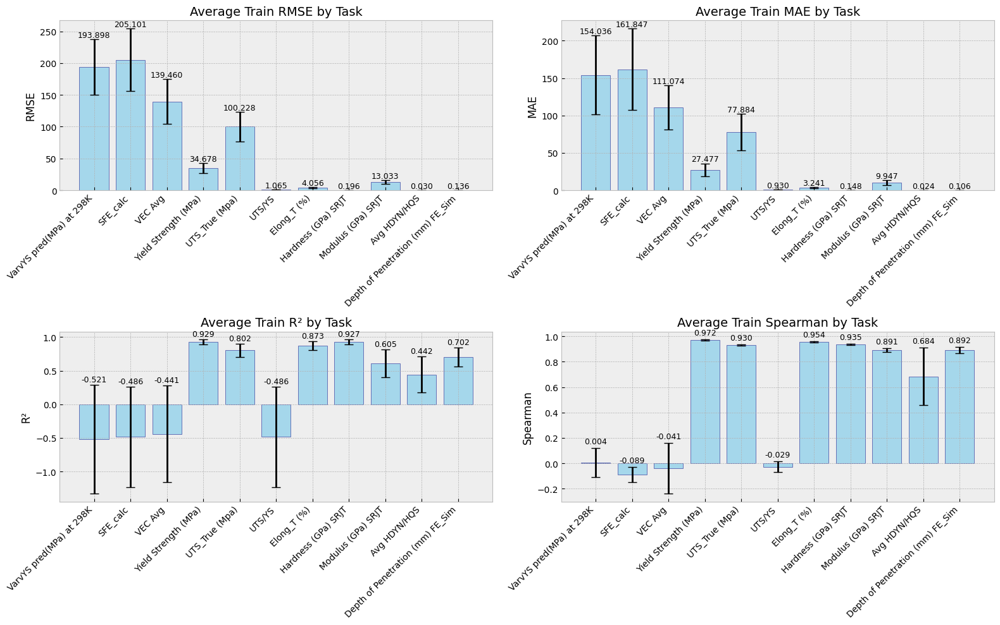

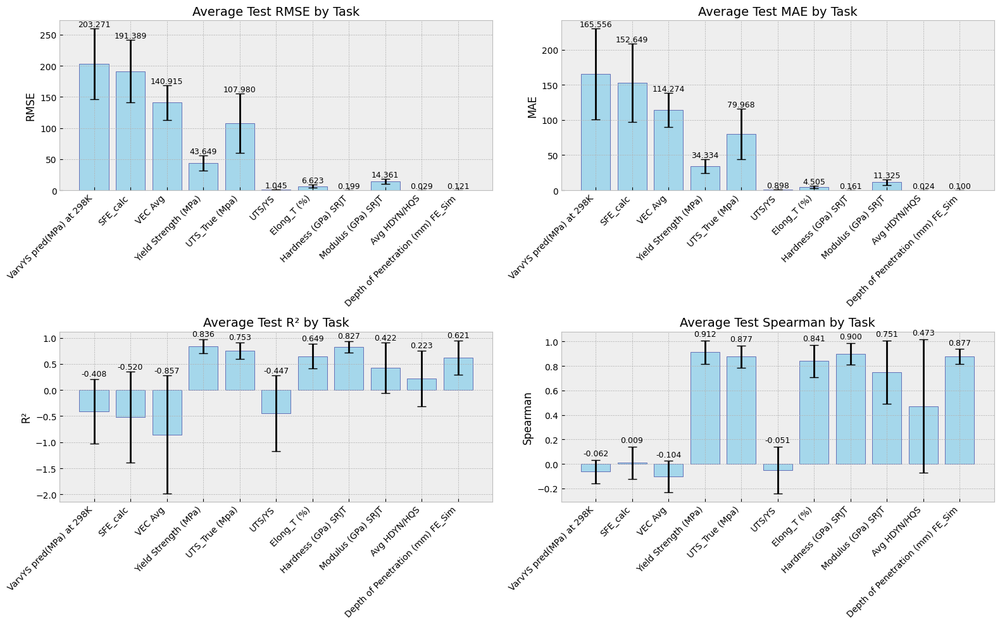


Average Train Metrics Across All Splits:

Task: VarvYS pred(MPa) at 298K (averaged over 5 splits)
----------------------------------------
Train RMSE: 193.8981 ± 43.5661
Train MAE: 154.0355 ± 52.9275
Train R²: -0.5214 ± 0.8101
Train Spearman: 0.0043 ± 0.1156
Train Kendall: 0.0008 ± 0.0779
GMAE: 0.4495 ± 0.1103
SMAPE: 42.40% ± 9.74%
MASE: 0.8947 ± 0.3223
RMSPE: 1.0789 ± 0.3795
Avg. Train Samples: 104.4

Task: SFE_calc (averaged over 5 splits)
----------------------------------------
Train RMSE: 205.1005 ± 49.3710
Train MAE: 161.8472 ± 54.5250
Train R²: -0.4863 ± 0.7454
Train Spearman: -0.0893 ± 0.0597
Train Kendall: -0.0608 ± 0.0414
GMAE: 6.0206 ± 0.4546
SMAPE: 97.44% ± 9.09%
MASE: 0.8837 ± 0.2900
RMSPE: 67.4665 ± 35.9008
Avg. Train Samples: 117.0

Task: VEC Avg (averaged over 5 splits)
----------------------------------------
Train RMSE: 139.4598 ± 35.3495
Train MAE: 111.0745 ± 29.6629
Train R²: -0.4410 ± 0.7174
Train Spearman: -0.0413 ± 0.1992
Train Kendall: -0.0307 ± 0.1361
GMAE: 0.

In [44]:
avg_train = calculate_average_metrics(results["train"], n_splits=1, output_vars=output_vars)
avg_test = calculate_average_metrics(results["test"], n_splits=1, output_vars=output_vars)

plot_average_metrics(avg_train, set_type="Train")
plot_average_metrics(avg_test, set_type="Test")
print_average_metrics(avg_train, set_type="Train")
print_average_metrics(avg_test, set_type="Test")


Reduction=3 Main task


=== Split 0 ===
✓ Prior predictions loaded successfully
8 ___________________________
8 ___________________________
8 ___________________________
8 ___________________________
train_fullx_scaled: (717, 9)
train_fully: (717, 1)
train_fully_scaled: (717, 1)
train_fullprior: (717,)
test_fullx_scaled: (183, 9)
test_fully: (183, 1)
test_fully_scaled: (183, 1)
test_fullprior: (183,)
output_scaler: 8
7 __________________________final i_______________________________--
Epoch 1/3000 - Train Loss: 5.853 - Val Loss: 6.478
Epoch 51/3000 - Train Loss: 1.363 - Val Loss: 2.060
Epoch 101/3000 - Train Loss: 1.028 - Val Loss: 1.828
Epoch 151/3000 - Train Loss: 0.912 - Val Loss: 1.831
Early stopping at epoch 175
[23.35900252 23.39160462 23.27221187 23.41288637 23.39972125 23.21158204
 23.40361484 23.43925168 23.41619605 23.36209923 23.40647462 23.44787628
 23.39120002 23.40413774 23.38944828 23.41816621 23.40640098 23.41638003
 23.39727084 23.38005209 23.42971316 23.42487118 23.33922177 23.36559299
 23.

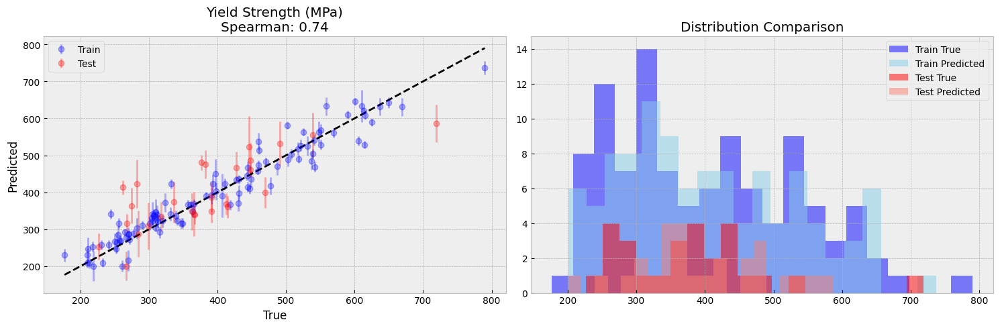

[20.31196857 19.8373469  19.70535027 19.25590376 19.788608   19.96467599
 20.28691332 20.59774984 19.9695573  19.92692328 20.78954374 20.34827388
 20.31746121 20.09583354 19.71832072 20.29262255 18.88850882 20.45392517
 20.20632136 19.69652149 20.58312995 19.77400762 19.81766553 19.99621719
 20.19300396 20.64674822 20.32146827 19.9794065  20.10976845 20.13490498
 20.31105922 20.68787951 20.20943183 19.95332704 20.49505849 20.20137455
 20.03342413 20.11989469 20.25886724 20.29407847 20.04590206 20.14857395
 20.35905778 19.9577156  20.1402955  20.31294893 20.08057709 20.44503686
 19.92503531 20.64851533 20.40432661 20.02072037 20.18910041 20.51390353
 20.32112632 19.5405612  20.21816548 20.14993862 19.89920817 20.16820695
 20.1351706  20.62873449 20.66290391 20.85237391 20.03799625 20.55025226
 19.9625132  20.01582789 20.4909128  20.40465911 20.14694702 20.72016737
 19.56487146 19.90900017 20.34931369 20.17590459 19.32518754 20.28284153
 20.79714474 20.50048097 20.55692809 20.27343229 20

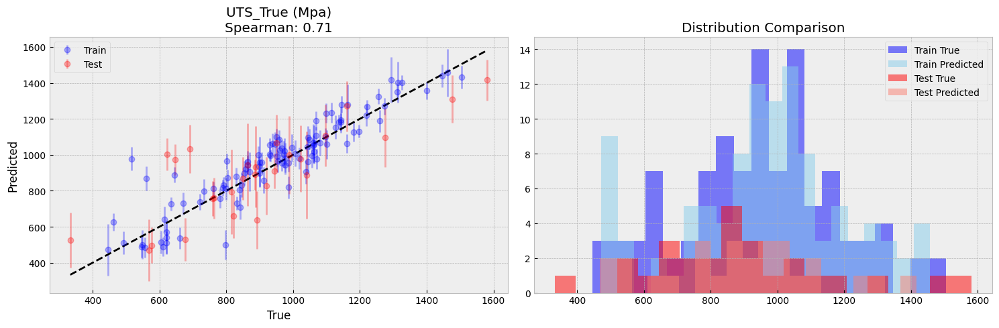

[-0.05678492 -0.05705781 -0.05799423 -0.06266866 -0.06279648 -0.07649587
 -0.06073362 -0.05675756 -0.05564922 -0.05833911 -0.05678672 -0.05908255
 -0.06066131 -0.05854118 -0.05822033 -0.0571306  -0.06741328 -0.05787654
 -0.05807314 -0.06073413 -0.05663391 -0.06133279 -0.05856816 -0.05800094
 -0.05869757 -0.05777333 -0.05833341 -0.05819632 -0.05695592 -0.05667645
 -0.05659868 -0.05734479 -0.05753401 -0.05995569 -0.05826881 -0.06184547
 -0.0574518  -0.05739083 -0.05764796 -0.05725654 -0.05829073 -0.05716433
 -0.05677209 -0.05678683 -0.05778449 -0.05825187 -0.06002086 -0.05763675
 -0.05741005 -0.05733118 -0.05930355 -0.05821259 -0.06013225 -0.05670537
 -0.05726311 -0.0618527  -0.05636119 -0.05799607 -0.05691915 -0.0607723
 -0.05802531 -0.06477238 -0.05913117 -0.05951878 -0.06201565 -0.0591855
 -0.05649405 -0.05763639 -0.05832444 -0.0629204  -0.05656862 -0.05756457
 -0.05675918 -0.05785137 -0.05733166 -0.05767068 -0.0626533  -0.06253232
 -0.05800012 -0.05760525 -0.05945112 -0.05654014 -0.0

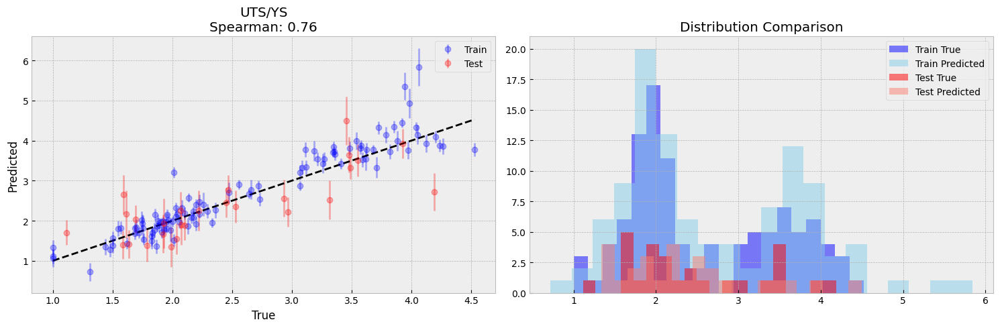

<ipython-input-75-d40fd0863cf2>:2157: RuntimeWarning: divide by zero encountered in divide
  train_rmspe = np.sqrt(np.mean(np.square((train_true_task - train_preds) / train_true_task)))
<ipython-input-75-d40fd0863cf2>:2188: RuntimeWarning: divide by zero encountered in divide
  test_rmspe = np.sqrt(np.mean(np.square((test_true_task - test_preds) / test_true_task)))


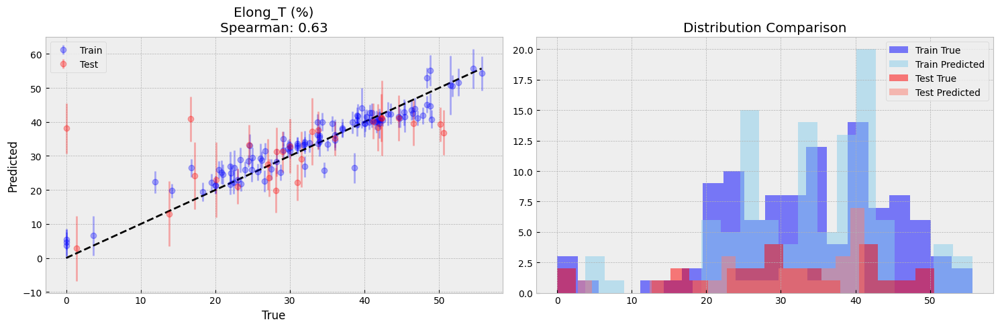

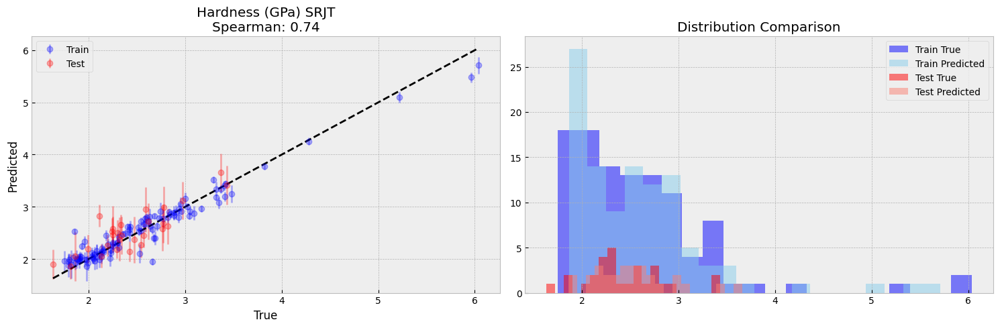

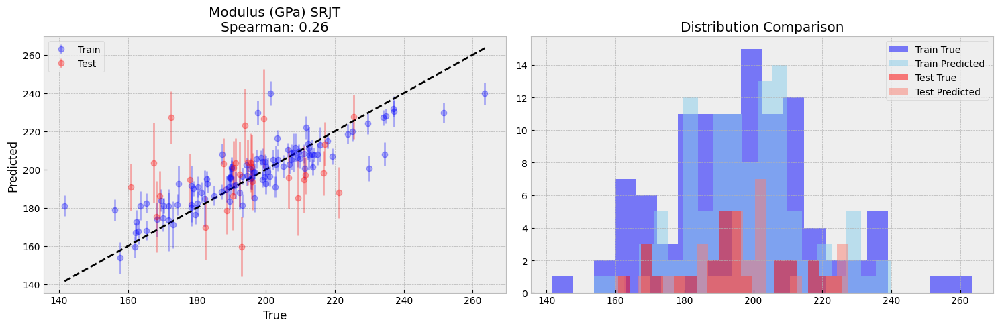

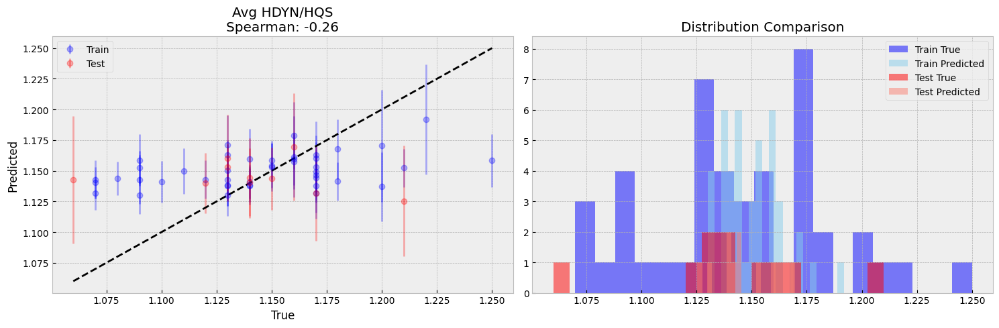

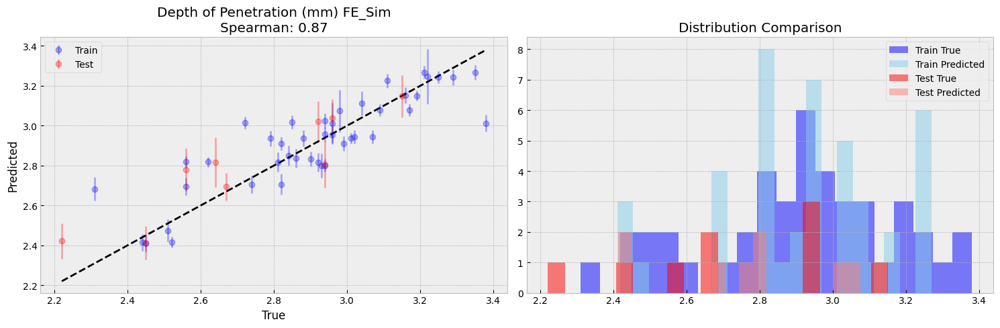


=== Split 1 ===
✓ Prior predictions loaded successfully
8 ___________________________
8 ___________________________
8 ___________________________
8 ___________________________
train_fullx_scaled: (717, 9)
train_fully: (717, 1)
train_fully_scaled: (717, 1)
train_fullprior: (717,)
test_fullx_scaled: (173, 9)
test_fully: (173, 1)
test_fully_scaled: (173, 1)
test_fullprior: (173,)
output_scaler: 8
7 __________________________final i_______________________________--
Epoch 1/3000 - Train Loss: 6.724 - Val Loss: 6.678
Epoch 51/3000 - Train Loss: 1.453 - Val Loss: 1.896
Epoch 101/3000 - Train Loss: 1.076 - Val Loss: 1.597
Epoch 151/3000 - Train Loss: 0.957 - Val Loss: 1.573
Epoch 201/3000 - Train Loss: 0.864 - Val Loss: 1.551
Epoch 251/3000 - Train Loss: 0.765 - Val Loss: 1.538
Early stopping at epoch 253
[18.95375664 18.88331245 18.87873479 18.88522446 18.89304653 18.84937373
 18.85495143 19.0121277  18.76433424 18.9001657  18.88039705 19.00058412
 18.87122594 18.96984027 18.86674233 18.9875

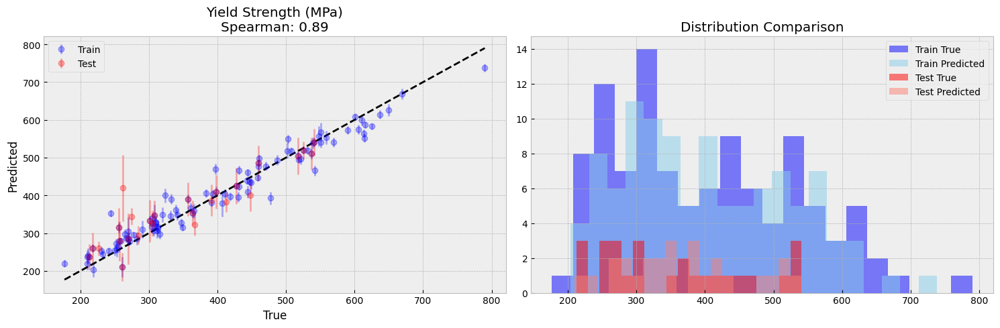

[20.29729455 20.83900631 20.0388543  21.40822927 20.08586353 20.55253031
 20.80513217 20.96258027 20.67758281 20.44199414 20.82163571 20.29883667
 21.2556519  20.95051751 20.6832909  20.90257686 21.59715151 20.53535263
 20.98631147 20.57644884 20.2254212  20.62478757 20.71719768 20.68941525
 21.13489571 21.18720134 20.51741009 20.52802923 22.24356193 21.08905359
 21.52904171 21.39985702 20.47327747 19.67024284 20.83664244 20.22176244
 21.26305182 20.42057927 20.786864   20.76151434 21.12340546 20.37569662
 20.93306863 20.20950239 20.92606224 20.42502139 20.83821846 21.06637333
 20.44468485 19.9283087  20.44805595 20.98213412 19.94692776 20.91975151
 20.66439186 20.82852002 21.57047483 19.99824336 20.61533975 20.15262474
 20.31875588 21.10359342 20.90736571 20.65830131 19.67587653 20.43774111
 20.88412256 20.12614301 20.55397337 21.18178539 20.84869682 21.19676396
 20.87438474 20.95876742 21.05302265 20.8267423  21.34058029 20.4382731
 20.02090188 20.54468413 20.84482863 20.91463796 22.

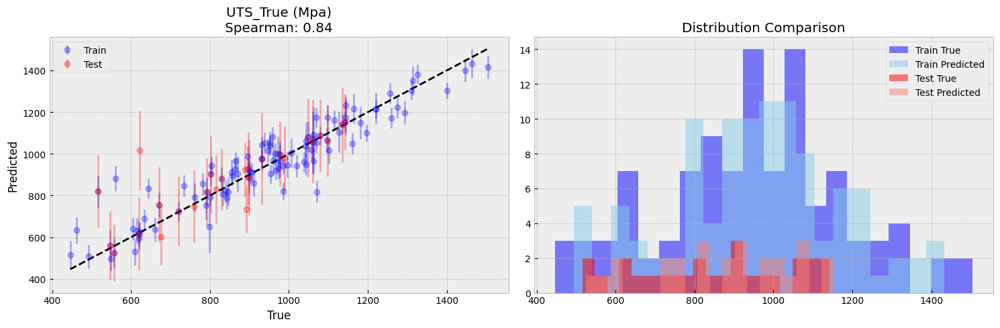

[0.0057862  0.00559318 0.00588321 0.00584615 0.0017048  0.00286986
 0.00664569 0.00721571 0.00694089 0.00595454 0.00762499 0.00683687
 0.00808861 0.0065228  0.00814015 0.00730532 0.00823513 0.00640589
 0.00648415 0.0068422  0.0058132  0.00651308 0.00701231 0.00708115
 0.00556763 0.00508686 0.00675552 0.00682478 0.00589615 0.00587989
 0.00558058 0.00768041 0.00780483 0.00774264 0.00670148 0.00670891
 0.00653858 0.00626761 0.0079189  0.00743105 0.00756747 0.00763607
 0.00601409 0.00670666 0.00718857 0.00663403 0.0075408  0.00735621
 0.00681613 0.00753463 0.00580002 0.00599698 0.00744662 0.00659713
 0.00710095 0.00653054 0.00783546 0.0069565  0.00711219 0.00574398
 0.00726664 0.0060146  0.00726492 0.00679714 0.00504623 0.00702107
 0.00650892 0.00631541 0.00764075 0.00641937 0.00721361 0.00742556
 0.00645315 0.0056111  0.00705938 0.00606247 0.00830379 0.00755202
 0.00691334 0.00754305 0.00470242 0.00710682 0.00571895 0.00692294
 0.00727387 0.00569017 0.00766389 0.0061556  0.0056811  0.0054

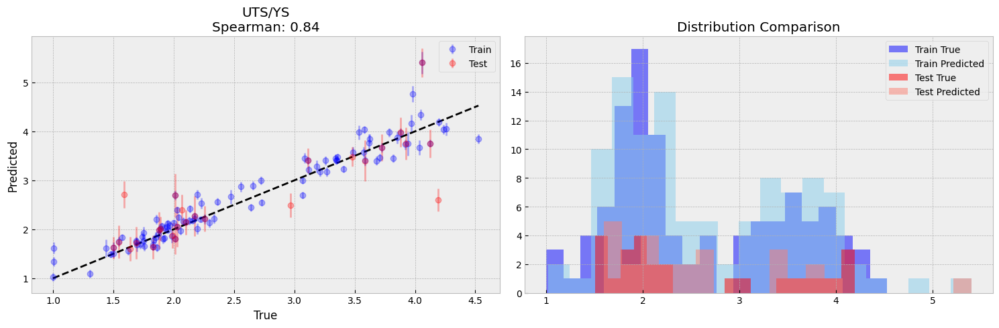

<ipython-input-75-d40fd0863cf2>:2157: RuntimeWarning: divide by zero encountered in divide
  train_rmspe = np.sqrt(np.mean(np.square((train_true_task - train_preds) / train_true_task)))
<ipython-input-75-d40fd0863cf2>:2188: RuntimeWarning: divide by zero encountered in divide
  test_rmspe = np.sqrt(np.mean(np.square((test_true_task - test_preds) / test_true_task)))


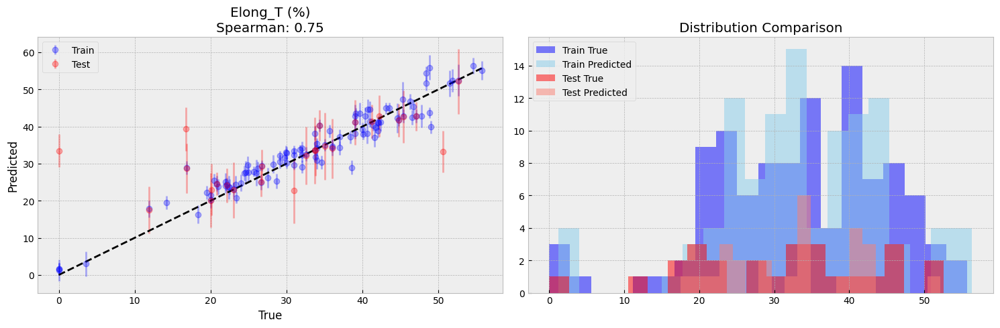

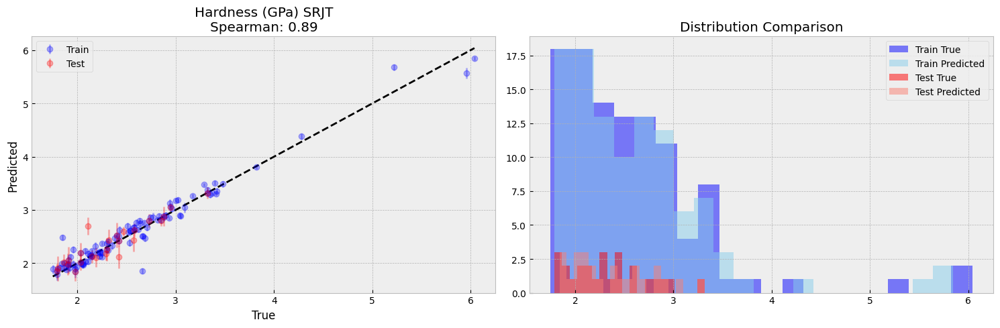

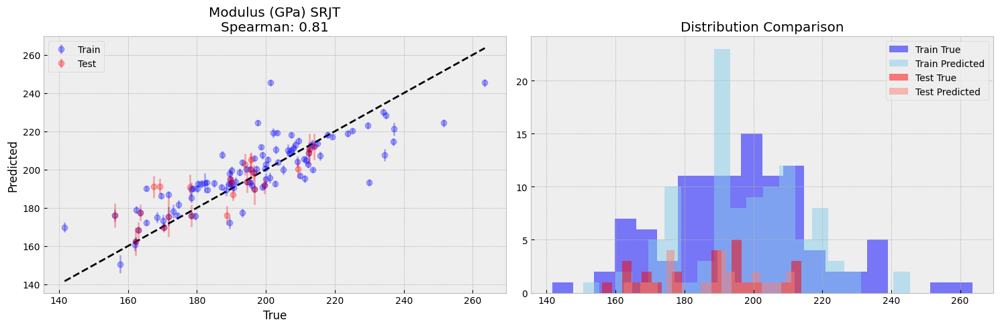

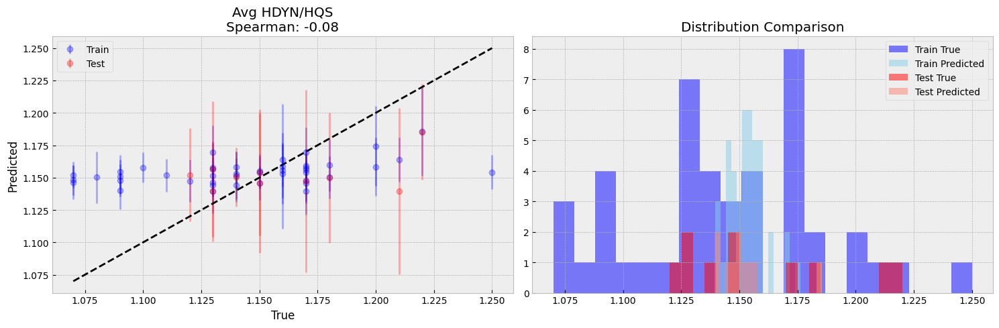

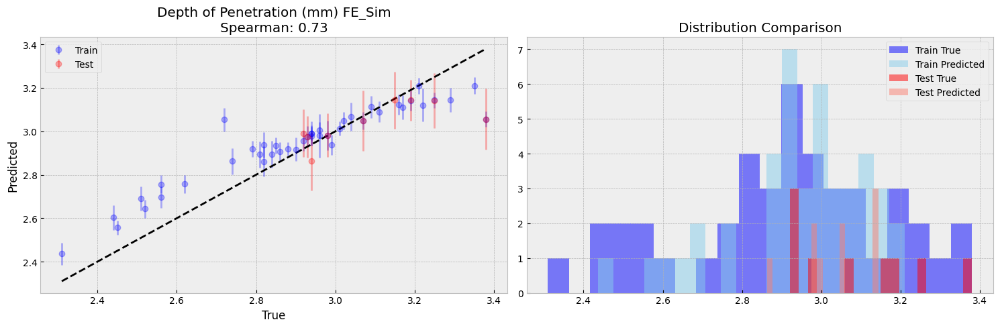


=== Split 2 ===
✓ Prior predictions loaded successfully
8 ___________________________
8 ___________________________
8 ___________________________
8 ___________________________
train_fullx_scaled: (717, 9)
train_fully: (717, 1)
train_fully_scaled: (717, 1)
train_fullprior: (717,)
test_fullx_scaled: (182, 9)
test_fully: (182, 1)
test_fully_scaled: (182, 1)
test_fullprior: (182,)
output_scaler: 8
7 __________________________final i_______________________________--
Epoch 1/3000 - Train Loss: 6.094 - Val Loss: 5.605
Epoch 51/3000 - Train Loss: 1.328 - Val Loss: 3.138
Epoch 101/3000 - Train Loss: 1.019 - Val Loss: 2.929
Epoch 151/3000 - Train Loss: 0.900 - Val Loss: 3.007
Early stopping at epoch 153
[-23.52236143 -22.84943587 -23.23883416 -23.49711828 -22.63089638
 -19.44649353 -23.31467914 -23.34636519 -22.92871645 -23.17348263
 -22.54147807 -22.97641638 -23.4653156  -23.43350657 -22.49774365
 -23.35738644 -21.79302067 -22.92371161 -23.35854359 -23.65906381
 -23.60696655 -23.46631887 -23.5

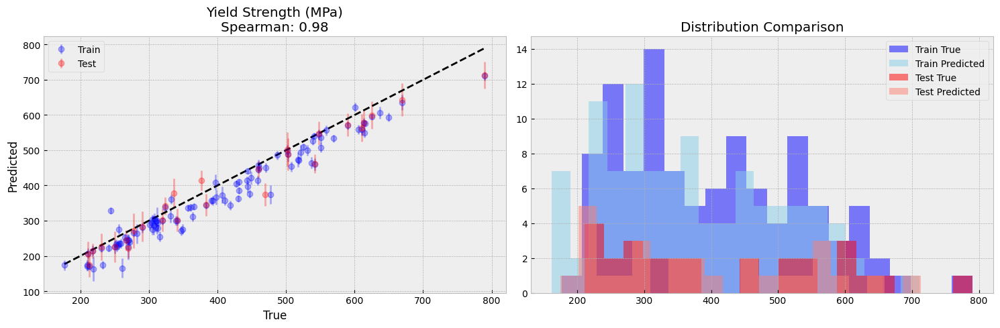

[-78.49792676 -79.59680544 -74.83108923 -75.57103665 -68.32309942
 -71.51890277 -76.09215894 -79.40298608 -79.77850408 -78.88743375
 -78.22580882 -78.17967713 -79.79517164 -79.60587841 -79.87286641
 -77.15587624 -75.29510309 -74.49863547 -81.89944972 -72.65836713
 -79.13266726 -73.2662876  -78.42229087 -73.96838484 -79.61757555
 -78.20659698 -80.40966942 -77.70819216 -79.00512877 -78.97282579
 -75.48903555 -78.28658854 -80.01309577 -81.80734284 -76.36389712
 -80.21288014 -80.97012098 -80.90315872 -78.33473965 -78.92401656
 -80.23806967 -79.19366789 -76.64556298 -76.57901782 -77.99570933
 -78.05359554 -78.60105068 -78.6843585  -79.40827612 -80.03429071
 -80.20198516 -78.42437176 -78.98704453 -81.13925692 -76.90943223
 -78.41145914 -76.29286402 -79.95475748 -80.72491783 -74.8952804
 -81.00568951 -77.07932284 -79.19686681 -80.79615609 -70.97887104
 -78.23375014 -80.04785309 -79.86805252 -79.03129324 -72.66581914
 -80.07428139 -76.23092424 -78.9142157  -79.8818666  -80.82691973
 -79.855013

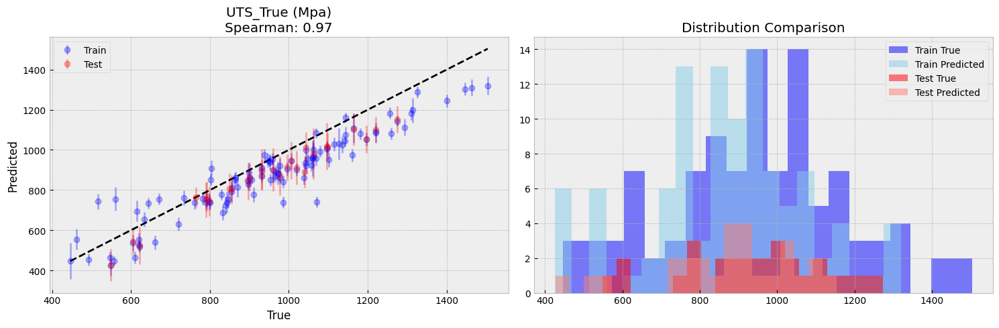

[-0.31029775 -0.32000021 -0.3116516  -0.30072127 -0.28268337 -0.31371747
 -0.30521272 -0.31560412 -0.31198161 -0.31141689 -0.31904219 -0.31842011
 -0.31441708 -0.32105589 -0.31105928 -0.31809    -0.29315659 -0.31008142
 -0.31637985 -0.31878799 -0.31037348 -0.31514349 -0.31047702 -0.30898199
 -0.31197012 -0.31681679 -0.32066171 -0.31351718 -0.31324036 -0.3185099
 -0.31778632 -0.30407945 -0.32451986 -0.30516936 -0.31332905 -0.31912829
 -0.31531017 -0.31452561 -0.32010671 -0.32058081 -0.31903058 -0.31336049
 -0.29964201 -0.31776169 -0.31730877 -0.32102936 -0.31583437 -0.31275044
 -0.30436989 -0.31525601 -0.31243782 -0.31391743 -0.31357179 -0.31534417
 -0.3172418  -0.32372749 -0.31709809 -0.31095358 -0.32276321 -0.31751393
 -0.32061854 -0.3085463  -0.31723031 -0.30750388 -0.29727816 -0.31589844
 -0.31759846 -0.30720934 -0.31892971 -0.2923177  -0.3200135  -0.31723523
 -0.31396574 -0.32389973 -0.31822822 -0.3169499  -0.31653491 -0.31496076
 -0.31011544 -0.31547963 -0.31925857 -0.3184429  -0.

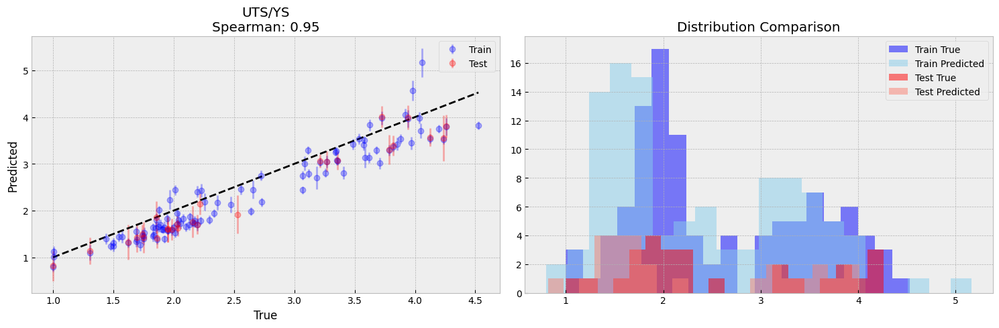

<ipython-input-75-d40fd0863cf2>:2157: RuntimeWarning: divide by zero encountered in divide
  train_rmspe = np.sqrt(np.mean(np.square((train_true_task - train_preds) / train_true_task)))
<ipython-input-75-d40fd0863cf2>:2188: RuntimeWarning: divide by zero encountered in divide
  test_rmspe = np.sqrt(np.mean(np.square((test_true_task - test_preds) / test_true_task)))


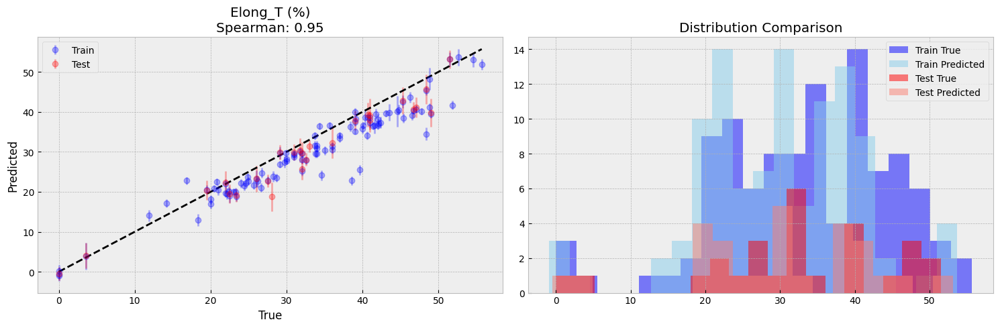

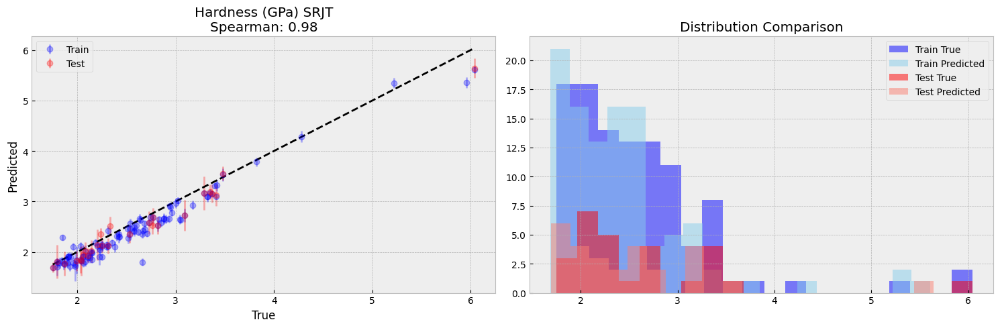

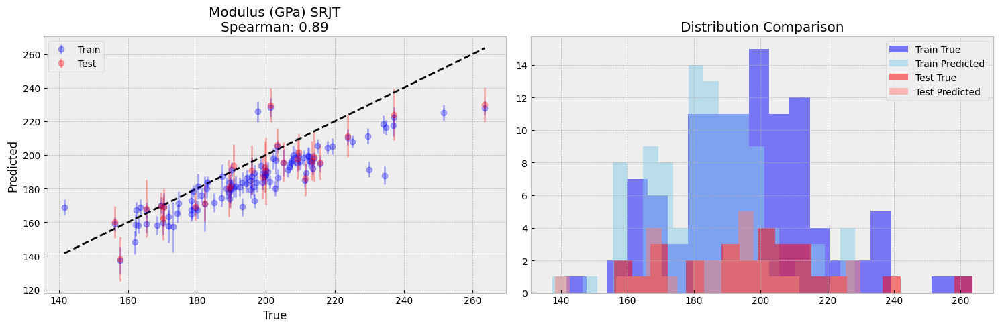

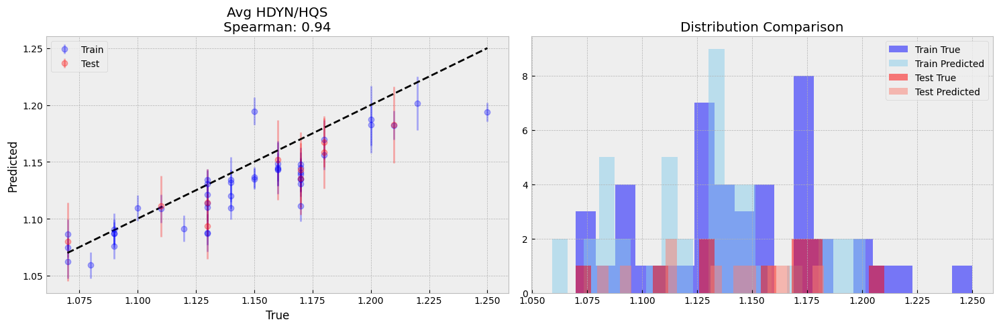

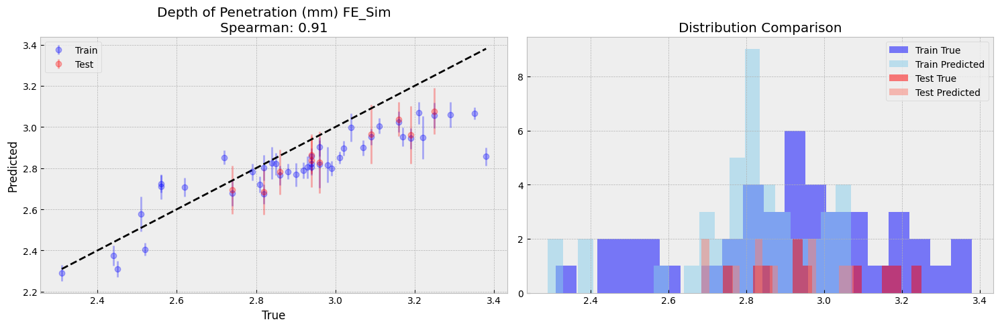


=== Split 3 ===
✓ Prior predictions loaded successfully
8 ___________________________
8 ___________________________
8 ___________________________
8 ___________________________
train_fullx_scaled: (717, 9)
train_fully: (717, 1)
train_fully_scaled: (717, 1)
train_fullprior: (717,)
test_fullx_scaled: (180, 9)
test_fully: (180, 1)
test_fully_scaled: (180, 1)
test_fullprior: (180,)
output_scaler: 8
7 __________________________final i_______________________________--
Epoch 1/3000 - Train Loss: 5.584 - Val Loss: 10.956
Epoch 51/3000 - Train Loss: 1.356 - Val Loss: 6.680
Epoch 101/3000 - Train Loss: 1.020 - Val Loss: 6.714
Early stopping at epoch 120
[10.10948044 10.06923672 10.00440915 10.16189906  9.64478745  9.62457923
 10.04043611 10.1834846  10.0337353  10.2420783  10.26761785 10.12865722
 10.07525163  9.54814062 10.09040667 10.11657824  9.88506425  9.98713116
  9.91076687  9.88239597  9.64449077 10.41944476 10.050612    8.85687951
  9.88133456  9.64472391 10.15828734 10.44744127  9.6168

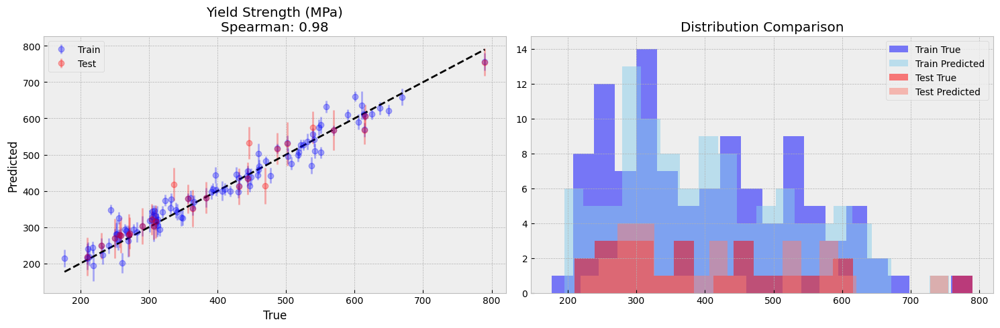

[15.48561117 15.351325   14.34952102 14.12765875 13.97329536 12.92179885
 14.93226364 15.24971108 15.02505527 15.14198275 15.35650808 15.28772092
 15.55627161 15.08938506 14.89382783 14.98761699 14.12184262 14.83996473
 15.09731897 15.07746296 14.99400619 14.88997893 15.19546712 14.62043539
 14.2351277  14.44044325 15.20199993 15.18881182 14.82746137 15.30209702
 14.81480984 13.98918569 15.30575107 14.17478545 14.96196377 14.76705627
 14.48122198 15.38972229 15.39136126 14.96454215 15.21772543 14.25627885
 14.51052868 14.44304966 15.05904436 15.07670373 15.30998768 15.05761005
 14.43892267 15.1397086  14.84948367 15.11104671 13.72968927 15.13201549
 14.88319805 14.74346275 15.10248835 14.99385228 15.06762124 14.36733447
 14.869919   14.26309416 14.90513685 15.40970343 14.26919488 15.1464039
 15.44812031 14.43359036 14.75924527 15.14570027 15.16762177 15.18208803
 14.94640358 15.2182239  15.02858094 15.14113976 14.91149558 14.79599777
 14.970958   15.23189919 15.03228345 15.38298568 15.

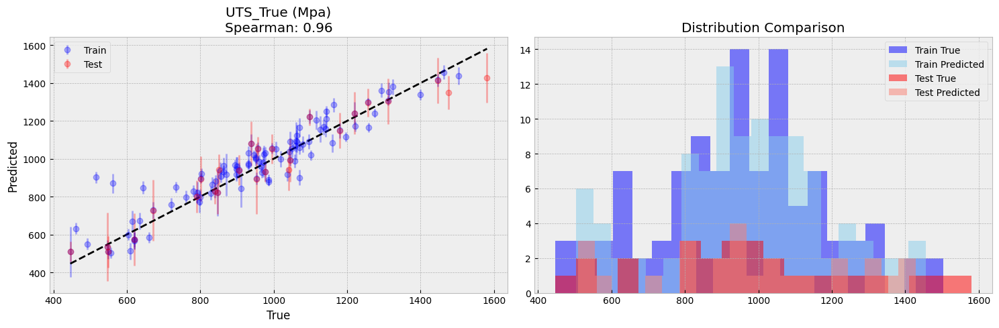

[0.03994198 0.04036634 0.0405737  0.04166867 0.03793317 0.04329564
 0.04014962 0.04265159 0.04052145 0.04047077 0.04207862 0.03951632
 0.03990632 0.03971513 0.04012562 0.03827688 0.04366286 0.03926649
 0.04107323 0.03939346 0.03898018 0.03835203 0.03973454 0.03922621
 0.03984317 0.04233079 0.0408002  0.04283892 0.03789619 0.04196718
 0.03877268 0.03384388 0.04081161 0.04112086 0.03844044 0.04156623
 0.03816012 0.03952517 0.04027003 0.04041866 0.04008701 0.04032503
 0.04020765 0.03835176 0.03966833 0.03862138 0.04097987 0.04048251
 0.03999587 0.04158746 0.04073623 0.03949999 0.04006013 0.04202605
 0.03946325 0.03893995 0.04035965 0.04059634 0.03954238 0.04264473
 0.03983169 0.04211696 0.04076294 0.0409274  0.04512804 0.04031644
 0.04060625 0.0392811  0.04089616 0.03929629 0.03995223 0.03900808
 0.04041332 0.04562467 0.04086719 0.039438   0.04190381 0.03855012
 0.04146785 0.04121996 0.04019405 0.03889616 0.04122195 0.04057924
 0.0415246  0.04075275 0.03990249 0.03944395 0.03828727 0.0364

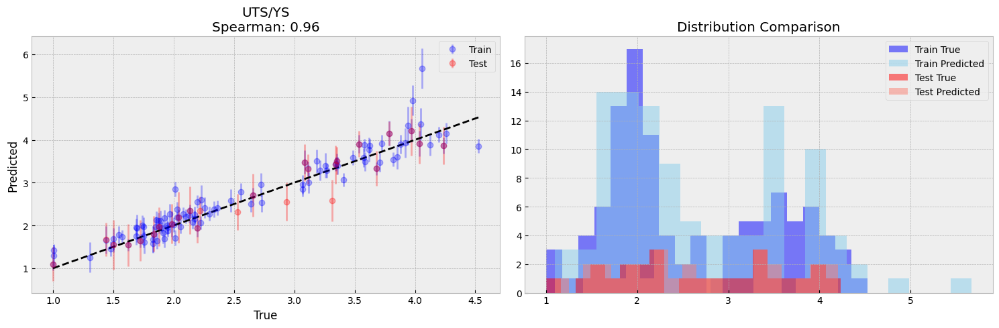

<ipython-input-75-d40fd0863cf2>:2157: RuntimeWarning: divide by zero encountered in divide
  train_rmspe = np.sqrt(np.mean(np.square((train_true_task - train_preds) / train_true_task)))
<ipython-input-75-d40fd0863cf2>:2188: RuntimeWarning: divide by zero encountered in divide
  test_rmspe = np.sqrt(np.mean(np.square((test_true_task - test_preds) / test_true_task)))


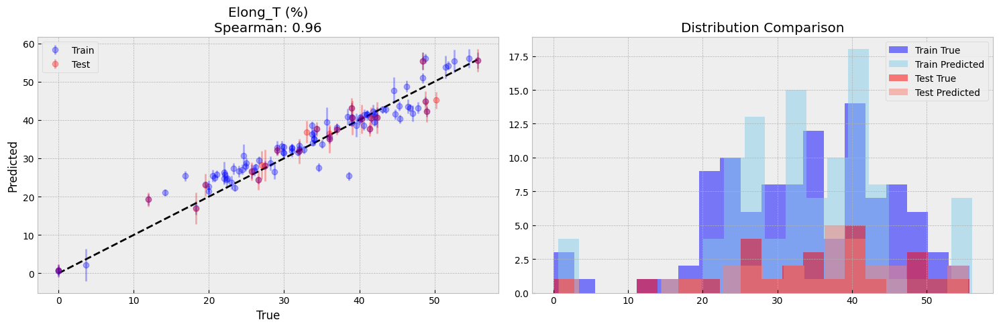

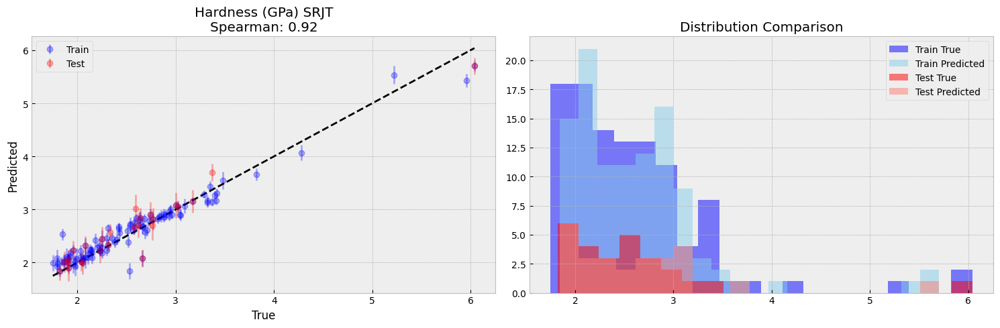

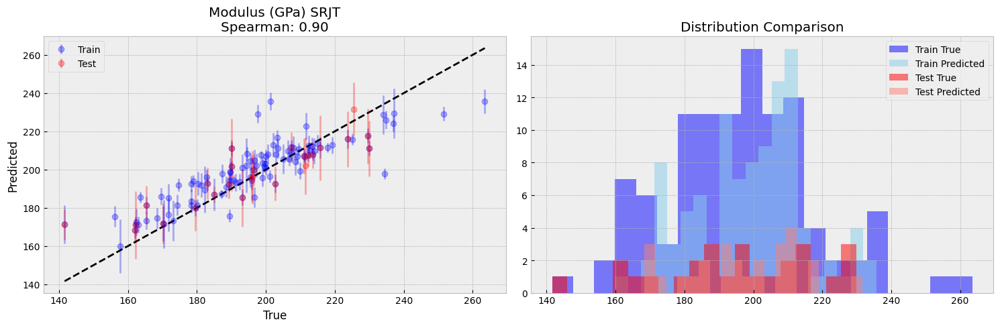

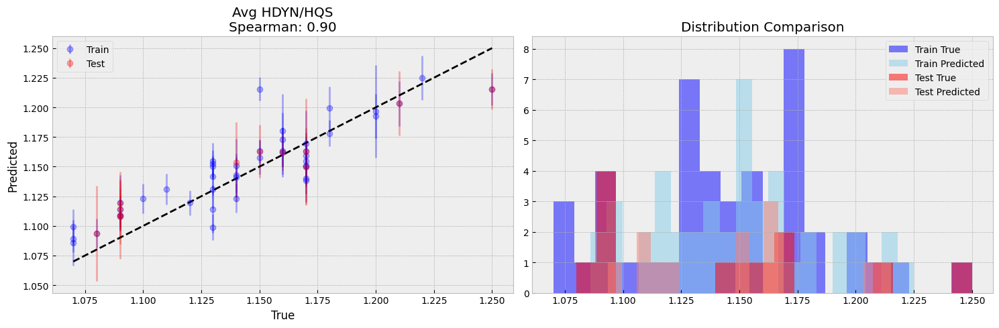

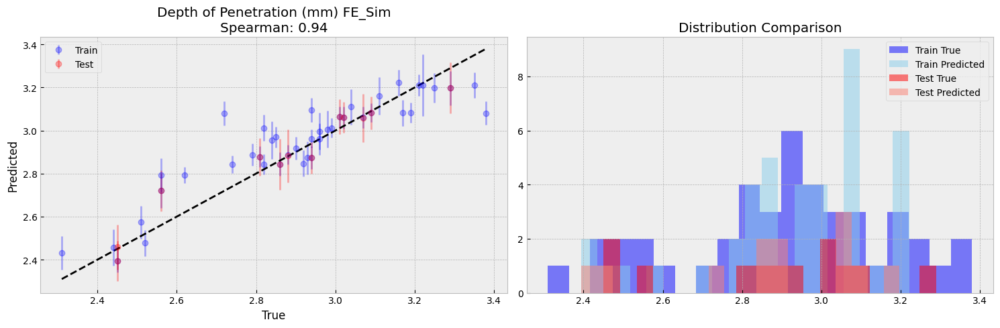


=== Split 4 ===
✓ Prior predictions loaded successfully
8 ___________________________
8 ___________________________
8 ___________________________
8 ___________________________
train_fullx_scaled: (717, 9)
train_fully: (717, 1)
train_fully_scaled: (717, 1)
train_fullprior: (717,)
test_fullx_scaled: (191, 9)
test_fully: (191, 1)
test_fully_scaled: (191, 1)
test_fullprior: (191,)
output_scaler: 8
7 __________________________final i_______________________________--
Epoch 1/3000 - Train Loss: 5.845 - Val Loss: 6.468
Epoch 51/3000 - Train Loss: 1.353 - Val Loss: 2.624
Epoch 101/3000 - Train Loss: 1.026 - Val Loss: 2.447
Early stopping at epoch 148
[-7.93793529 -7.52151489 -7.02145895 -7.87377422 -6.73809016 -5.78247954
 -7.6464166  -7.73315208 -7.79851318 -7.84837724 -7.92226715 -7.75310955
 -7.91401415 -7.78888233 -7.41097561 -7.72440111 -7.27316676 -7.79976085
 -7.71320089 -7.29765402 -7.82401096 -7.16092842 -7.93789919 -6.76445272
 -7.60987938 -7.72004708 -7.60033396 -7.20272233 -7.95604

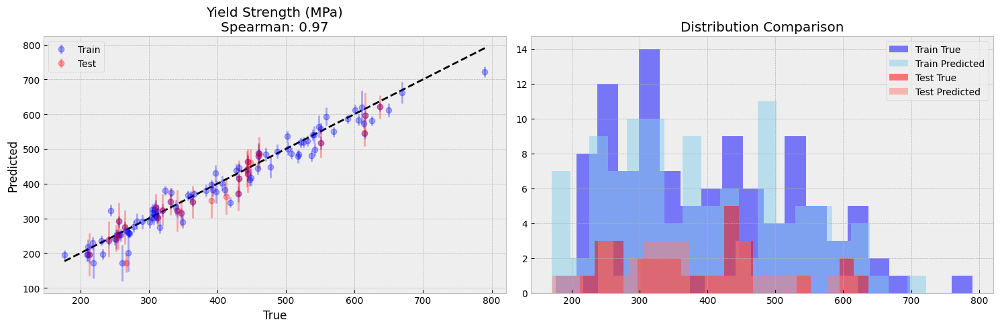

[-28.37849106 -28.28282331 -28.2397833  -28.68321063 -26.68917349
 -28.27245333 -28.4617719  -28.17956235 -28.28883848 -28.18549002
 -28.56142225 -28.51875776 -28.30529637 -27.56748122 -28.14887464
 -28.15559349 -28.04455753 -28.05027626 -28.38610413 -26.60458832
 -28.11614287 -28.00169313 -27.98603597 -27.72817022 -27.82644839
 -28.07198429 -28.15280899 -27.59304769 -28.37013    -28.36442285
 -29.10116719 -28.06676757 -28.37497442 -27.86789073 -28.61543533
 -27.89091267 -28.50969901 -27.94325894 -28.15429406 -28.1931411
 -28.06673478 -27.93803427 -27.93875674 -28.39433206 -28.04090454
 -28.27564865 -28.25102159 -27.9403359  -26.50770701 -27.87846101
 -27.99362121 -28.22971909 -28.37044366 -28.45762685 -28.12384256
 -27.8074799  -27.91930527 -28.17813695 -28.30991829 -28.09168649
 -28.21206718 -27.67013833 -28.10080631 -28.26944879 -27.4201879
 -28.43004885 -27.84516835 -28.59898999 -27.91123257 -28.05033226
 -28.20373475 -28.25718359 -27.84577393 -28.25933676 -27.95513585
 -28.1959353

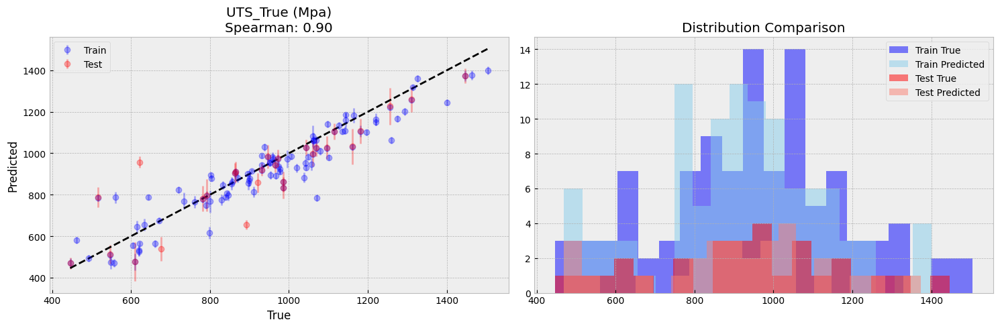

[-0.16014376 -0.15881791 -0.1596461  -0.15853287 -0.15693655 -0.14844656
 -0.15951474 -0.15856944 -0.16023108 -0.15810393 -0.15972194 -0.16061682
 -0.15957556 -0.16166364 -0.1594861  -0.16023907 -0.16101196 -0.15986399
 -0.15954841 -0.16077991 -0.15989798 -0.16086788 -0.16054126 -0.15633708
 -0.16167332 -0.16011785 -0.15883845 -0.1581702  -0.15990718 -0.16112381
 -0.15876144 -0.15941857 -0.15943044 -0.16061558 -0.157758   -0.15909424
 -0.15932867 -0.15904833 -0.15716233 -0.15907631 -0.15933063 -0.15986823
 -0.15888397 -0.16050932 -0.16028096 -0.15921046 -0.16174531 -0.16005317
 -0.15700286 -0.15934486 -0.15747038 -0.16081942 -0.15891746 -0.16099486
 -0.16128683 -0.15607814 -0.16157452 -0.161148   -0.16058474 -0.161168
 -0.15864404 -0.15634895 -0.15942394 -0.15996683 -0.15469402 -0.16042774
 -0.15983655 -0.15773035 -0.16012645 -0.15730165 -0.15967885 -0.15928928
 -0.16095393 -0.16026142 -0.15987534 -0.16058205 -0.159394   -0.15880879
 -0.15947251 -0.16146246 -0.15924823 -0.16008755 -0.1

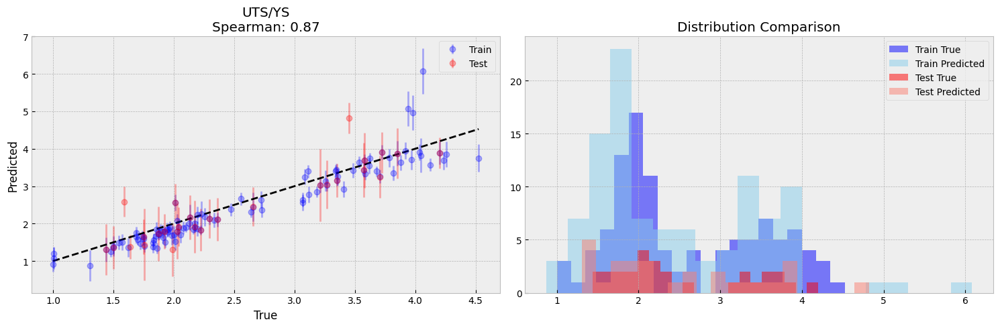

<ipython-input-75-d40fd0863cf2>:2157: RuntimeWarning: divide by zero encountered in divide
  train_rmspe = np.sqrt(np.mean(np.square((train_true_task - train_preds) / train_true_task)))


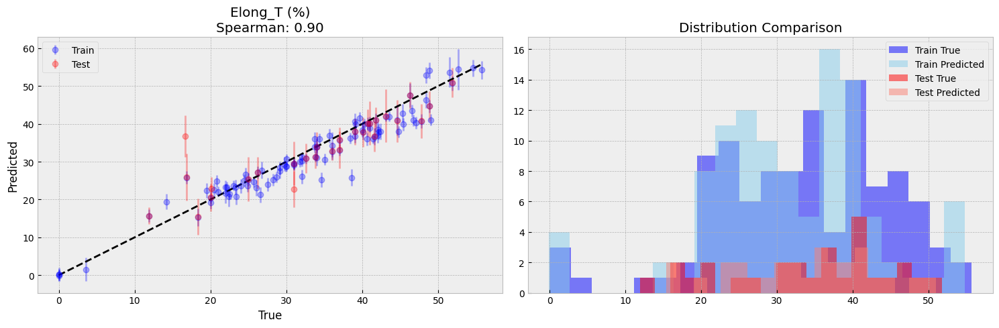

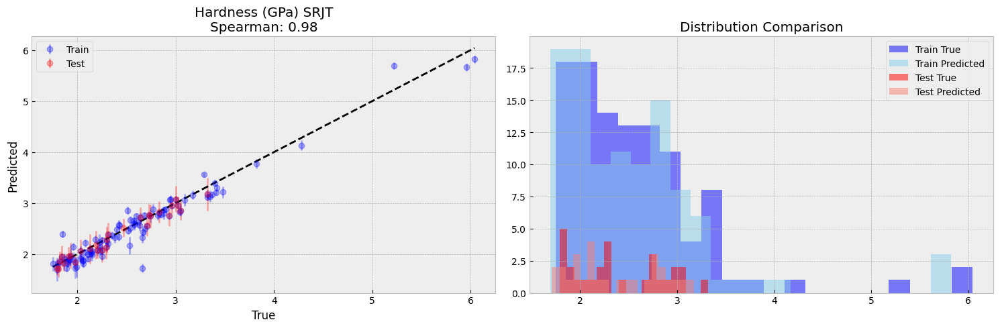

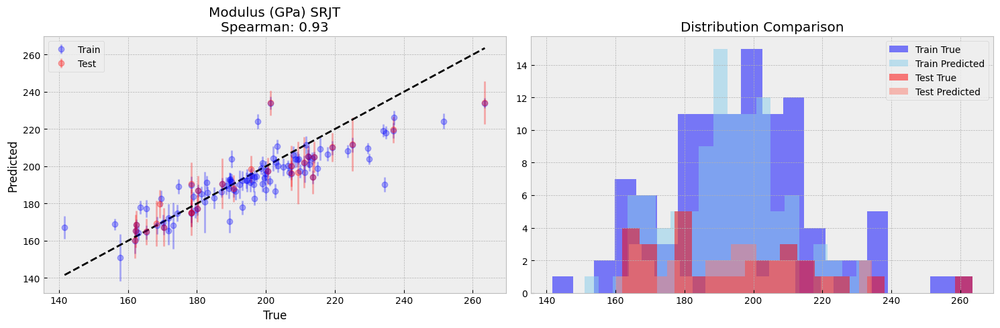

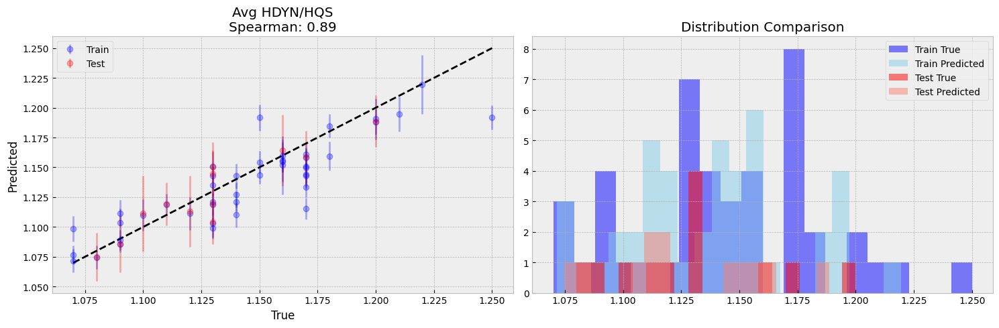

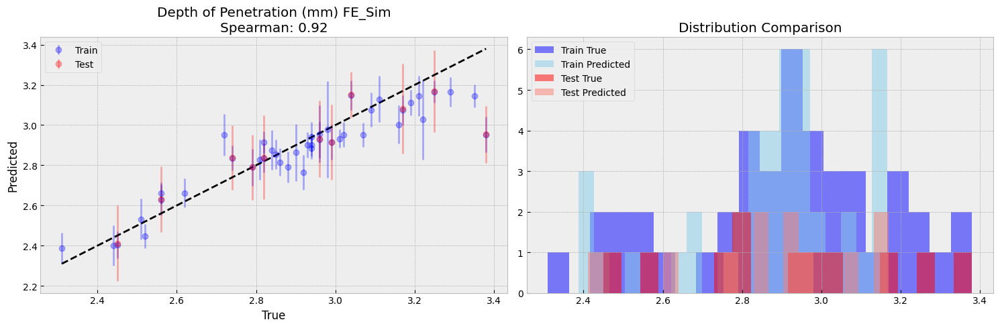

/usr/local/lib/python3.11/dist-packages/numpy/_core/_methods.py:185: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


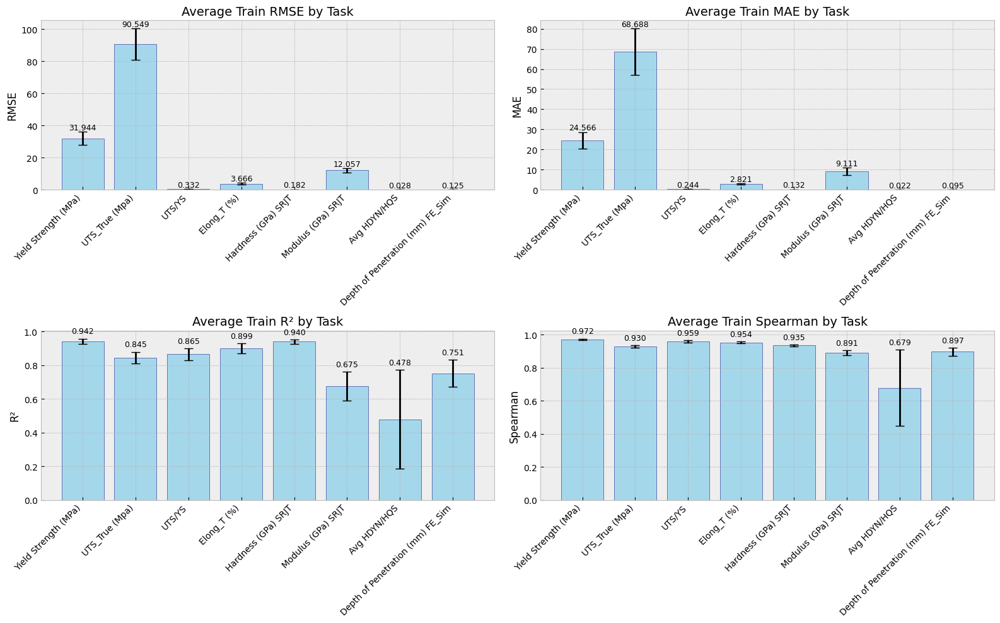

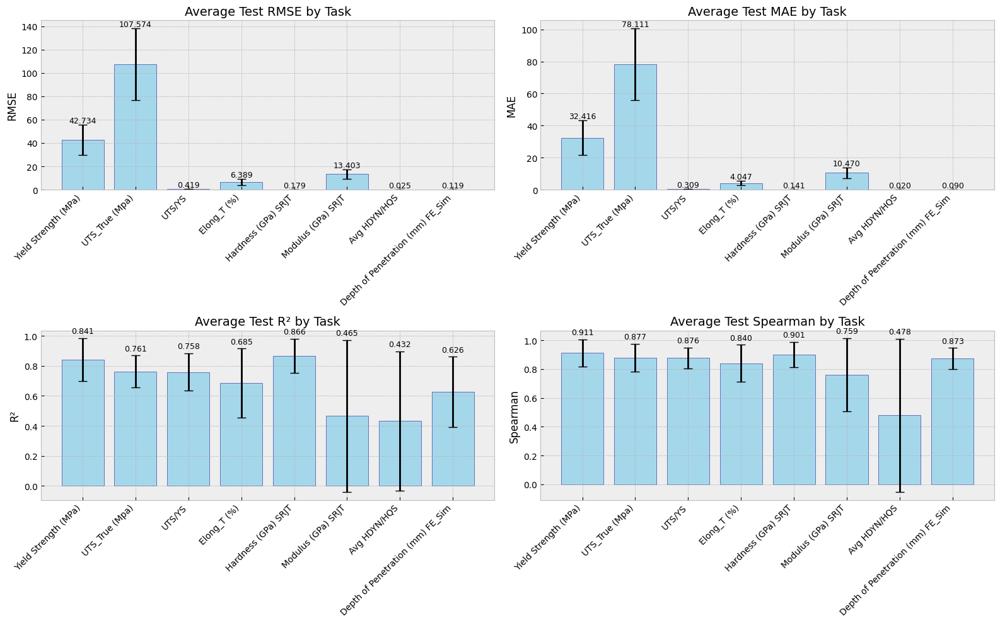


Average Train Metrics Across All Splits:

Task: Yield Strength (MPa) (averaged over 5 splits)
----------------------------------------
Train RMSE: 31.9442 ± 4.2592
Train MAE: 24.5658 ± 4.1111
Train R²: 0.9416 ± 0.0159
Train Spearman: 0.9724 ± 0.0041
Train Kendall: 0.8690 ± 0.0130
GMAE: 0.0684 ± 0.0125
SMAPE: 6.82% ± 1.25%
MASE: 0.1424 ± 0.0238
RMSPE: 0.0938 ± 0.0097
Avg. Train Samples: 105.0

Task: UTS_True (Mpa) (averaged over 5 splits)
----------------------------------------
Train RMSE: 90.5489 ± 9.8583
Train MAE: 68.6884 ± 11.5030
Train R²: 0.8445 ± 0.0345
Train Spearman: 0.9296 ± 0.0061
Train Kendall: 0.7913 ± 0.0128
GMAE: 0.0798 ± 0.0131
SMAPE: 7.95% ± 1.31%
MASE: 0.2713 ± 0.0454
RMSPE: 0.1226 ± 0.0125
Avg. Train Samples: 105.0

Task: UTS/YS (averaged over 5 splits)
----------------------------------------
Train RMSE: 0.3319 ± 0.0443
Train MAE: 0.2440 ± 0.0449
Train R²: 0.8648 ± 0.0345
Train Spearman: 0.9592 ± 0.0077
Train Kendall: 0.8283 ± 0.0167
GMAE: 0.0993 ± 0.0228
SMAPE: 9.

In [75]:
import pandas as pd
import numpy as np
import torch
import gpytorch
from gpytorch.means import ConstantMean, LinearMean
from gpytorch.kernels import MaternKernel, ScaleKernel
from gpytorch.variational import VariationalStrategy, CholeskyVariationalDistribution
from gpytorch.distributions import MultivariateNormal
from gpytorch.models.deep_gps import DeepGPLayer, DeepGP
from gpytorch.mlls import DeepApproximateMLL, VariationalELBO
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from scipy.stats import kendalltau, spearmanr
from sklearn.metrics import mean_absolute_error, mean_squared_error

class DGPLastLayer3(gpytorch.models.ApproximateGP):
    def __init__(self, input_dims, output_dims, num_inducing=128, linear_mean=True):
        num_latents = 10
        inducing_points = torch.randn(10, num_inducing, input_dims)

        variational_distribution = CholeskyVariationalDistribution(
            num_inducing_points=num_inducing,
            batch_shape=torch.Size([num_latents]))

        variational_strategy = gpytorch.variational.LMCVariationalStrategy(
            gpytorch.variational.VariationalStrategy(
                self, inducing_points, variational_distribution, learn_inducing_locations=True
            ),
            num_tasks=output_dims,
            num_latents=10,
            latent_dim=-1
        )

        super().__init__(variational_strategy)
        self.mean_module = ConstantMean(batch_shape=torch.Size([10])) if linear_mean else LinearMean(input_dims) #gpytorch.means.ConstantMean(batch_shape=torch.Size([10]))
        self.covar_module = gpytorch.kernels.ScaleKernel(
            gpytorch.kernels.RBFKernel(batch_shape=torch.Size([10])),
            batch_shape=torch.Size([10])
        )

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return MultivariateNormal(mean_x, covar_x)

class DGPHiddenLayer(DeepGPLayer):
    def __init__(self, input_dims, output_dims, num_inducing=32, linear_mean=True):
        inducing_points = torch.randn(output_dims, num_inducing, input_dims)
        batch_shape = torch.Size([output_dims])

        variational_distribution = CholeskyVariationalDistribution(
            num_inducing_points=num_inducing,
            batch_shape=batch_shape
        )
        variational_strategy = VariationalStrategy(
            self,
            inducing_points,
            variational_distribution,
            learn_inducing_locations=True
        )

        super().__init__(variational_strategy, input_dims, output_dims)
        self.mean_module = ConstantMean(batch_shape=batch_shape) if linear_mean else LinearMean(input_dims)
        self.covar_module = ScaleKernel(
            MaternKernel(nu=2.5, batch_shape=batch_shape, ard_num_dims=input_dims),
            batch_shape=batch_shape
        )

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return MultivariateNormal(mean_x, covar_x)


import gpytorch
import math
from typing import Any, Dict, List, Optional, Tuple, Union

import torch
from botorch.acquisition.objective import PosteriorTransform
from botorch.exceptions.errors import UnsupportedError
from botorch.models.gpytorch import GPyTorchModel, MultiTaskGPyTorchModel
from botorch.models.model import FantasizeMixin
from botorch.models.transforms.input import InputTransform
from botorch.models.transforms.outcome import OutcomeTransform
from botorch.models.utils.gpytorch_modules import (
    get_matern_kernel_with_gamma_prior,
    MIN_INFERRED_NOISE_LEVEL,
)
from botorch.posteriors.multitask import MultitaskGPPosterior
from botorch.utils.datasets import MultiTaskDataset, SupervisedDataset
from gpytorch.constraints import GreaterThan
from gpytorch.distributions.multitask_multivariate_normal import (
    MultitaskMultivariateNormal,
)
from gpytorch.distributions.multivariate_normal import MultivariateNormal
from gpytorch.kernels.index_kernel import IndexKernel
from gpytorch.kernels.matern_kernel import MaternKernel
from gpytorch.kernels.multitask_kernel import MultitaskKernel
from gpytorch.likelihoods.gaussian_likelihood import (
    FixedNoiseGaussianLikelihood,
    GaussianLikelihood,
)
from gpytorch.likelihoods.likelihood import Likelihood
from gpytorch.likelihoods.multitask_gaussian_likelihood import (
    MultitaskGaussianLikelihood,
)
from gpytorch.means import MultitaskMean
from gpytorch.means.constant_mean import ConstantMean
from gpytorch.models.exact_gp import ExactGP
from gpytorch.module import Module
from gpytorch.priors.lkj_prior import LKJCovariancePrior
from gpytorch.priors.prior import Prior
from gpytorch.priors.smoothed_box_prior import SmoothedBoxPrior
from gpytorch.priors.torch_priors import GammaPrior
from gpytorch.settings import detach_test_caches
from gpytorch.utils.errors import CachingError
from gpytorch.utils.memoize import cached, pop_from_cache
from linear_operator.operators import (
    BatchRepeatLinearOperator,
    CatLinearOperator,
    DiagLinearOperator,
    KroneckerProductDiagLinearOperator,
    KroneckerProductLinearOperator,
    RootLinearOperator,
    to_linear_operator,
)
from torch import Tensor
def get_task_value_remapping(
    task_values: Tensor, dtype: torch.dtype
) -> Optional[Tensor]:
    """Construct an mapping of discrete task values to contiguous int-valued floats.

    Args:
        task_values: A sorted long-valued tensor of task values.
        dtype: The dtype of the model inputs (e.g. `X`), which the new
            task values should have mapped to (e.g. float, double).

    Returns:
        A tensor of shape `task_values.max() + 1` that maps task values
        to new task values. The indexing operation `mapper[task_value]`
        will produce a tensor of new task values, of the same shape as
        the original. The elements of the `mapper` tensor that do not
        appear in the original `task_values` are mapped to `nan`. The
        return value will be `None`, when the task values are contiguous
        integers starting from zero.
    """
    task_range = torch.arange(
        len(task_values), dtype=task_values.dtype, device=task_values.device
    )
    mapper = None
    if not torch.equal(task_values, task_range):
        # Create a tensor that maps task values to new task values.
        # The number of tasks should be small, so this should be quite efficient.
        mapper = torch.full(
            (task_values.max().item() + 1,),
            float("nan"),
            dtype=dtype,
            device=task_values.device,
        )
        mapper[task_values] = task_range.to(dtype=dtype)
    return mapper


class MultiTaskDeepGP(DeepGP, MultiTaskGPyTorchModel):
    def __init__(
        self,
        train_X: Tensor,
        train_Y: Tensor,
        task_feature: int,
        reduction: Optional[int] = 8,
        train_Yvar: Optional[Tensor] = None,
        mean_module: Optional[Module] = None,
        covar_module: Optional[Module] = None,
        likelihood: Optional[Likelihood] = None,
        task_covar_prior: Optional[Prior] = None,
        output_tasks: Optional[List[int]] = None,
        rank: Optional[int] = None,
        all_tasks: Optional[List[int]] = None,
        input_transform: Optional[InputTransform] = None,
        outcome_transform: Optional[OutcomeTransform] = None,
    ) -> None:
        super().__init__()
        self.reduction=reduction
        with torch.no_grad():
            transformed_X = self.transform_inputs(
                X=train_X, input_transform=input_transform
            )
        self._validate_tensor_args(X=transformed_X, Y=train_Y, Yvar=train_Yvar)
        (
            all_tasks_inferred,
            task_feature,
            self.num_non_task_features,
        ) = self.get_all_tasks(transformed_X, task_feature, output_tasks)
        if all_tasks is not None and not set(all_tasks_inferred).issubset(all_tasks):
            raise UnsupportedError(
                f"The provided {all_tasks=} does not contain all the task features "
                f"inferred from the training data {all_tasks_inferred=}. "
                "This is not allowed as it will lead to errors during model training."
            )
        all_tasks = all_tasks or all_tasks_inferred
        self.num_tasks = len(all_tasks)
        if outcome_transform is not None:
            train_Y, train_Yvar = outcome_transform(Y=train_Y, Yvar=train_Yvar)

        # squeeze output dim
        train_Y = train_Y.squeeze(-1)
        if output_tasks is None:
            output_tasks = all_tasks
        else:
            if set(output_tasks) - set(all_tasks):
                raise RuntimeError("All output tasks must be present in input data.")
        self._output_tasks = output_tasks
        self._num_outputs = len(output_tasks)

        if likelihood is None:
            if train_Yvar is None:
                likelihood = GaussianLikelihood(noise_prior=GammaPrior(1.1, 0.05))
            else:
                likelihood = FixedNoiseGaussianLikelihood(noise=train_Yvar.squeeze(-1))

        self._task_feature = task_feature
        self._base_idxr = torch.arange(self.num_non_task_features)
        self._base_idxr[task_feature:] += 1

        # Single hidden layer with moderate dimension
        # Single hidden layer with fixed dimension
        hidden_layer = DGPHiddenLayer(
            input_dims=train_X.shape[-1]-1,  # Exclude task feature
            output_dims=self.num_tasks-self.reduction,  # Moderate expansion of dimension
            linear_mean=True
        )

        last_layer = DGPLastLayer3(
            input_dims=self.num_tasks-self.reduction,
            output_dims=self.num_tasks,
            linear_mean=True
        )

        self.hidden_layer = hidden_layer
        self.last_layer = last_layer



        self.likelihood = gpytorch.likelihoods.GaussianLikelihood(num_tasks=self.num_tasks)#,noise_constraint=gpytorch.constraints.Interval(0.0001, 0.001))

        self._rank = rank if rank is not None else self.num_tasks
        task_mapper = get_task_value_remapping(
            task_values=torch.tensor(
                all_tasks, dtype=torch.long, device=train_X.device
            ),
            dtype=train_X.dtype,
        )
        self.register_buffer("_task_mapper", task_mapper)
        self._expected_task_values = set(all_tasks)
        if input_transform is not None:
            self.input_transform = input_transform
        if outcome_transform is not None:
            self.outcome_transform = outcome_transform
        self.to(train_X)
    def _split_inputs(self, x: Tensor) -> Tuple[Tensor, Tensor]:
        r"""Extracts base features and task indices from input data.

        Args:
            x: The full input tensor with trailing dimension of size `d + 1`.
                Should be of float/double data type.

        Returns:
            2-element tuple containing

            - A `q x d` or `b x q x d` (batch mode) tensor with trailing
            dimension made up of the `d` non-task-index columns of `x`, arranged
            in the order as specified by the indexer generated during model
            instantiation.
            - A `q` or `b x q` (batch mode) tensor of long data type containing
            the task indices.
        """
        batch_shape, d = x.shape[:-2], x.shape[-1]
        x_basic = x[..., self._base_idxr].view(batch_shape + torch.Size([-1, d - 1]))
        task_idcs = (
            x[..., self._task_feature]
            .view(batch_shape + torch.Size([-1, 1]))
            .to(dtype=torch.long)
        )
        task_idcs = self._map_tasks(task_values=task_idcs)
        return x_basic, task_idcs

    def forward(self, x: Tensor) -> MultivariateNormal:
        if self.training:
            x = self.transform_inputs(x)

        x_basic, task_idcs = self._split_inputs(x)
        hidden=self.hidden_layer(x_basic)
#         hidden = self.hidden_layer2(hidden_rep1)

        if len(torch.distributions.Normal(loc=hidden.mean, scale=hidden.variance.sqrt()).rsample().shape) == 3:
            task_id = torch.broadcast_to(
                task_idcs.squeeze(-1),
                (torch.distributions.Normal(loc=hidden.mean, scale=hidden.variance.sqrt()).rsample().shape[-3],
                 task_idcs.squeeze(-1).shape[-1])
            )
        else:
            task_id = torch.broadcast_to(
                task_idcs.squeeze(-1),
                (torch.distributions.Normal(loc=hidden.mean, scale=hidden.variance.sqrt()).rsample().shape[-4],
                 torch.distributions.Normal(loc=hidden.mean, scale=hidden.variance.sqrt()).rsample().shape[-3],
                 task_idcs.squeeze(-1).shape[-1])
            )

        output = self.last_layer(
            torch.distributions.Normal(
                loc=hidden.mean,
                scale=hidden.variance.sqrt()
            ).rsample(),
            task_indices=task_id
        )
        return output

    @classmethod
    def get_all_tasks(
        cls,
        train_X: Tensor,
        task_feature: int,
        output_tasks: Optional[List[int]] = None,
    ) -> Tuple[List[int], int, int]:
        if train_X.ndim != 2:
            # Currently, batch mode MTGPs are blocked upstream in GPyTorch
            raise ValueError(f"Unsupported shape {train_X.shape} for train_X.")

        d = train_X.shape[-1] - 1
        if not (-d <= task_feature <= d):
            raise ValueError(f"Must have that -{d} <= task_feature <= {d}")
        task_feature = task_feature % (d + 1)
        all_tasks = (
            train_X[..., task_feature].unique(sorted=True).to(dtype=torch.long).tolist()
        )
        return all_tasks, task_feature, d

    @classmethod
    def construct_inputs(
        cls,
        training_data: Union[SupervisedDataset, MultiTaskDataset],
        task_feature: int,
        output_tasks: Optional[List[int]] = None,
        task_covar_prior: Optional[Prior] = None,
        prior_config: Optional[dict] = None,
        rank: Optional[int] = None,
    ) -> Dict[str, Any]:
        r"""Construct `Model` keyword arguments from a dataset and other args.

        Args:
            training_data: A `SupervisedDataset` or a `MultiTaskDataset`.
            task_feature: Column index of embedded task indicator features.
            output_tasks: A list of task indices for which to compute model
                outputs for. If omitted, return outputs for all task indices.
            task_covar_prior: A GPyTorch `Prior` object to use as prior on
                the cross-task covariance matrix,
            prior_config: Configuration for inter-task covariance prior.
                Should only be used if `task_covar_prior` is not passed directly. Must
                contain `use_LKJ_prior` indicator and should contain float value `eta`.
            rank: The rank of the cross-task covariance matrix.
        """
        if task_covar_prior is not None and prior_config is not None:
            raise ValueError(
                "Only one of `task_covar_prior` and `prior_config` arguments expected."
            )

        if prior_config is not None:
            if not prior_config.get("use_LKJ_prior"):
                raise ValueError("Currently only config for LKJ prior is supported.")

            num_tasks = training_data.X[task_feature].unique().numel()
            sd_prior = GammaPrior(1.0, 0.15)
            sd_prior._event_shape = torch.Size([num_tasks])
            eta = prior_config.get("eta", 0.5)
            if not isinstance(eta, float) and not isinstance(eta, int):
                raise ValueError(f"eta must be a real number, your eta was {eta}.")
            task_covar_prior = LKJCovariancePrior(num_tasks, eta, sd_prior)

        # Call Model.construct_inputs to parse training data
        base_inputs = super().construct_inputs(training_data=training_data)
        if (
            isinstance(training_data, MultiTaskDataset)
            # If task features are included in the data, all tasks will have
            # some observations and they may have different task features.
            and training_data.task_feature_index is None
        ):
            all_tasks = list(range(len(training_data.datasets)))
            base_inputs["all_tasks"] = all_tasks
        if task_covar_prior is not None:
            base_inputs["task_covar_prior"] = task_covar_prior
        if rank is not None:
            base_inputs["rank"] = rank
        base_inputs["task_feature"] = task_feature
        base_inputs["output_tasks"] = output_tasks
        return base_inputs







import numpy as np
from sklearn.preprocessing import StandardScaler

def prepare_and_standardize_data(df, input_vars, output_vars, yvar_cols=None, verbose=True):
    """Added yvar_cols parameter and Yvar scaling"""

    """
    Prepare and standardize data while properly handling partial task observations.
    Applies column-wise standardization for both inputs and outputs.

    Args:
        df: pandas DataFrame containing the data
        input_vars: list of input variable names
        output_vars: list of output variable names
        verbose: whether to print information about observations

    Returns:
        tuple containing:
        - scaled input array
        - scaled output array
        - dictionary of input scalers (one per column)
        - dictionary of output scalers (one per column)
    """
    # Initialize scaled input array and input scalers dictionary
    input_scaled = np.full_like(df[input_vars].values, np.nan, dtype=np.float64)
    input_scalers = {}

    # Standardize inputs separately for each column
    for j, col in enumerate(input_vars):
        # Get non-NaN mask for this input
        mask = ~np.isnan(df[input_vars].values[:, j])

        if mask.any():
            scaler = StandardScaler()
            input_scaled[mask, j] = scaler.fit_transform(
                df[input_vars].values[mask, j].reshape(-1, 1)
            ).ravel()
            input_scalers[col] = scaler

            if verbose:
                print(f"Input {col}: {np.sum(mask)}/{len(mask)} valid observations")

    # Initialize scaled output array and output scalers dictionary
    output_scaled = np.full_like(df[output_vars].values, np.nan, dtype=np.float64)
    output_scalers = {}

    # Standardize outputs separately for each task
    for j, col in enumerate(output_vars):
        # Get non-NaN mask for this task
        mask = ~np.isnan(df[output_vars].values[:, j])

        if mask.any():
            scaler = StandardScaler()
            output_scaled[mask, j] = scaler.fit_transform(
                df[output_vars].values[mask, j].reshape(-1, 1)
            ).ravel()
            output_scalers[col] = scaler

            if verbose:
                print(f"Output {col}: {np.sum(mask)}/{len(mask)} valid observations")
    # Original input/output scaling code remains the same

    # Add Yvar handling
    yvar_scaled = None
    if yvar_cols is not None:
        yvar_scaled = np.full_like(df[output_vars].values, 1e-6, dtype=np.float64)  # Default to small noise

        for j, (output_col, yvar_col) in enumerate(zip(output_vars, yvar_cols)):
            if yvar_col is not None and yvar_col in df.columns:
                # Get non-NaN mask for this task's Yvar
                mask = ~np.isnan(df[yvar_col].values)

                if mask.any():
                    # Scale Yvar using the output scaler's variance
                    output_scaler = output_scalers[output_col]
                    yvar_scaled[mask, j] = df[yvar_col].values[mask] / output_scaler.var_

                    if verbose:
                        print(f"Yvar for {output_col}: {np.sum(mask)}/{len(mask)} valid observations")

    return input_scaled, output_scaled, yvar_scaled, input_scalers, output_scalers




def train_model(train_x, train_y, num_tasks, train_yvar=None, num_epochs=500, reduction=8):
    """Train the Deep GP model."""
    """Added train_yvar parameter"""
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    train_x = torch.tensor(train_x, dtype=torch.float64).to(device)
    train_y = torch.tensor(train_y, dtype=torch.float64).to(device)
    if train_yvar is not None:
        train_yvar = torch.tensor(train_yvar, dtype=torch.float64).to(device)

    model = MultiTaskDeepGP(
        train_X=train_x,
        train_Y=train_y.unsqueeze(-1),
        task_feature=-1,
        train_Yvar=train_yvar.unsqueeze(-1) if train_yvar is not None else None,
        reduction=reduction
    ).to(device)





    model = model.double()

    optimizer = torch.optim.Adam([
        {'params': model.parameters()},
    ], lr=0.01)

    mll = DeepApproximateMLL(
        VariationalELBO(
            model.likelihood,
            model,
            num_data=train_x.shape[0],
            beta=0.5
        )
    )

    model.train()
    model.likelihood.train()

    losses = []
    best_loss = float('inf')
    patience = 50
    patience_counter = 0

    for i in range(num_epochs):
        optimizer.zero_grad()
        output = model(train_x)
        loss = -mll(output, train_y)
        losses.append(loss.item())

        if loss.item() < best_loss:
            best_loss = loss.item()
            patience_counter = 0
        else:
            patience_counter += 1

        if patience_counter >= patience:
            print(f"Early stopping at epoch {i+1}")
            break

        loss.backward()
        optimizer.step()

        if i % 50 == 0:
            print(f'Epoch {i+1}/{num_epochs} - Loss: {loss.item():.3f}')

    plt.figure(figsize=(10, 5))
    plt.plot(losses)
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.show()

    return model



def evaluate_model(model, train_x, train_y, task_names, output_scalers,df_p=None):
    """Evaluate model performance with uncertainty visualization."""
    model.eval()
    device = next(model.parameters()).device

    with torch.no_grad():
        posterior = model.posterior(torch.tensor(train_x).to(device))
        mean = posterior.mean.squeeze().cpu().numpy().T
        # Extract standard deviation from the posterior
        std = posterior.variance.sqrt().squeeze().cpu().numpy().T
        print("Mean shape:", mean.shape)
        print("Std shape:", std.shape)

    predictions = mean
    uncertainties = std

    metrics = []
    for task_idx, task_name in enumerate(task_names):
        task_mask = (train_x[:, -1] == task_idx)

        if np.sum(task_mask) > 0:
            task_preds = predictions[task_mask]
            task_std = uncertainties[task_mask]
            task_true = train_y[task_mask]

            mae = mean_absolute_error(task_true, task_preds)
            rmse = np.sqrt(mean_squared_error(task_true, task_preds))
            kendall = kendalltau(task_true, task_preds)[0]
            spearman = spearmanr(task_true, task_preds)[0]

            metrics.append({
                'task': task_name,
                'mae': mae,
                'rmse': rmse,
                'kendall': kendall,
                'spearman': spearman,
                'n_samples': np.sum(task_mask)
            })

            plt.figure(figsize=(12, 5))

            plt.subplot(121)
            # Plot prediction with error bars
            plt.errorbar(task_true, task_preds, yerr=2*task_std, fmt='o', alpha=0.5,
                        capsize=3, markersize=4, elinewidth=1, label='Predictions with 2σ')

            # Plot diagonal line
            plt.plot([min(task_true), max(task_true)],
                    [min(task_true), max(task_true)],
                    'r--', lw=2, label='Perfect prediction')
            plt.xlabel('True Values')
            plt.ylabel('Predicted Values')
            plt.title(f'{task_name}\nRMSE: {rmse:.3f}, Spearman: {spearman:.3f}')
            plt.legend()

            plt.subplot(122)
            plt.hist(task_true, bins=20, alpha=0.5, label='True')
            plt.hist(task_preds, bins=20, alpha=0.5, label='Predicted')
            # Add uncertainty band to histogram
#             plt.fill_between(np.linspace(min(task_preds), max(task_preds), 100),
#                            np.histogram(task_preds - 2*task_std, bins=100)[0],
#                            np.histogram(task_preds + 2*task_std, bins=100)[0],
#                            alpha=0.2, color='blue', label='2σ uncertainty')
            plt.xlabel('Values')
            plt.ylabel('Frequency')
            plt.legend()

            plt.tight_layout()
            plt.show()

    return metrics



# if __name__ == "__main__":
#     # Define variables
#     input_vars = ['Al', 'Co', 'Cr', 'Cu', 'Fe', 'Mn', 'Ni', 'V']
#     output_vars = [
#         'VarvYS_pred(MPa) at 298K','SFE_calc', 'VEC Avg',
#         'Yield Strength(Mpa)', 'UTS_True(Mpa)', 'UTS/YS',
#         'Elong_T(%)', 'Hardness (GPa)', 'Modulus(Gpa)',
#         'Grain Size(um)','Avg HDYN/HQS'
#     ]

#     # Load data
#     df = pd.read_csv('HTMDEC_MasterTable_Iterations2.csv', encoding='latin1')

#     # Prepare data
#     print("Preparing and standardizing data...")
#     input_scaled, output_scaled, input_scaler, output_scalers = prepare_and_standardize_data(
#         df, input_vars, output_vars
#     )

#     train_x, train_y = prepare_training_pairs(input_scaled, output_scaled)
#     print(f"Total training pairs: {len(train_x)}")

#     # Train model
#     print("\nTraining model...")
#     model = train_model(
#         train_x,
#         train_y,
#         num_tasks=len(output_vars),
#         num_epochs=5000,
#         reduction=7# Increased epochs
#     )

#     # Evaluate model
#     print("\nEvaluating model...")
#     metrics = evaluate_model(model, train_x, train_y, output_vars, output_scalers)

#     # Print metrics
#     for metric in metrics:
#         print(f"\nTask: {metric['task']}")
#         print(f"MAE: {metric['mae']:.4f}")
#         print(f"RMSE: {metric['rmse']:.4f}")
#         print(f"Kendall's Tau: {metric['kendall']:.4f}")
#         print(f"Spearman's R: {metric['spearman']:.4f}")
#         print(f"Number of samples: {metric['n_samples']}")






















from sklearn.model_selection import KFold
import numpy as np
import matplotlib.pyplot as plt
from sklearn.experimental import enable_iterative_imputer  # This needs to be imported first
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor







from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from scipy.stats import kendalltau, spearmanr
import numpy as np
import matplotlib.pyplot as plt









def plot_split_comparison(model_results):
    """
    Plot comparison of models with different reduction parameters for train-test split results.
    """
    reductions = list(model_results.keys())
    metrics = ['test_rmse', 'test_spearman']  # Updated metric names

    fig, axes = plt.subplots(2, 1, figsize=(12, 10))

    for idx, metric in enumerate(metrics):
        mean_scores = []
        std_scores = []

        for reduction in reductions:
            # Calculate mean and std across tasks
            task_scores = [task_metric[metric] for task_metric in model_results[reduction]]
            mean_scores.append(np.mean(task_scores))
            std_scores.append(np.std(task_scores))

        axes[idx].errorbar(reductions, mean_scores, yerr=std_scores, fmt='o-', capsize=5)
        axes[idx].set_xlabel('Reduction Parameter')
        axes[idx].set_ylabel(f'Mean {metric.upper()}')
        axes[idx].set_title(f'Test Set {metric.upper()} vs Reduction Parameter')
        axes[idx].grid(True)

    plt.tight_layout()
    plt.show()

def print_model_comparison(model_results):
    """
    Print detailed comparison of models with different reduction parameters.
    """
    print("\nDetailed Model Comparison:")
    print("=" * 50)

    for reduction, metrics in model_results.items():
        print(f"\nReduction Parameter: {reduction}")
        print("-" * 30)

        # Calculate average metrics across tasks
        avg_test_rmse = np.mean([m['test_rmse'] for m in metrics])
        avg_test_spearman = np.mean([m['test_spearman'] for m in metrics])

        print(f"Average Test RMSE: {avg_test_rmse:.4f}")
        print(f"Average Test Spearman: {avg_test_spearman:.4f}")

        # Print per-task metrics
        print("\nPer-task metrics:")
        for metric in metrics:
            print(f"\n{metric['task']}:")
            print(f"  Test RMSE: {metric['test_rmse']:.4f}")
            print(f"  Test Spearman: {metric['test_spearman']:.4f}")
            print(f"  Train samples: {metric['n_train_samples']}")
            print(f"  Test samples: {metric['n_test_samples']}")




def train_model_with_validation(train_x, train_y, val_x, val_y, num_tasks, train_yvar=None, test_yvar=None, num_epochs=3000, reduction=8):
    """Train the Deep GP model with validation monitoring and Yvar support."""
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Convert to tensors
    train_x = torch.tensor(train_x, dtype=torch.float64).to(device)
    train_y = torch.tensor(train_y, dtype=torch.float64).to(device)
    val_x = torch.tensor(val_x, dtype=torch.float64).to(device)
    val_y = torch.tensor(val_y, dtype=torch.float64).to(device)

    # Convert Yvar to tensors if provided
    if train_yvar is not None:
        train_yvar = torch.tensor(train_yvar, dtype=torch.float64).to(device)
    if test_yvar is not None:
        test_yvar = torch.tensor(test_yvar, dtype=torch.float64).to(device)

    model = MultiTaskDeepGP(
        train_X=train_x,
        train_Y=train_y.unsqueeze(-1),
        task_feature=-1,
        train_Yvar=train_yvar.unsqueeze(-1) if train_yvar is not None else None,
        reduction=reduction
    ).to(device)

    model = model.double()

    optimizer = torch.optim.Adam([
        {'params': model.parameters()},
    ], lr=0.01)

    mll = DeepApproximateMLL(
        VariationalELBO(
            model.likelihood,
            model,
            num_data=train_x.shape[0],
            beta=0.5
        )
    )

    train_losses = []
    val_losses = []
    best_loss = float('inf')
    patience = 50
    patience_counter = 0

    for i in range(num_epochs):
        # Training step
        model.train()
        optimizer.zero_grad()
        output = model(train_x)
        loss = -mll(output, train_y)
        train_losses.append(loss.item())

        loss.backward()
        optimizer.step()

        # Validation step
        model.eval()
        with torch.no_grad():
            val_output = model(val_x)
            val_loss = -mll(val_output, val_y)
            val_losses.append(val_loss.item())

        if val_loss.item() < best_loss:
            best_loss = val_loss.item()
            patience_counter = 0
        else:
            patience_counter += 1

        if patience_counter >= patience:
            print(f"Early stopping at epoch {i+1}")
            break

        if i % 50 == 0:
            print(f'Epoch {i+1}/{num_epochs} - Train Loss: {loss.item():.3f} - Val Loss: {val_loss.item():.3f}')

    return model
def evaluate_model_train_test(model, train_x, train_y, test_x, test_y, task_names, output_scalers,
                            df_prior=None, train_orig_idx=None, test_orig_idx=None, **kwargs):
    """Evaluate model performance with prior values added back."""
    # Get optional parameters with defaults
    split_idx = kwargs.get('split_idx', None)
    save_plots = kwargs.get('save_plots', False)

    # Set plot style to bmh
    plt.style.use('bmh')

    model.eval()
    device = next(model.parameters()).device

    # Get predictions
    with torch.no_grad():
        train_posterior = model.posterior(torch.tensor(train_x).to(device))
        train_mean = train_posterior.mean.squeeze().cpu().numpy()
        train_std = train_posterior.variance.sqrt().squeeze().cpu().numpy()

        test_posterior = model.posterior(torch.tensor(test_x).to(device))
        test_mean = test_posterior.mean.squeeze().cpu().numpy()
        test_std = test_posterior.variance.sqrt().squeeze().cpu().numpy()

    metrics = []
    for task_idx, task_name in enumerate(task_names):
        # Get masks for current task
        train_task_mask = (train_x[:, -1] == task_idx)
        test_task_mask = (test_x[:, -1] == task_idx)

        if np.sum(train_task_mask) > 0 and np.sum(test_task_mask) > 0:
            # Get predictions and true values for this task
            train_preds_scaled = train_mean[train_task_mask]
            train_uncertainties_scaled = train_std[train_task_mask]
            train_true_scaled = train_y[train_task_mask]

            test_preds_scaled = test_mean[test_task_mask]
            test_uncertainties_scaled = test_std[test_task_mask]
            test_true_scaled = test_y[test_task_mask]

            # Descale values
            scaler = output_scalers[task_name]
            train_preds = scaler.inverse_transform(train_preds_scaled.reshape(-1, 1)).ravel()
            train_true = scaler.inverse_transform(train_true_scaled.reshape(-1, 1)).ravel()
            train_uncertainties = train_uncertainties_scaled * np.sqrt(scaler.var_)[0]

            test_preds = scaler.inverse_transform(test_preds_scaled.reshape(-1, 1)).ravel()
            test_true = scaler.inverse_transform(test_true_scaled.reshape(-1, 1)).ravel()
            test_uncertainties = test_uncertainties_scaled * np.sqrt(scaler.var_)[0]

            # Add prior back if available
            if df_prior is not None and task_name in df_prior.columns:
                # Get indices for current task
                train_task_indices = np.where(train_task_mask)[0]
                test_task_indices = np.where(test_task_mask)[0]

                # Get corresponding original indices
                train_data_indices = train_orig_idx[train_task_indices]
                test_data_indices = test_orig_idx[test_task_indices]

                # Add prior values
                train_prior = df_prior[task_name].iloc[train_data_indices].values
                test_prior = df_prior[task_name].iloc[test_data_indices].values

                print(f"\nTask: {task_name}")
                print(f"Train prior range: {train_prior.min():.2f} to {train_prior.max():.2f}")
                print(f"Test prior range: {test_prior.min():.2f} to {test_prior.max():.2f}")

                train_preds += train_prior
                train_true += train_prior
                test_preds += test_prior
                test_true += test_prior

            # Calculate metrics
            test_mae = mean_absolute_error(test_true, test_preds)
            test_rmse = np.sqrt(mean_squared_error(test_true, test_preds))
            test_r2 = r2_score(test_true, test_preds)
            test_kendall = kendalltau(test_true, test_preds)[0]
            test_spearman = spearmanr(test_true, test_preds)[0]

            # Additional metrics
            test_log_safe = np.where(test_true <= 0, 1e-10, test_true)
            preds_log_safe = np.where(test_preds <= 0, 1e-10, test_preds)
            gmae = np.mean(np.abs(np.log(test_log_safe) - np.log(preds_log_safe)))

            smape = np.mean(2 * np.abs(test_preds - test_true) /
                          (np.abs(test_preds) + np.abs(test_true))) * 100

            scaling_factor = np.mean(np.abs(np.diff(test_true)))
            mase = np.nan if scaling_factor == 0 else mean_absolute_error(test_true, test_preds) / scaling_factor

            rmspe = np.sqrt(np.mean(np.square((test_true - test_preds) / test_true)))

            metrics.append({
                'task': task_name,
                'test_mae': test_mae,
                'test_rmse': test_rmse,
                'test_r2': test_r2,
                'test_kendall': test_kendall,
                'test_spearman': test_spearman,
                'gmae': gmae,
                'smape': smape,
                'mase': mase,
                'rmspe': rmspe,
                'n_train_samples': np.sum(train_task_mask),
                'n_test_samples': np.sum(test_task_mask)
            })

            # Create plots
            plt.figure(figsize=(15, 5))

            # Parity plot
            plt.subplot(121)
            plt.errorbar(train_true, train_preds, yerr=2*train_uncertainties,
                        fmt='o', alpha=0.3, capsize=3, markersize=4,
                        elinewidth=1, label='Training', color='blue')
            plt.errorbar(test_true, test_preds, yerr=2*test_uncertainties,
                        fmt='o', alpha=0.3, capsize=3, markersize=4,
                        elinewidth=1, label='Test', color='red')

            all_true = np.concatenate([train_true, test_true])
            plt.plot([min(all_true), max(all_true)],
                    [min(all_true), max(all_true)],
                    'k--', lw=2, label='Perfect prediction')

            plt.xlabel(f'True {task_name}')
            plt.ylabel(f'Predicted {task_name}')

            metrics_text = (f'R² = {test_r2:.3f}\n'
                          f'RMSE = {test_rmse:.3f}\n'
                          f'GMAE = {gmae:.3f}\n'
                          f'SMAPE = {smape:.1f}%\n'
                          f'MASE = {mase:.3f}\n'
                          f'RMSPE = {rmspe:.3f}')

            plt.text(0.98, 0.02, metrics_text,
                    transform=plt.gca().transAxes,
                    fontsize=10,
                    bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray'),
                    verticalalignment='bottom',
                    horizontalalignment='right')

            plt.title(f'{task_name}\nTest Spearman: {test_spearman:.3f}')
            plt.legend()

            # Distribution plot
            plt.subplot(122)
            plt.hist(train_true, bins=20, alpha=0.5, label='Train True', color='blue')
            plt.hist(train_preds, bins=20, alpha=0.5, label='Train Predicted', color='lightblue')
            plt.hist(test_true, bins=20, alpha=0.5, label='Test True', color='red')
            plt.hist(test_preds, bins=20, alpha=0.5, label='Test Predicted', color='lightcoral')
            plt.xlabel(f'{task_name}')
            plt.ylabel('Frequency')
            plt.legend()

            plt.tight_layout()

            # Save plot if requested
            if save_plots and split_idx is not None:
                # Create a clean task name for filename
                clean_task_name = ''.join(c if c.isalnum() else '_' for c in task_name)
                plt.savefig(f'task_{task_idx}_{clean_task_name}_split_{split_idx}_alltask.png', dpi=300, bbox_inches='tight')
                print(f"Saved plot for task {task_idx}: {task_name}")

            plt.show()

    return metrics

def compare_models_with_split(input_scaled, output_scaled, yvar_scaled=None, df_prior=None, reductions=[1, 3, 5, 7, 8, 9]):
    """Compare models with different reduction parameters using train-test split."""
    model_results = {}

    for reduction in reductions:
        print(f"\nEvaluating model with reduction={reduction}")

        # Prepare training pairs with indices
        train_x, train_y, train_yvar, original_indices, task_indices = prepare_training_pairs_with_indices(
            input_scaled, output_scaled, yvar_scaled)

        # Create train-test split
        n_samples = len(train_x)
        shuffled_indices = np.random.RandomState(42).permutation(n_samples)
        train_size = int(0.8 * n_samples)

        train_idx = shuffled_indices[:train_size]
        test_idx = shuffled_indices[train_size:]

        # Split the data
        train_x_split = train_x[train_idx]
        train_y_split = train_y[train_idx]
        test_x_split = train_x[test_idx]
        test_y_split = train_y[test_idx]

        # Split Yvar if available
        train_yvar_split = train_yvar[train_idx] if train_yvar is not None else None
        test_yvar_split = train_yvar[test_idx] if train_yvar is not None else None

        # Track original indices
        train_original_indices = original_indices[train_idx]
        test_original_indices = original_indices[test_idx]

        # Train model
        model = train_model_with_validation(
            train_x_split,
            train_y_split,
            test_x_split,
            test_y_split,
            num_tasks=output_scaled.shape[1],
            train_yvar=train_yvar_split,
            test_yvar=test_yvar_split,
            num_epochs=3000,
            reduction=reduction
        )

        # Rest remains the same...
        # Evaluate model
        metrics = evaluate_model_train_test(
            model,
            train_x_split,
            train_y_split,
            test_x_split,
            test_y_split,
            output_vars,
            output_scalers,
            df_prior=df_prior,
            train_orig_idx=train_original_indices,
            test_orig_idx=test_original_indices
        )

        model_results[reduction] = metrics

    return model_results
def prepare_training_pairs_with_indices(input_scaled, output_scaled, yvar_scaled=None):
    """Create training pairs while keeping track of original indices."""
    n_samples, n_tasks = output_scaled.shape
    n_features = input_scaled.shape[1]

    # Count total valid pairs
    total_pairs = np.sum(~np.isnan(output_scaled))

    train_x = np.zeros((total_pairs, n_features + 1))
    train_y = np.zeros(total_pairs)
    train_yvar = np.zeros(total_pairs) if yvar_scaled is not None else None
    original_indices = np.zeros(total_pairs, dtype=int)
    task_indices = np.zeros(total_pairs, dtype=int)

    idx = 0
    for i in range(n_samples):
        for task in range(n_tasks):
            if not np.isnan(output_scaled[i, task]):
                train_x[idx, :-1] = input_scaled[i]
                train_x[idx, -1] = task
                train_y[idx] = output_scaled[i, task]
                if yvar_scaled is not None:
                    train_yvar[idx] = yvar_scaled[i, task]
                original_indices[idx] = i
                task_indices[idx] = task
                idx += 1

    return train_x, train_y, train_yvar, original_indices, task_indices


def compare_models_with_multiple_splits(input_scaled, output_scaled, yvar_scaled=None, df_prior=None, reduction=8, n_splits=5, random_seed=42):
    """
    Compare model performance across multiple random train-test splits with a single reduction parameter.

    Args:
        input_scaled: Scaled input features
        output_scaled: Scaled output targets
        yvar_scaled: Scaled variance values (optional)
        df_prior: DataFrame with prior values to add back (optional)
        reduction: Single reduction parameter to use
        n_splits: Number of different train-test splits to evaluate
        random_seed: Base random seed

    Returns:
        Dictionary with average metrics across all splits
    """
    # Lists to store metrics from all splits
    all_metrics = []

    print(f"\nEvaluating model with reduction={reduction} across {n_splits} train-test splits")

    # Prepare training pairs with indices
    train_x, train_y, train_yvar, original_indices, task_indices = prepare_training_pairs_with_indices(
        input_scaled, output_scaled, yvar_scaled)

    # Run multiple splits with different random seeds
    for split_idx in range(n_splits):
        print(f"\nTrain-test split {split_idx + 1}/{n_splits}")

        # Set different random seed for each split
        current_seed = random_seed + split_idx

        # Create train-test split
        n_samples = len(train_x)
        shuffled_indices = np.random.RandomState(current_seed).permutation(n_samples)
        train_size = int(0.8 * n_samples)

        train_idx = shuffled_indices[:train_size]
        test_idx = shuffled_indices[train_size:]

        # Split the data
        train_x_split = train_x[train_idx]
        train_y_split = train_y[train_idx]
        test_x_split = train_x[test_idx]
        test_y_split = train_y[test_idx]

        # Split Yvar if available
        train_yvar_split = train_yvar[train_idx] if train_yvar is not None else None
        test_yvar_split = train_yvar[test_idx] if train_yvar is not None else None

        # Track original indices
        train_original_indices = original_indices[train_idx]
        test_original_indices = original_indices[test_idx]

        # Train model
        model = train_model_with_validation(
            train_x_split,
            train_y_split,
            test_x_split,
            test_y_split,
            num_tasks=output_scaled.shape[1],
            train_yvar=train_yvar_split,
            test_yvar=test_yvar_split,
            num_epochs=3000,
            reduction=reduction
        )

        # Determine if we should save plots for this split (only save for the first split)
        save_plots = (split_idx == 0)

        # Evaluate model
        split_metrics = evaluate_model_train_test(
            model,
            train_x_split,
            train_y_split,
            test_x_split,
            test_y_split,
            output_vars,
            output_scalers,
            df_prior=df_prior,
            train_orig_idx=train_original_indices,
            test_orig_idx=test_original_indices,
            split_idx=split_idx,  # Pass split index to the function
            save_plots=save_plots  # Save plots only for the first split
        )

        # Add split index to metrics
        for metric in split_metrics:
            metric['split_idx'] = split_idx

        # Store metrics for this split
        all_metrics.extend(split_metrics)

    # Calculate average metrics across all splits
    avg_metrics = calculate_average_metrics(all_metrics, n_splits, output_vars)

    # Print average metrics
    print_average_metrics(avg_metrics)

    return avg_metrics

def calculate_average_metrics(all_metrics, n_splits, output_vars):
    """
    Calculate average metrics across all splits for each task.

    Args:
        all_metrics: List of all metrics from all splits
        n_splits: Number of splits performed
        output_vars: List of output variable names

    Returns:
        Dictionary with average metrics for each task
    """
    # Initialize container for average metrics
    avg_metrics = {}

    # Metric keys to average
    metric_keys = [
        'test_mae', 'test_rmse', 'test_r2', 'test_kendall',
        'test_spearman', 'gmae', 'smape', 'mase', 'rmspe'
    ]

    # Calculate averages for each task
    for task_name in output_vars:
        # Get all metrics for this task
        task_metrics = [m for m in all_metrics if m['task'] == task_name]

        if task_metrics:
            # Initialize average metrics for this task
            avg_metrics[task_name] = {
                'task': task_name,
                'n_splits': len(task_metrics)  # May be less than n_splits if task wasn't available in all splits
            }

            # Calculate average for each metric
            for key in metric_keys:
                values = [m[key] for m in task_metrics if key in m]
                if values:
                    avg_metrics[task_name][key] = np.mean(values)
                    avg_metrics[task_name][f'{key}_std'] = np.std(values)
                    avg_metrics[task_name][f'{key}_min'] = np.min(values)
                    avg_metrics[task_name][f'{key}_max'] = np.max(values)

            # Calculate average sample counts
            avg_metrics[task_name]['avg_train_samples'] = np.mean([m['n_train_samples'] for m in task_metrics])
            avg_metrics[task_name]['avg_test_samples'] = np.mean([m['n_test_samples'] for m in task_metrics])

    return avg_metrics

def print_average_metrics(avg_metrics):
    """
    Print average metrics in a nicely formatted way.

    Args:
        avg_metrics: Dictionary with average metrics
    """
    print("\nAverage Metrics Across All Splits:")
    print("=" * 60)

    for task_name, metrics in avg_metrics.items():
        print(f"\nTask: {task_name} (averaged over {metrics['n_splits']} splits)")
        print("-" * 40)

        # Print core metrics with standard deviation
        print(f"Test RMSE: {metrics['test_rmse']:.4f} ± {metrics['test_rmse_std']:.4f}")
        print(f"Test MAE: {metrics['test_mae']:.4f} ± {metrics['test_mae_std']:.4f}")
        print(f"Test R²: {metrics['test_r2']:.4f} ± {metrics['test_r2_std']:.4f}")
        print(f"Test Spearman: {metrics['test_spearman']:.4f} ± {metrics['test_spearman_std']:.4f}")
        print(f"Test Kendall: {metrics['test_kendall']:.4f} ± {metrics['test_kendall_std']:.4f}")

        # Print additional error metrics
        print(f"GMAE: {metrics['gmae']:.4f} ± {metrics['gmae_std']:.4f}")
        print(f"SMAPE: {metrics['smape']:.2f}% ± {metrics['smape_std']:.2f}%")
        print(f"MASE: {metrics['mase']:.4f} ± {metrics['mase_std']:.4f}")
        print(f"RMSPE: {metrics['rmspe']:.4f} ± {metrics['rmspe_std']:.4f}")

        # Print sample counts
        print(f"Avg. Train Samples: {metrics['avg_train_samples']:.1f}")
        print(f"Avg. Test Samples: {metrics['avg_test_samples']:.1f}")

def plot_average_metrics(avg_metrics):
    """
    Plot average metrics with error bars across all tasks.

    Args:
        avg_metrics: Dictionary with average metrics
    """
    # Get task names and core metrics to plot
    task_names = list(avg_metrics.keys())
    metrics_to_plot = ['test_rmse', 'test_mae', 'test_r2', 'test_spearman']
    metric_labels = ['RMSE', 'MAE', 'R²', 'Spearman']

    # Create figure with subplots
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    axes = axes.flatten()

    for i, (metric, label) in enumerate(zip(metrics_to_plot, metric_labels)):
        # Extract values and errors for this metric
        values = [avg_metrics[task][metric] for task in task_names]
        errors = [avg_metrics[task][f'{metric}_std'] for task in task_names]

        # Create bar plot with error bars
        bars = axes[i].bar(range(len(task_names)), values, yerr=errors, capsize=5,
                           alpha=0.7, color='skyblue', edgecolor='navy')

        # Customize plot
        axes[i].set_title(f'Average {label} by Task', fontsize=14)
        axes[i].set_ylabel(label, fontsize=12)
        axes[i].set_xticks(range(len(task_names)))
        axes[i].set_xticklabels(task_names, rotation=45, ha='right', fontsize=10)

        # Add value labels on top of bars
        for bar, value, error in zip(bars, values, errors):
            axes[i].text(bar.get_x() + bar.get_width()/2, bar.get_height() + error + 0.02,
                       f'{value:.3f}', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.show()


def train_model_with_validation(train_x, train_y, val_x, val_y, num_tasks, train_yvar=None, test_yvar=None, num_epochs=3000, reduction=8):
    """Train the Deep GP model with validation monitoring and Yvar support. Returns losses for plotting."""
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Convert to tensors
    train_x = torch.tensor(train_x, dtype=torch.float64).to(device)
    train_y = torch.tensor(train_y, dtype=torch.float64).to(device)
    val_x = torch.tensor(val_x, dtype=torch.float64).to(device)
    val_y = torch.tensor(val_y, dtype=torch.float64).to(device)

    # Convert Yvar to tensors if provided
    if train_yvar is not None:
        train_yvar = torch.tensor(train_yvar, dtype=torch.float64).to(device)
    if test_yvar is not None:
        test_yvar = torch.tensor(test_yvar, dtype=torch.float64).to(device)

    model = MultiTaskDeepGP(
        train_X=train_x,
        train_Y=train_y.unsqueeze(-1),
        task_feature=-1,
        train_Yvar=train_yvar.unsqueeze(-1) if train_yvar is not None else None,
        reduction=reduction
    ).to(device)

    model = model.double()

    optimizer = torch.optim.Adam([
        {'params': model.parameters()},
    ], lr=0.01)

    mll = DeepApproximateMLL(
        VariationalELBO(
            model.likelihood,
            model,
            num_data=train_x.shape[0],
            beta=0.5
        )
    )

    train_losses = []
    val_losses = []
    best_loss = float('inf')
    patience = 50
    patience_counter = 0

    for i in range(num_epochs):
        # Training step
        model.train()
        optimizer.zero_grad()
        output = model(train_x)
        loss = -mll(output, train_y)
        train_losses.append(loss.item())

        loss.backward()
        optimizer.step()

        # Validation step
        model.eval()
        with torch.no_grad():
            val_output = model(val_x)
            val_loss = -mll(val_output, val_y)
            val_losses.append(val_loss.item())

        if val_loss.item() < best_loss:
            best_loss = val_loss.item()
            patience_counter = 0
        else:
            patience_counter += 1

        if patience_counter >= patience:
            print(f"Early stopping at epoch {i+1}")
            break

        if i % 50 == 0:
            print(f'Epoch {i+1}/{num_epochs} - Train Loss: {loss.item():.3f} - Val Loss: {val_loss.item():.3f}')

    # Don't plot the training curve here as we'll aggregate across all splits

    # Return the trained model and the loss histories
    return model, train_losses, val_losses

def evaluate_model_train_test(model, train_x, train_y, test_x, test_y, task_names, output_scalers,
                            df_prior=None, train_orig_idx=None, test_orig_idx=None, **kwargs):
    """Evaluate model performance with prior values added back."""
    # Get optional parameters with defaults
    split_idx = kwargs.get('split_idx', None)
    save_plots = kwargs.get('save_plots', False)

    # Set plot style to bmh
    plt.style.use('bmh')

    model.eval()
    device = next(model.parameters()).device

    # Get predictions
    with torch.no_grad():
        train_posterior = model.posterior(torch.tensor(train_x).to(device))
        train_mean = train_posterior.mean.squeeze().cpu().numpy()
        train_std = train_posterior.variance.sqrt().squeeze().cpu().numpy()

        test_posterior = model.posterior(torch.tensor(test_x).to(device))
        test_mean = test_posterior.mean.squeeze().cpu().numpy()
        test_std = test_posterior.variance.sqrt().squeeze().cpu().numpy()

    train_metrics = []
    test_metrics = []

    for task_idx, task_name in enumerate(task_names):
        # Get masks for current task
        train_task_mask = (train_x[:, -1] == task_idx)
        test_task_mask = (test_x[:, -1] == task_idx)

        if np.sum(train_task_mask) > 0 and np.sum(test_task_mask) > 0:
            # Get predictions and true values for this task
            train_preds_scaled = train_mean[train_task_mask]
            train_uncertainties_scaled = train_std[train_task_mask]
            train_true_scaled = train_y[train_task_mask]

            test_preds_scaled = test_mean[test_task_mask]
            test_uncertainties_scaled = test_std[test_task_mask]
            test_true_scaled = test_y[test_task_mask]

            # Descale values
            scaler = output_scalers[task_name]
            train_preds = scaler.inverse_transform(train_preds_scaled.reshape(-1, 1)).ravel()
            train_true = scaler.inverse_transform(train_true_scaled.reshape(-1, 1)).ravel()
            train_uncertainties = train_uncertainties_scaled * np.sqrt(scaler.var_)[0]

            test_preds = scaler.inverse_transform(test_preds_scaled.reshape(-1, 1)).ravel()
            test_true = scaler.inverse_transform(test_true_scaled.reshape(-1, 1)).ravel()
            test_uncertainties = test_uncertainties_scaled * np.sqrt(scaler.var_)[0]

            # Add prior back if available
            if df_prior is not None and task_name in df_prior.columns:
                # Get indices for current task
                train_task_indices = np.where(train_task_mask)[0]
                test_task_indices = np.where(test_task_mask)[0]

                # Get corresponding original indices
                train_data_indices = train_orig_idx[train_task_indices]
                test_data_indices = test_orig_idx[test_task_indices]

                # Add prior values
                train_prior = df_prior[task_name].iloc[train_data_indices].values
                test_prior = df_prior[task_name].iloc[test_data_indices].values

                print(f"\nTask: {task_name}")
                print(f"Train prior range: {train_prior.min():.2f} to {train_prior.max():.2f}")
                print(f"Test prior range: {test_prior.min():.2f} to {test_prior.max():.2f}")

                train_preds += train_prior
                train_true += train_prior
                test_preds += test_prior
                test_true += test_prior

            # Calculate training metrics
            train_mae = mean_absolute_error(train_true, train_preds)
            train_rmse = np.sqrt(mean_squared_error(train_true, train_preds))
            train_r2 = r2_score(train_true, train_preds)
            train_kendall = kendalltau(train_true, train_preds)[0]
            train_spearman = spearmanr(train_true, train_preds)[0]

            # Calculate additional training metrics
            train_log_safe = np.where(train_true <= 0, 1e-10, train_true)
            train_preds_log_safe = np.where(train_preds <= 0, 1e-10, train_preds)
            train_gmae = np.mean(np.abs(np.log(train_log_safe) - np.log(train_preds_log_safe)))

            train_smape = np.mean(2 * np.abs(train_preds - train_true) /
                              (np.abs(train_preds) + np.abs(train_true))) * 100

            train_scaling_factor = np.mean(np.abs(np.diff(train_true)))
            train_mase = np.nan if train_scaling_factor == 0 else mean_absolute_error(train_true, train_preds) / train_scaling_factor

            train_rmspe = np.sqrt(np.mean(np.square((train_true - train_preds) / train_true)))

            # Calculate test metrics
            test_mae = mean_absolute_error(test_true, test_preds)
            test_rmse = np.sqrt(mean_squared_error(test_true, test_preds))
            test_r2 = r2_score(test_true, test_preds)
            test_kendall = kendalltau(test_true, test_preds)[0]
            test_spearman = spearmanr(test_true, test_preds)[0]

            # Calculate additional test metrics
            test_log_safe = np.where(test_true <= 0, 1e-10, test_true)
            preds_log_safe = np.where(test_preds <= 0, 1e-10, test_preds)
            gmae = np.mean(np.abs(np.log(test_log_safe) - np.log(preds_log_safe)))

            smape = np.mean(2 * np.abs(test_preds - test_true) /
                          (np.abs(test_preds) + np.abs(test_true))) * 100

            scaling_factor = np.mean(np.abs(np.diff(test_true)))
            mase = np.nan if scaling_factor == 0 else mean_absolute_error(test_true, test_preds) / scaling_factor

            rmspe = np.sqrt(np.mean(np.square((test_true - test_preds) / test_true)))

            # Store training metrics
            train_metrics.append({
                'task': task_name,
                'mae': train_mae,
                'rmse': train_rmse,
                'r2': train_r2,
                'kendall': train_kendall,
                'spearman': train_spearman,
                'gmae': train_gmae,
                'smape': train_smape,
                'mase': train_mase,
                'rmspe': train_rmspe,
                'n_samples': np.sum(train_task_mask)
            })

            # Store test metrics
            test_metrics.append({
                'task': task_name,
                'mae': test_mae,
                'rmse': test_rmse,
                'r2': test_r2,
                'kendall': test_kendall,
                'spearman': test_spearman,
                'gmae': gmae,
                'smape': smape,
                'mase': mase,
                'rmspe': rmspe,
                'n_samples': np.sum(test_task_mask)
            })

            # Create plots
            if save_plots:
                plt.figure(figsize=(15, 5))

                # Parity plot
                plt.subplot(121)
                plt.errorbar(train_true, train_preds, yerr=2*train_uncertainties,
                            fmt='o', alpha=0.3, capsize=3, markersize=4,
                            elinewidth=1, label='Training', color='blue')
                plt.errorbar(test_true, test_preds, yerr=2*test_uncertainties,
                            fmt='o', alpha=0.3, capsize=3, markersize=4,
                            elinewidth=1, label='Test', color='red')

                all_true = np.concatenate([train_true, test_true])
                plt.plot([min(all_true), max(all_true)],
                        [min(all_true), max(all_true)],
                        'k--', lw=2, label='Perfect prediction')

                plt.xlabel(f'True {task_name}')
                plt.ylabel(f'Predicted {task_name}')

                metrics_text = (f'R² = {test_r2:.3f}\n'
                            f'RMSE = {test_rmse:.3f}\n'
                            f'GMAE = {gmae:.3f}\n'
                            f'SMAPE = {smape:.1f}%\n'
                            f'MASE = {mase:.3f}\n'
                            f'RMSPE = {rmspe:.3f}')

                plt.text(0.98, 0.02, metrics_text,
                        transform=plt.gca().transAxes,
                        fontsize=10,
                        bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray'),
                        verticalalignment='bottom',
                        horizontalalignment='right')

                plt.title(f'{task_name}\nTest Spearman: {test_spearman:.3f}')
                plt.legend()

                # Distribution plot
                plt.subplot(122)
                plt.hist(train_true, bins=20, alpha=0.5, label='Train True', color='blue')
                plt.hist(train_preds, bins=20, alpha=0.5, label='Train Predicted', color='lightblue')
                plt.hist(test_true, bins=20, alpha=0.5, label='Test True', color='red')
                plt.hist(test_preds, bins=20, alpha=0.5, label='Test Predicted', color='lightcoral')
                plt.xlabel(f'{task_name}')
                plt.ylabel('Frequency')
                plt.legend()

                plt.tight_layout()

                # Save plot if requested
                if split_idx is not None:
                    # Create a clean task name for filename
                    clean_task_name = ''.join(c if c.isalnum() else '_' for c in task_name)
                    plt.savefig(f'task_{task_idx}_{clean_task_name}_split_{split_idx}.png', dpi=300, bbox_inches='tight')
                    print(f"Saved plot for task {task_idx}: {task_name}")

                plt.show()

    return train_metrics, test_metrics

def compare_models_with_multiple_splits(input_scaled, output_scaled, yvar_scaled=None, df_prior=None, reduction=8, n_splits=5, random_seed=42):
    """
    Compare model performance across multiple random train-test splits with a single reduction parameter.
    Also generates loss-epoch curves across all splits.

    Args:
        input_scaled: Scaled input features
        output_scaled: Scaled output targets
        yvar_scaled: Scaled variance values (optional)
        df_prior: DataFrame with prior values to add back (optional)
        reduction: Single reduction parameter to use
        n_splits: Number of different train-test splits to evaluate
        random_seed: Base random seed

    Returns:
        Dictionary with average metrics across all splits
    """
    # Lists to store metrics from all splits
    all_train_metrics = []
    all_test_metrics = []

    # Lists to store loss curves
    all_train_losses = []
    all_val_losses = []

    print(f"\nEvaluating model with reduction={reduction} across {n_splits} train-test splits")

    # Prepare training pairs with indices
    train_x, train_y, train_yvar, original_indices, task_indices = prepare_training_pairs_with_indices(
        input_scaled, output_scaled, yvar_scaled)

    # Run multiple splits with different random seeds
    for split_idx in range(n_splits):
        print(f"\nTrain-test split {split_idx + 1}/{n_splits}")

        # Set different random seed for each split
        current_seed = random_seed + split_idx

        # Create train-test split
        n_samples = len(train_x)
        shuffled_indices = np.random.RandomState(current_seed).permutation(n_samples)
        train_size = int(0.8 * n_samples)

        train_idx = shuffled_indices[:train_size]
        test_idx = shuffled_indices[train_size:]

        # Split the data
        train_x_split = train_x[train_idx]
        train_y_split = train_y[train_idx]
        test_x_split = train_x[test_idx]
        test_y_split = train_y[test_idx]

        # Split Yvar if available
        train_yvar_split = train_yvar[train_idx] if train_yvar is not None else None
        test_yvar_split = train_yvar[test_idx] if train_yvar is not None else None

        # Track original indices
        train_original_indices = original_indices[train_idx]
        test_original_indices = original_indices[test_idx]

        # Train model - now returns losses for plotting
        model, train_losses, val_losses = train_model_with_validation(
            train_x_split,
            train_y_split,
            test_x_split,
            test_y_split,
            num_tasks=output_scaled.shape[1],
            train_yvar=train_yvar_split,
            test_yvar=test_yvar_split,
            num_epochs=3000,
            reduction=reduction
        )

        # Store losses for this split
        all_train_losses.append(train_losses)
        all_val_losses.append(val_losses)

        # Determine if we should save plots for this split (only save for the first split)
        save_plots = (split_idx == 0)

        # Evaluate model - now returns separate train and test metrics
        split_train_metrics, split_test_metrics = evaluate_model_train_test(
            model,
            train_x_split,
            train_y_split,
            test_x_split,
            test_y_split,
            output_vars,
            output_scalers,
            df_prior=df_prior,
            train_orig_idx=train_original_indices,
            test_orig_idx=test_original_indices,
            split_idx=split_idx,  # Pass split index to the function
            save_plots=save_plots  # Save plots only for the first split
        )

        # Add split index to metrics
        for metric in split_train_metrics:
            metric['split_idx'] = split_idx
        for metric in split_test_metrics:
            metric['split_idx'] = split_idx

        # Store metrics for this split
        all_train_metrics.extend(split_train_metrics)
        all_test_metrics.extend(split_test_metrics)

    # Plot loss-epoch curves across all splits
    plot_loss_epoch_curves(all_train_losses, all_val_losses, reduction)

    # Calculate average metrics across all splits
    avg_train_metrics = calculate_average_metrics(all_train_metrics, n_splits, output_vars)
    avg_test_metrics = calculate_average_metrics(all_test_metrics, n_splits, output_vars)

    # Print average metrics
    print_average_metrics(avg_train_metrics, set_type="Train")
    print_average_metrics(avg_test_metrics, set_type="Test")

    # Return both train and test metrics
    return {
        'train': avg_train_metrics,
        'test': avg_test_metrics
    }

def plot_loss_epoch_curves(all_train_losses, all_val_losses, reduction):
    """
    Plot loss-epoch curves with ranges across all splits.

    Args:
        all_train_losses: List of training loss curves from all splits
        all_val_losses: List of validation loss curves from all splits
        reduction: Reduction parameter used (for title)
    """
    plt.style.use('bmh')

    # Find the minimum length across all loss arrays
    min_train_len = min(len(losses) for losses in all_train_losses)
    min_val_len = min(len(losses) for losses in all_val_losses)

    # Trim all arrays to the minimum length
    train_losses_trimmed = [losses[:min_train_len] for losses in all_train_losses]
    val_losses_trimmed = [losses[:min_val_len] for losses in all_val_losses]

    # Convert to numpy arrays for easier manipulation
    train_losses_array = np.array(train_losses_trimmed)
    val_losses_array = np.array(val_losses_trimmed)

    # Calculate mean and std for each epoch
    train_mean = np.mean(train_losses_array, axis=0)
    train_std = np.std(train_losses_array, axis=0)
    val_mean = np.mean(val_losses_array, axis=0)
    val_std = np.std(val_losses_array, axis=0)

    # Create the plot
    fig, ax = plt.subplots(figsize=(10, 6))

    # Create x-axis (epochs)
    epochs = np.arange(len(train_mean))

    # Plot mean and fill between for train losses
    ax.plot(epochs, train_mean, color='blue', label='Train Mean')
    ax.fill_between(epochs, train_mean - train_std, train_mean + train_std,
                    color='blue', alpha=0.3, label='Train Range')

    # Plot mean and fill between for validation losses
    ax.plot(epochs, val_mean, color='orange', label='Test Mean')
    ax.fill_between(epochs, val_mean - val_std, val_mean + val_std,
                    color='orange', alpha=0.3, label='Test Range')

    # Set labels and title
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Loss')
    ax.set_title(f'Loss-Epoch Curve for Training and Test Sets\nReduction={reduction}')
    ax.grid(True)
    ax.legend()

    # Save the plot
    plt.savefig(f'loss_epoch_curve_reduction_hdgppall_{reduction}.png', dpi=300, bbox_inches='tight')
    plt.show()

def calculate_average_metrics(all_metrics, n_splits, output_vars):
    """
    Calculate average metrics across all splits for each task.

    Args:
        all_metrics: List of all metrics from all splits
        n_splits: Number of splits performed
        output_vars: List of output variable names

    Returns:
        Dictionary with average metrics for each task
    """
    # Initialize container for average metrics
    avg_metrics = {}

    # Metric keys to average
    metric_keys = [
        'mae', 'rmse', 'r2', 'kendall',
        'spearman', 'gmae', 'smape', 'mase', 'rmspe'
    ]

    # Calculate averages for each task
    for task_name in output_vars:
        # Get all metrics for this task
        task_metrics = [m for m in all_metrics if m['task'] == task_name]

        if task_metrics:
            # Initialize average metrics for this task
            avg_metrics[task_name] = {
                'task': task_name,
                'n_splits': len(task_metrics)  # May be less than n_splits if task wasn't available in all splits
            }

            # Calculate average for each metric
            for key in metric_keys:
                values = [m[key] for m in task_metrics if key in m]
                if values:
                    avg_metrics[task_name][key] = np.mean(values)
                    avg_metrics[task_name][f'{key}_std'] = np.std(values)
                    avg_metrics[task_name][f'{key}_min'] = np.min(values)
                    avg_metrics[task_name][f'{key}_max'] = np.max(values)

            # Calculate average sample counts
            avg_metrics[task_name]['avg_samples'] = np.mean([m['n_samples'] for m in task_metrics])

    return avg_metrics

def print_average_metrics(avg_metrics, set_type="Test"):
    """
    Print average metrics in a nicely formatted way.

    Args:
        avg_metrics: Dictionary with average metrics
        set_type: Type of metrics (Train or Test)
    """
    print(f"\nAverage {set_type} Metrics Across All Splits:")
    print("=" * 60)

    for task_name, metrics in avg_metrics.items():
        print(f"\nTask: {task_name} (averaged over {metrics['n_splits']} splits)")
        print("-" * 40)

        # Print core metrics with standard deviation
        print(f"{set_type} RMSE: {metrics['rmse']:.4f} ± {metrics['rmse_std']:.4f}")
        print(f"{set_type} MAE: {metrics['mae']:.4f} ± {metrics['mae_std']:.4f}")
        print(f"{set_type} R²: {metrics['r2']:.4f} ± {metrics['r2_std']:.4f}")
        print(f"{set_type} Spearman: {metrics['spearman']:.4f} ± {metrics['spearman_std']:.4f}")
        print(f"{set_type} Kendall: {metrics['kendall']:.4f} ± {metrics['kendall_std']:.4f}")

        # Print additional error metrics
        print(f"GMAE: {metrics['gmae']:.4f} ± {metrics['gmae_std']:.4f}")
        print(f"SMAPE: {metrics['smape']:.2f}% ± {metrics['smape_std']:.2f}%")
        print(f"MASE: {metrics['mase']:.4f} ± {metrics['mase_std']:.4f}")
        print(f"RMSPE: {metrics['rmspe']:.4f} ± {metrics['rmspe_std']:.4f}")

        # Print sample counts
        print(f"Avg. {set_type} Samples: {metrics['avg_samples']:.1f}")

def plot_average_metrics(avg_metrics, set_type="Test"):
    """
    Plot average metrics with error bars across all tasks.

    Args:
        avg_metrics: Dictionary with average metrics
        set_type: Type of metrics (Train or Test)
    """
    # Set bmh style for plot
    plt.style.use('bmh')

    # Get task names and core metrics to plot
    task_names = list(avg_metrics.keys())
    metrics_to_plot = ['rmse', 'mae', 'r2', 'spearman']
    metric_labels = ['RMSE', 'MAE', 'R²', 'Spearman']

    # Create figure with subplots
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    axes = axes.flatten()

    for i, (metric, label) in enumerate(zip(metrics_to_plot, metric_labels)):
        # Extract values and errors for this metric
        values = [avg_metrics[task][metric] for task in task_names]
        errors = [avg_metrics[task][f'{metric}_std'] for task in task_names]

        # Create bar plot with error bars
        bars = axes[i].bar(range(len(task_names)), values, yerr=errors, capsize=5,
                           alpha=0.7, color='skyblue', edgecolor='navy')

        # Customize plot
        axes[i].set_title(f'Average {set_type} {label} by Task', fontsize=14)
        axes[i].set_ylabel(label, fontsize=12)
        axes[i].set_xticks(range(len(task_names)))
        axes[i].set_xticklabels(task_names, rotation=45, ha='right', fontsize=10)

        # Add value labels on top of bars
        for bar, value, error in zip(bars, values, errors):
            axes[i].text(bar.get_x() + bar.get_width()/2, bar.get_height() + error + 0.02,
                       f'{value:.3f}', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.savefig(f'average_{set_type.lower()}_metrics.png', dpi=300, bbox_inches='tight')
    plt.show()






"""
Corrected functions for MultiTask Deep GP with residual learning.

Key changes:
1. When prior predictions are available from model_predictions files:
   - We compute residuals: actual - predictions
   - Scale the residuals (not the actual values)
   - Train the model to predict these scaled residuals
   - During evaluation: descale residuals and add back the prior predictions

2. When no prior predictions are available:
   - Use data directly from the split CSV files
   - Standard scaling and prediction workflow

This allows the model to learn the correction (residual) on top of existing predictions,
rather than learning the full values from scratch.
"""

import os
import pandas as pd
import numpy as np
import torch
import gpytorch
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from scipy.stats import spearmanr
from gpytorch.mlls import DeepApproximateMLL, VariationalELBO


# Note: MultiTaskDeepGP class should be defined elsewhere in your code





def load_prior_predictions(split: int, directory: str = "."):
    """Load actual values and prior predictions from model prediction files."""
    property_mapping = {
        "YS": "Yield Strength (MPa)",
        "UTS": "UTS_True (Mpa)",
        "UTS_YS" : 'UTS/YS',
        "Ei": "Elong_T (%)",
        "Hard": "Hardness (GPa) SRJT",
        "Mod": "Modulus (GPa) SRJT",
        "Avg": "Avg HDYN/HQS",
        "DoP": "Depth of Penetration (mm) FE_Sim",
    }

    actual_values = {}  # Store actual values from prediction files
    prior_predictions = {}  # Store predictions as priors
    success = True
    df_train_list=[]
    df_train_p_list=[]

    df_test_list=[]
    df_test_p_list=[]

    for outputcol in output_vars:
        if outputcol not in property_mapping.values():
            df6=pd.DataFrame()
            df7=pd.DataFrame()
            df8=pd.DataFrame()
            df9=pd.DataFrame()
            df_tr=pd.read_csv(f"split_{split}_train.csv")
            df_trf = df_tr[df_tr[outputcol].notna()]

            df_ts=pd.read_csv(f"split_{split}_test.csv")
            df_tsf = df_ts[df_ts[outputcol].notna()]

            df6[input_vars]=df_trf[input_vars]
            df6[outputcol]=df_trf[outputcol]
            df7[input_vars]=df_trf[input_vars]
            df7[outputcol]=np.zeros(df_trf[outputcol].shape[0])

            df8[input_vars]=df_tsf[input_vars]
            df8[outputcol]=df_tsf[outputcol]
            df9[input_vars]=df_tsf[input_vars]
            df9[outputcol]=np.zeros(df_tsf[outputcol].shape[0])

            df_train_list.append(df6)
            df_train_p_list.append(df7)

            df_test_list.append(df8)
            df_test_p_list.append(df9)

        else:

            keys = [k for k, v in property_mapping.items() if v == outputcol]
            short_key=keys[0]

            full_col=property_mapping[short_key]



            filename = f"model_predictions{short_key}_{split}.xlsx"
            filepath = os.path.join(directory, filename)

            if not os.path.exists(filepath):
                print(f"⚠️ Prior file not found: {filename}")
                continue

            try:
                xl = pd.read_excel(filepath, sheet_name=None)

                # Load train data
                if "Train Results" in xl:
                    df = xl["Train Results"]
                    df2=pd.DataFrame()
                    df3=pd.DataFrame()
                    df2[input_vars]=df[input_vars]
                    df3[input_vars]=df[input_vars]
                    actual_col = next((col for col in df.columns if "Actual" in col), None)
                    pred_col = next((col for col in df.columns if "Predicted" in col), None)

                    if actual_col and pred_col:
                        actual_values[f"{full_col}_train"] = df[actual_col].values
                        prior_predictions[f"{full_col}_train"] = df[pred_col].values
                        df2[full_col]=actual_values[f"{full_col}_train"]
                        df3[full_col]=prior_predictions[f"{full_col}_train"]
                    df_train_list.append(df2)
                    df_train_p_list.append(df3)



                # Load test data
                if "Test Results" in xl:
                    df = xl["Test Results"]
                    df4=pd.DataFrame()
                    df5=pd.DataFrame()
                    df4[input_vars]=df[input_vars]
                    df5[input_vars]=df[input_vars]
                    actual_col = next((col for col in df.columns if "Actual" in col), None)
                    pred_col = next((col for col in df.columns if "Predicted" in col), None)

                    if actual_col and pred_col:
                        actual_values[f"{full_col}_test"] = df[actual_col].values
                        prior_predictions[f"{full_col}_test"] = df[pred_col].values
                        df4[full_col]=actual_values[f"{full_col}_test"]
                        df5[full_col]=prior_predictions[f"{full_col}_test"]
                    df_test_list.append(df4)
                    df_test_p_list.append(df5)


            except Exception as e:
                print(f"❌ Failed to load {filename}: {e}")
                success = False

    return df_train_list,df_train_p_list,df_test_list,df_test_p_list, success





def evaluate_model_train_test_aligned(model,
                                      train_x, train_y_scaled, test_x, test_y_scaled,
                                      train_true, test_true,
                                      train_prior, test_prior,
                                      output_scalers, task_names,
                                      save_plots=False, split_idx=None):
    """Evaluate model using aligned data arrays. Returns train and test metrics separately."""

    model.eval()
    device = next(model.parameters()).device

    with torch.no_grad():
        train_posterior = model.posterior(torch.tensor(train_x).to(device))
        train_mean = train_posterior.mean.squeeze().cpu().numpy()
        train_std = train_posterior.variance.sqrt().squeeze().cpu().numpy()

        test_posterior = model.posterior(torch.tensor(test_x).to(device))
        test_mean = test_posterior.mean.squeeze().cpu().numpy()
        test_std = test_posterior.variance.sqrt().squeeze().cpu().numpy()

    train_metrics = []
    test_metrics = []

    for task_idx, task_name in enumerate(task_names):
        train_mask = train_x[:, -1] == task_idx
        test_mask = test_x[:, -1] == task_idx


        if not np.any(train_mask) or not np.any(test_mask):
            continue

        scaler = output_scalers[task_idx]

        # Train predictions and true values
        train_preds = scaler.inverse_transform(train_mean[train_mask].reshape(-1, 1)).ravel() + train_prior[train_mask]
        train_uncert = train_std[train_mask] * np.sqrt(scaler.var_)[0]
        train_true_task = train_true[train_mask].ravel()


        if task_idx<3:
            print(scaler.inverse_transform(train_mean[train_mask].reshape(-1, 1)).ravel(),f"mean-{task_name}")
            print(train_prior[train_mask],f"prior-{task_name}")
            print(train_preds,f"preds-{task_name}")

        # Test predictions and true values
        test_preds = scaler.inverse_transform(test_mean[test_mask].reshape(-1, 1)).ravel() + test_prior[test_mask]
        test_uncert = test_std[test_mask] * np.sqrt(scaler.var_)[0]
        test_true_task = test_true[test_mask].ravel()

        # === Train metrics ===
        train_mae = mean_absolute_error(train_true_task, train_preds)
        train_rmse = np.sqrt(mean_squared_error(train_true_task, train_preds))
        train_r2 = r2_score(train_true_task, train_preds)
        train_kendall = kendalltau(train_true_task, train_preds)[0]
        train_spearman = spearmanr(train_true_task, train_preds)[0]

        train_log_safe = np.where(train_true_task <= 0, 1e-10, train_true_task)
        train_preds_log_safe = np.where(train_preds <= 0, 1e-10, train_preds)
        train_gmae = np.mean(np.abs(np.log(train_log_safe) - np.log(train_preds_log_safe)))

        train_smape = np.mean(2 * np.abs(train_preds - train_true_task) /
                              (np.abs(train_preds) + np.abs(train_true_task))) * 100
        train_scaling_factor = np.mean(np.abs(np.diff(train_true_task)))
        train_mase = np.nan if train_scaling_factor == 0 else train_mae / train_scaling_factor
        train_rmspe = np.sqrt(np.mean(np.square((train_true_task - train_preds) / train_true_task)))

        train_metrics.append({
            'task': task_name,
            'mae': train_mae,
            'rmse': train_rmse,
            'r2': train_r2,
            'kendall': train_kendall,
            'spearman': train_spearman,
            'gmae': train_gmae,
            'smape': train_smape,
            'mase': train_mase,
            'rmspe': train_rmspe,
            'n_samples': np.sum(train_mask)
        })

        # === Test metrics ===
        test_mae = mean_absolute_error(test_true_task, test_preds)
        test_rmse = np.sqrt(mean_squared_error(test_true_task, test_preds))
        test_r2 = r2_score(test_true_task, test_preds)
        test_kendall = kendalltau(test_true_task, test_preds)[0]
        test_spearman = spearmanr(test_true_task, test_preds)[0]

        test_log_safe = np.where(test_true_task <= 0, 1e-10, test_true_task)
        test_preds_log_safe = np.where(test_preds <= 0, 1e-10, test_preds)
        test_gmae = np.mean(np.abs(np.log(test_log_safe) - np.log(test_preds_log_safe)))

        test_smape = np.mean(2 * np.abs(test_preds - test_true_task) /
                             (np.abs(test_preds) + np.abs(test_true_task))) * 100
        test_scaling_factor = np.mean(np.abs(np.diff(test_true_task)))
        test_mase = np.nan if test_scaling_factor == 0 else test_mae / test_scaling_factor
        test_rmspe = np.sqrt(np.mean(np.square((test_true_task - test_preds) / test_true_task)))

        test_metrics.append({
            'task': task_name,
            'mae': test_mae,
            'rmse': test_rmse,
            'r2': test_r2,
            'kendall': test_kendall,
            'spearman': test_spearman,
            'gmae': test_gmae,
            'smape': test_smape,
            'mase': test_mase,
            'rmspe': test_rmspe,
            'n_samples': np.sum(test_mask)
        })

        if save_plots:
            plt.figure(figsize=(15, 5))
            plt.subplot(121)
            plt.errorbar(train_true_task, train_preds, yerr=2 * train_uncert,
                         fmt='o', alpha=0.3, label='Train', color='blue')
            plt.errorbar(test_true_task, test_preds, yerr=2 * test_uncert,
                         fmt='o', alpha=0.3, label='Test', color='red')
            min_val = min(train_true_task.min(), test_true_task.min())
            max_val = max(train_true_task.max(), test_true_task.max())
            plt.plot([min_val, max_val], [min_val, max_val], 'k--', lw=2)
            plt.title(f'{task_name}\nSpearman: {test_spearman:.2f}')
            plt.xlabel("True")
            plt.ylabel("Predicted")
            plt.legend()

            plt.subplot(122)
            plt.hist(train_true_task, bins=20, alpha=0.5, label='Train True', color='blue')
            plt.hist(train_preds, bins=20, alpha=0.5, label='Train Predicted', color='skyblue')
            plt.hist(test_true_task, bins=20, alpha=0.5, label='Test True', color='red')
            plt.hist(test_preds, bins=20, alpha=0.5, label='Test Predicted', color='salmon')
            plt.legend()
            plt.title("Distribution Comparison")

            if split_idx is not None:
                clean_task_name = ''.join(c if c.isalnum() else '_' for c in task_name)
                plt.savefig(f'task_{task_idx}_{clean_task_name}_split_{split_idx}.png', dpi=300, bbox_inches='tight')

            plt.tight_layout()
            plt.show()

    return train_metrics, test_metrics






def compare_models_with_fixed_splits(split_indices, reduction, input_vars, output_vars, yvar_cols=None):
    """Compare models across fixed train-test splits."""
    all_train_metrics = []
    all_test_metrics = []

    for split in split_indices:
        print(f"\n=== Split {split} ===")

        # Load data
        df_train = pd.read_csv(f"split_{split}_train.csv")
        df_test = pd.read_csv(f"split_{split}_test.csv")


        # Load actual values and prior predictions
        df_train_list,df_train_p_list,df_test_list,df_test_p_list, prior_loaded = load_prior_predictions(split)
        if prior_loaded:
            print("✓ Prior predictions loaded successfully")
        else:
            print("⚠ Prior predictions not fully loaded")

        print(len(df_train_list),"___________________________")
        print(len(df_train_p_list),"___________________________")
        print(len(df_test_list),"___________________________")
        print(len(df_test_p_list),"___________________________")

        output_scaler=[]

        train_fullx_scaled=[]
        train_fully=[]
        train_fully_scaled=[]
        train_fullprior=[]
        test_fullx_scaled=[]
        test_fully_scaled=[]
        test_fully=[]
        test_fullprior=[]

        for i, df in enumerate(df_train_list):

            fixed_value = i  # or any constant you choose, like task ID



            train_y_res=df[output_vars[i]].values-df_train_p_list[i][output_vars[i]].values
            train_y=df[output_vars[i]].values
            train_prior=df_train_p_list[i][output_vars[i]].values
            test_y_res=df_test_list[i][output_vars[i]].values-df_test_p_list[i][output_vars[i]].values
            test_y=df_test_list[i][output_vars[i]].values#-df_test_p_list[i][output_vars[i]].values
            test_prior=df_test_p_list[i][output_vars[i]].values

            oscaler = StandardScaler()
            oscaler.fit(np.concatenate((train_y_res, test_y_res)).reshape(-1, 1))

            train_y_scaled=oscaler.transform(train_y_res.reshape(-1, 1))
            test_y_scaled=oscaler.transform(test_y_res.reshape(-1, 1))

            output_scaler.append(oscaler)
            train_x=df_train_p_list[i][input_vars].values
            test_x=-df_test_p_list[i][input_vars].values



            if i ==0:

                iscaler = StandardScaler()
                iscaler.fit(np.concatenate((train_x, test_x),axis=0))
                input_scaler=iscaler

            train_x_scaled=iscaler.transform(train_x)
            test_x_scaled=iscaler.transform(test_x)

            train_x_scaled = np.hstack((train_x_scaled, np.full((train_x_scaled.shape[0], 1), fixed_value)))
            test_x_scaled = np.hstack((test_x_scaled, np.full((test_x_scaled.shape[0], 1), fixed_value)))

            # if i<3:
            #   print(train_y_scaled,f"y scaled-{i}")
            #   print(train_y,f"y true-{i}")
            #   print(train_y_res,f"res-{i}")
            #   print(train_prior,f"prior-{i}")


            train_fullx_scaled.append(train_x_scaled)
            train_fully.append(train_y)
            train_fully_scaled.append(train_y_scaled)
            train_fullprior.append(train_prior)
            test_fullx_scaled.append(test_x_scaled)
            test_fully.append(test_y)
            test_fully_scaled.append(test_y_scaled)
            test_fullprior.append(test_prior)

        # Convert lists to NumPy arrays
        train_fullx_scaled = np.concatenate(train_fullx_scaled, axis=0)
        train_fully_scaled = np.concatenate(train_fully_scaled, axis=0)
        train_fully = np.concatenate(train_fully, axis=0)
        train_fully=np.expand_dims(train_fully, axis=-1)
        train_fullprior = np.concatenate(train_fullprior, axis=0)

        test_fullx_scaled = np.concatenate(test_fullx_scaled, axis=0)
        test_fully_scaled = np.concatenate(test_fully_scaled, axis=0)
        test_fully = np.concatenate(test_fully, axis=0)
        test_fully=np.expand_dims(test_fully, axis=-1)
        test_fullprior = np.concatenate(test_fullprior, axis=0)

        # Print shapes
        print("train_fullx_scaled:", train_fullx_scaled.shape)
        print("train_fully:", train_fully.shape)
        print("train_fully_scaled:", train_fully_scaled.shape)
        print("train_fullprior:", train_fullprior.shape)
        print("test_fullx_scaled:", test_fullx_scaled.shape)
        print("test_fully:", test_fully.shape)
        print("test_fully_scaled:", test_fully_scaled.shape)
        print("test_fullprior:", test_fullprior.shape)
        print("output_scaler:", len(output_scaler))




        print(i,"__________________________final i_______________________________--")

        # Train model
        model, _, _ = train_model_with_validation(
            train_fullx_scaled, train_fully_scaled[0], test_fullx_scaled, test_fully_scaled[0],
            num_tasks=len(output_vars),
            train_yvar=None,
            test_yvar=None,
            num_epochs=3000,
            reduction=reduction
        )

        # === Evaluate model ===
        train_metrics, test_metrics = evaluate_model_train_test_aligned(
            model=model,
            train_x=train_fullx_scaled,
            train_y_scaled=train_fully_scaled[0],
            test_x=test_fullx_scaled,
            test_y_scaled=test_fully_scaled[0],
            train_true=train_fully,
            test_true=test_fully,
            train_prior=train_fullprior,
            test_prior=test_fullprior,
            output_scalers=output_scaler,
            task_names=output_vars,
            save_plots=True,
            split_idx=split
        )

        all_train_metrics.extend(train_metrics)
        all_test_metrics.extend(test_metrics)

    return {"train": all_train_metrics, "test": all_test_metrics}




if __name__ == "__main__":
    input_vars = ['Al', 'Co', 'Cr', 'Cu', 'Fe', 'Mn', 'Ni', 'V']
    output_vars=['Yield Strength (MPa)','UTS_True (Mpa)','UTS/YS','Elong_T (%)','Hardness (GPa) SRJT','Modulus (GPa) SRJT','Avg HDYN/HQS','Depth of Penetration (mm) FE_Sim']
    yvar_cols = [None,None,None, 'SD, UTS', 'SD, UTS/YS', 'SD, Elong%', 'SD, Hardness', 'SD, Modulus', 'Std, Hdyn/Hqs',None]

    # Run evaluation on all 5 fixed splits
    results = compare_models_with_fixed_splits([0, 1, 2, 3, 4],3, input_vars, output_vars)

    # Plot averaged results
    avg_train = calculate_average_metrics(results["train"], n_splits=1, output_vars=output_vars)
    avg_test = calculate_average_metrics(results["test"], n_splits=1, output_vars=output_vars)

    plot_average_metrics(avg_train, set_type="Train")
    plot_average_metrics(avg_test, set_type="Test")
    print_average_metrics(avg_train, set_type="Train")
    print_average_metrics(avg_test, set_type="Test")

